In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from numpy.linalg import inv
import math
import random
import sys

from scipy.ndimage import zoom, laplace, gaussian_filter, rotate
from scipy import ndimage
from scipy.interpolate import RegularGridInterpolator as RGI
from scipy.interpolate import splprep, splev
from skimage import measure
from skimage.morphology import skeletonize_3d
from skimage.filters import threshold_otsu
from skimage.morphology import skeletonize
from skimage import exposure

import matplotlib.pyplot as plt
from matplotlib.path import Path
from ipywidgets import interact, IntSlider, Layout
import ipyvolume as ipv

import pickle
import csv
import h5py
import pydicom
import json

import os
from tqdm import tqdm
import traceback
import datetime
import copy
import gc
import time
from tqdm import tqdm
import multiprocessing as mp

# Test if gdcm works for decompressing JPEG 2000
print("IT IS {}, GDCM IS LOCKED AND LOADED".format(pydicom.pixel_data_handlers.gdcm_handler.is_available()))

# import cv2
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib
# matplotlib.use('Agg')

IT IS True, GDCM IS LOCKED AND LOADED


In [2]:
import h5py
import json
import pickle
import os


USERNAME = 'ayeluru'
PROJECTNAME = '4d-flow-automation'

OUT_PATH_BASE = '/home/ayeluru/4d-flow-automation/ge-testing'

# working directories
PROJECTPATH = os.path.join('/home',USERNAME,PROJECTNAME)
PREDPATH = os.path.join(OUT_PATH_BASE,'predictions')

# flow data
FLOWPATH = os.path.join('/home/ayeluru/4d-flow-automation/ge-testing','ge-volumetric-cardiac-4dflow.hdf5')

# label data
# LABELPATH = os.path.join('/home/ayeluru/4d-flow-data','locnet-labels_192_gauss-3-3-3.hdf5')

In [3]:
flowdata = h5py.File(FLOWPATH, 'r')
# labels = h5py.File(LABELPATH, 'r')

In [4]:
PROJECTPATH = '/home/ayeluru/4d-flow-automation/'
DATAPATH = os.path.join(PROJECTPATH,'ge-testing')
ANNOPATH = os.path.join(PROJECTPATH, 'ge-testing')

MAGPATH = os.path.join(DATAPATH, 'ge-volumetric-cardiac-magdata.hdf5')
# COORDPATH = os.path.join(ANNOPATH, 'localizations_rcs_coords_19April2023.pkl')
SCALINGPATH = os.path.join(ANNOPATH, 'ge-localizations_rcs_scale_factors_040225.pkl')

TESTINGFLW = os.path.join(DATAPATH, 'ge-volumetric-cardiac-4dflow.hdf5')
TESTINGIMG = os.path.join(DATAPATH, 'ge-testing_locnet_img.hdf5')
# TESTINGLBL = os.path.join(DATAPATH, 'testing_locnet_lbl.hdf5')
TESTINGPRD = os.path.join(DATAPATH,'predictions', 'ge-testing_locnet_preds_b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032.hdf5')


TESTINGINFO = os.path.join(DATAPATH, 'ge-testing_locnet_info.pkl')

test_flw = h5py.File(TESTINGFLW, 'r')
test_img = h5py.File(TESTINGIMG, 'r')
# test_lbl = h5py.File(TESTINGLBL, 'r')
test_prd = h5py.File(TESTINGPRD, 'r')

with open(TESTINGINFO, "rb") as file:
    info = pickle.load(file)

In [5]:
print(test_img.keys())
print()
# print(test_lbl.keys())

<KeysViewHDF5 ['Bibipnox', 'Cakimtol', 'Dicibi', 'Finkebet', 'Flopika', 'Gifice', 'Hopitat', 'Jugesag', 'Nesescet', 'Nosaybos', 'Nuebafru', 'Petafi', 'Quakitu', 'Quequeri', 'Quisculjug', 'Tabipa']>



In [6]:
for pid in test_img:
    print(pid in test_flw, test_flw[pid].shape,pid)

True (256, 256, 100, 30, 4) Bibipnox
True (256, 256, 112, 20, 4) Cakimtol
True (256, 256, 104, 30, 4) Dicibi
True (256, 256, 100, 30, 4) Finkebet
True (256, 256, 112, 30, 4) Flopika
True (256, 256, 160, 20, 4) Gifice
True (512, 512, 112, 20, 4) Hopitat
True (256, 256, 120, 20, 4) Jugesag
True (256, 256, 136, 20, 4) Nesescet
True (256, 256, 150, 20, 4) Nosaybos
True (256, 256, 152, 20, 4) Nuebafru
True (256, 256, 180, 20, 4) Petafi
True (256, 256, 130, 20, 4) Quakitu
True (256, 256, 136, 20, 4) Quequeri
True (256, 256, 160, 20, 4) Quisculjug
True (256, 256, 92, 30, 4) Tabipa


In [7]:
for pid in test_img:
    print(pid in test_img, test_img[pid].shape,pid)

True (30, 192, 192, 64, 1) Bibipnox
True (20, 192, 192, 64, 1) Cakimtol
True (30, 192, 192, 64, 1) Dicibi
True (30, 192, 192, 64, 1) Finkebet
True (30, 192, 192, 64, 1) Flopika
True (20, 192, 192, 64, 1) Gifice
True (20, 192, 192, 64, 1) Hopitat
True (20, 192, 192, 64, 1) Jugesag
True (20, 192, 192, 64, 1) Nesescet
True (20, 192, 192, 64, 1) Nosaybos
True (20, 192, 192, 64, 1) Nuebafru
True (20, 192, 192, 64, 1) Petafi
True (20, 192, 192, 64, 1) Quakitu
True (20, 192, 192, 64, 1) Quequeri
True (20, 192, 192, 64, 1) Quisculjug
True (30, 192, 192, 64, 1) Tabipa


In [7]:
info[pid]['metadata']

{'Representative_dicom': '/maxwell-repository/downloads/ucsd-radiology/unzipped_files/__MR/Urquidash__2.25.163063023106020236614922184514147070327/2.25.163063023106020236614922184514147070327/2.25.185811566952403876689213671380330702411/2.25.309900333717385122942097725992433024045.dcm',
 'A_flow': array([[   0.        ,    1.40624656,    0.        , -187.773     ],
        [   1.40624656,    0.        ,    0.        , -218.861     ],
        [   0.        ,    0.        ,   -1.49999119,  170.062     ],
        [   0.        ,    0.        ,    0.        ,    1.        ]]),
 'Ainv_flow': array([[  0.        ,   0.71111285,   0.        , 155.63486954],
        [  0.71111285,   0.        ,   0.        , 133.52779325],
        [ -0.        ,  -0.        ,  -0.66667058, 113.37533218],
        [  0.        ,   0.        ,   0.        ,   1.        ]]),
 'Row_resolution': '1.4063',
 'Column_resolution': '1.4063',
 'Slice_thickness': '1.5',
 'Slice_spacing': array([ 0.        ,  0.        , -1

In [8]:
import copy
import numpy as np
from scipy import ndimage
from skimage import measure
import matplotlib.pyplot as plt

def _pull_one_img(aggregate,time,channel):
    return copy.deepcopy(aggregate[time,...,channel])

def _box_clean(prediction,dim1,dim2,left,top):
    right = dim1-left
    bottom = dim2-top
    
    box = np.zeros(prediction.shape)
    box[top:bottom,left:right,:] = 1
    
    return box*copy.deepcopy(prediction)
    

def _clean_pred(prediction, thrsh):
    left = 25
    right = 192-left
    top = 40
    bottom = 192-top
    
    box = np.zeros(prediction.shape)
    box[top:bottom,left:right,:] = 1
    
    pred = copy.deepcopy(prediction)
    og = copy.deepcopy(pred)
    pred = box*pred
    pred = (pred*1000).astype(int)
    threshold = (thrsh*np.amax(pred)).astype(int)
    pred[pred<=threshold] = 0
    pred[pred>threshold] = 1
    pred, nums_p = measure.label(pred,background=0,return_num=True)
    
    
    vals, counts = np.unique(pred, return_counts=True)
    mode = np.argmax(counts)
    counts[mode] = 0
    mode = np.argmax(counts)


    pred[pred!=mode] = 0
    pred[pred==mode] = 1
    pred = og*pred
    
    return pred

def _get_COM(pred):
    return np.array(ndimage.center_of_mass(pred)).astype(int)

def _img_com(img):
    com = _get_COM(img)
    com_img = np.zeros(img.shape)
    com_img[com[0],com[1]] = 1
    
    return com_img

def _get_distance(pt1,pt2):
    return np.sum(np.sqrt(np.subtract(pt1,pt2).astype(float)**2))

def _get_center(pred):
    COM = _get_COM(pred)
    
    center = np.zeros((1,3))
    distance = _get_distance(COM, center)
    
    for z in range(pred.shape[-1]):
        slc = pred[...,z]
        COS = np.zeros((3,))
        COS[-1] = z
        COS[0:2] = _get_COM(slc)
        d = _get_distance(COM,COS)
        if d < distance:
            center = COS
            distance = d
    
    return center.astype(int)

def largest_connected_component(binary_3d_array):
    # Labeling the connected components
    labeled_array, num_features = ndimage.label(binary_3d_array)
    
    # If no features are found, return the original array
    if num_features == 0:
        return binary_3d_array
    
    # Counting the size of each connected component
    component_sizes = np.bincount(labeled_array.ravel())
    
    # The zeroth component is the background, so we set its size to 0
    component_sizes[0] = 0
    
    # Getting the label of the largest connected component
    max_label = component_sizes.argmax()
    
    # Creating a mask of the largest connected component
    largest_component = (labeled_array == max_label)
    
    return largest_component.astype(int)

def smooth_surface(binary_3d_array, iterations=2):
    # Create a structuring element
    structuring_element = np.ones((3, 3, 3))

    # Perform morphological closing to smooth the surface
    smoothed = ndimage.binary_closing(binary_3d_array, 
                                      structure=structuring_element,
                                      iterations=iterations)
    
    return smoothed

def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.degrees(np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)))

def rot(U,V):
    W=np.cross(U,V)
    A=np.array([U,W,np.cross(U,W)]).T
    B=np.array([V,W,np.cross(V,W)]).T
    return np.dot(B,np.linalg.pinv(A))

import numpy as np

def extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, t):
    """
    Extracts a vector from a point in the dataset and also computes the average vector from neighboring points.
    
    Parameters:
    - test_flw (numpy.ndarray): The input 5D dataset.
    - pid: Patient or participant ID.
    - s_x, s_y, s_z: Spatial coordinates.
    - t: Temporal coordinate.

    Returns:
    - tuple: (extracted vector, average vector from neighbors)
    """

    # Extract the vector from the specified point
    vector = [
        test_flw[pid][s_x, s_y, s_z, t, 1],
        test_flw[pid][s_x, s_y, s_z, t, 2],
        -1 * test_flw[pid][s_x, s_y, s_z, t, 3]
    ]

    # List of neighboring offsets in spatial dimensions
    neighbors = [
        (-1, 0, 0), (1, 0, 0),
        (0, -1, 0), (0, 1, 0),
        (0, 0, -1), (0, 0, 1),
        (-1, -1, 0), (-1, 1, 0), (1, -1, 0), (1, 1, 0),
        (-1, 0, -1), (-1, 0, 1), (1, 0, -1), (1, 0, 1),
        (0, -1, -1), (0, -1, 1), (0, 1, -1), (0, 1, 1),
        (-1, -1, -1), (-1, -1, 1), (-1, 1, -1), (-1, 1, 1),
        (1, -1, -1), (1, -1, 1), (1, 1, -1), (1, 1, 1)
    ]

    avg_vector = [0, 0, 0]

    valid_neighbors_count = 0
    for dx, dy, dz in neighbors:
        nx, ny, nz = s_x + dx, s_y + dy, s_z + dz
        
        # Check if the neighboring coordinates are valid (within bounds)
        if (0 <= nx < test_flw[pid].shape[0]) and (0 <= ny < test_flw[pid].shape[1]) and (0 <= nz < test_flw[pid].shape[2]):
            avg_vector[0] += test_flw[pid][nx, ny, nz, t, 1]
            avg_vector[1] += test_flw[pid][nx, ny, nz, t, 2]
            avg_vector[2] -= test_flw[pid][nx, ny, nz, t, 3]  # Note the negative sign
            valid_neighbors_count += 1

    # Normalize to get the average
    avg_vector = [val / valid_neighbors_count for val in avg_vector]

    return vector, avg_vector

# Example usage:
# vector, avg_vector = extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, t)
# print("Extracted vector:", vector)
# print("Average neighboring vector:", avg_vector)


deploying rgi...Besapol
deploying rgi...Deefegi
deploying rgi...Dehithu
deploying rgi...Dukasa
deploying rgi...Fegaygun
deploying rgi...Fenoopub
deploying rgi...Fratalooy
deploying rgi...Gajefe
deploying rgi...Giretap
deploying rgi...Goxankot
deploying rgi...Hetero
deploying rgi...Hudutre
deploying rgi...Jefoje
deploying rgi...Kohugonk
deploying rgi...Mifoyeg
deploying rgi...Motale
deploying rgi...Mozufuck
deploying rgi...Narikag
deploying rgi...Natotag
deploying rgi...Noukumu
deploying rgi...Nuebafru


/home/ayeluru/miniconda3/envs/wandb/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


deploying rgi...Okiegop
deploying rgi...Quiflula
deploying rgi...Quisculjug
deploying rgi...Repusug
deploying rgi...Retasu
deploying rgi...Sacureed
deploying rgi...Scoostepip
deploying rgi...Semagon
deploying rgi...Sifaci
deploying rgi...Tasnicu
deploying rgi...Tesrenil
deploying rgi...Tibomol
deploying rgi...Tiheerien
deploying rgi...Urquidash


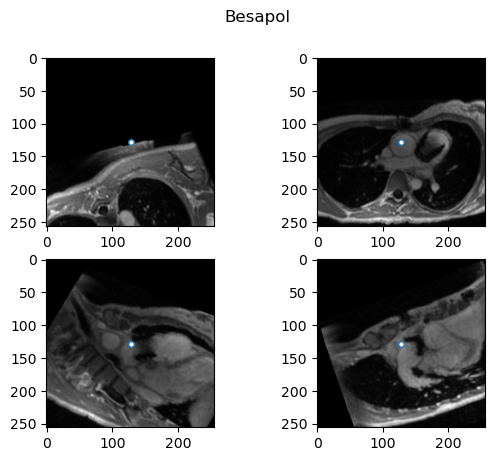

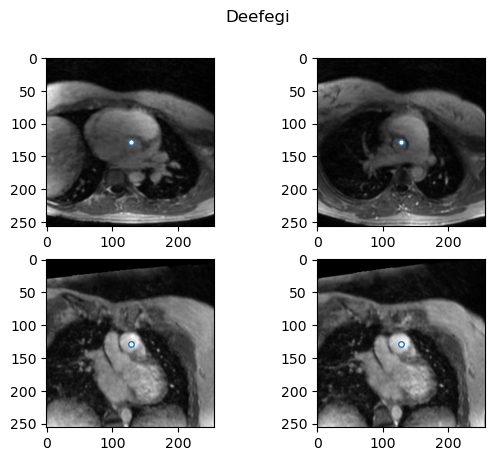

In [ ]:
%matplotlib notebook
for pid in test_prd:
    flowecc = np.array(test_flw[pid])
    flowshp = flowecc.shape
    flowrows = np.arange(0, flowshp[0])
    flowcols = np.arange(0, flowshp[1])
    flowslices = np.arange(0, flowshp[2])
    flowtimes = np.arange(0, flowshp[3])
    flowchans = np.arange(0, flowshp[4])
    flowecc[...,-1] = -flowecc[...,-1]
    print('deploying rgi...{}'.format(pid))
    flowrgi = RGI((flowrows, flowcols, flowslices, flowtimes, flowchans), flowecc, bounds_error=False, fill_value=0)
    
    
    time = 2
    channels = [0,2,5,6]

    slice_over_time = np.zeros((len(flowtimes),len(flowrows), len(flowcols), len(flowchans),4))
    plt.figure()
    plt.suptitle(pid)
    for i,ch in enumerate(channels):
        prd = test_prd[pid][0,...,ch]

        b = 45
        box = np.ones_like(prd)
        box[:b,:,:] = 0
        box[:,:b,:] = 0
        box[(192-b):,:,:] = 0
        box[:,(192-b):,:] = 0

        prd = box*prd

        prd_COM = np.array(_get_COM(prd))
        prd_MAX = np.array(np.unravel_index(np.argmax(prd),prd.shape))
    #     print(prd_COM,prd_MAX)
        prd_COM = prd_MAX
        prd_scales = np.array(info[pid]['scales'])

        s_x, s_y, s_z = (prd_COM/prd_scales).astype(int)
        normal_ch,avg_normal_ch = extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, time)

        normal = [test_flw[pid][s_x,s_y,s_z,time,1], test_flw[pid][s_x,s_y,s_z,time,2], -1*test_flw[pid][s_x,s_y,s_z,time,3]]
    #     print(normal, normal_ch,avg_normal_ch)
        normal = avg_normal_ch
        unit = normal/np.linalg.norm(normal)

        Ainv_flow = info[pid]['metadata']['Ainv_flow']
        A_flow = info[pid]['metadata']['A_flow']

        flatn = np.array([0,0,1])
        rot3dto2d = rot(unit,flatn)

        RANGE = 256
        delta = 1.

        temp = np.ones((4,1))
        temp[0:3,0] = [s_x, s_y, s_z]
        coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
        coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)

        xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
        contained_x = np.ravel(xx2)
        contained_y = np.ravel(yy2)
        contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]

        rot2dto3d = rot(flatn,unit)
        pts = np.zeros((3, len(contained_x)))
        pts[0,:] = contained_x
        pts[1,:] = contained_y
        pts[2,:] = contained_z
        temp = np.matmul(rot2dto3d,pts)

        pts = np.ones((4, len(contained_x)))
        pts[0,:] = temp[0,:]
        pts[1,:] = temp[1,:]
        pts[2,:] = temp[2,:]
        pts = np.matmul(np.linalg.inv(A_flow),pts)
        pts = pts[0:-1,:]

        flow_rcs_sampled = pts.T

        rgi_sampled = np.ones((len(contained_x),4))
        for c in range(4):
            linpts = np.ones((len(flow_rcs_sampled), 5))
            linpts[:,0:3] = np.copy(flow_rcs_sampled)
            linpts[:,3] = t
            linpts[:,4] = c
            rgi_sampled[:,c] = flowrgi(linpts)

        sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)

        ax = plt.subplot(2,2,i+1)
        ax.imshow(sampled_slice[...,0], cmap='gray')
        ax.plot(128,128, marker="o", markersize=4, markerfacecolor="white")


In [9]:
test_prd.keys()

<KeysViewHDF5 ['Besapol', 'Deefegi', 'Dehithu', 'Dukasa', 'Fegaygun', 'Fenoopub', 'Fratalooy', 'Gajefe', 'Giretap', 'Goxankot', 'Hetero', 'Hudutre', 'Jefoje', 'Kohugonk', 'Mifoyeg', 'Motale', 'Mozufuck', 'Narikag', 'Natotag', 'Noukumu', 'Nuebafru', 'Okiegop', 'Quiflula', 'Quisculjug', 'Repusug', 'Retasu', 'Sacureed', 'Scoostepip', 'Semagon', 'Sifaci', 'Tasnicu', 'Tesrenil', 'Tibomol', 'Tiheerien', 'Urquidash']>

In [10]:
prd = test_prd[pid][0,...,0]

In [11]:
prd.shape

(192, 192, 64)

In [10]:
RESLICEPATH = os.path.join(DATAPATH, 'testing_locnet_reslice-v3_b8_e300_augment_smaller-gauss_sub-volume-resume_chkpt--49-0.0111.hdf5')

In [11]:
print(RESLICEPATH)

/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/testing_locnet_reslice-v1_b8_e300_redo_augment_increased_full_mse_alph-0.015_beta-1_3e-5-no-subvolume_fixed-dyn-range_chkpt-resume-1--118-0.0029.hdf5.hdf5


In [12]:
os.path.isfile(RESLICEPATH)

False

In [79]:
A_flow = info['Repusug']['metadata']['A_flow']
print(A_flow)
print()

A_flow_old = info['Repusug']['metadata']['A_flow_old']
print(A_flow_old)

[[   0.            1.48437477    0.         -207.02      ]
 [   1.48437477    0.            0.         -213.258     ]
 [   0.            0.           -2.80000538  224.88800538]
 [   0.            0.            0.            1.        ]]

[[   0.            1.48437477    0.         -207.02      ]
 [   1.48437477    0.            0.         -213.258     ]
 [   0.            0.            2.80000538  -38.3125    ]
 [   0.            0.            0.            1.        ]]


In [19]:
problem_pids = []

b = 45
box = np.ones_like(prd)
box[:b,:,:] = 0
box[:,:b,:] = 0
box[(192-b):,:,:] = 0
box[:,(192-b):,:] = 0

for pid in tqdm(test_prd):
    try:
        flowecc = np.array(test_flw[pid])
        flowshp = flowecc.shape
        flowrows = np.arange(0, flowshp[0])
        flowcols = np.arange(0, flowshp[1])
        flowslices = np.arange(0, flowshp[2])
        flowtimes = np.arange(0, flowshp[3])
        flowchans = np.arange(0, flowshp[4])
        flowecc[...,-1] = -flowecc[...,-1]
        print('deploying rgi for {}...'.format(pid))
        flowrgi = RGI((flowrows, flowcols, flowslices, flowtimes, flowchans), flowecc, bounds_error=False, fill_value=0)

        time = 2 # time index from which to sample direction flow vector
        channels = [0,2,5,6]

        DIM1, DIM2, DIM3, DIM4, DIM5 = len(flowtimes),len(flowrows), len(flowcols), len(flowchans),4
        slice_over_time = np.zeros((DIM1, DIM2, DIM3, DIM4, DIM5))
        units = []
        normals = []
        COMs = []
        for i,ch in enumerate(channels):
            print('...reslicing channel:{}'.format(i))
            prd = test_prd[pid][0,...,ch]
            prd = box*prd

            prd_COM = np.array(_get_COM(prd))
            prd_MAX = np.array(np.unravel_index(np.argmax(prd),prd.shape))
        #     print(prd_COM,prd_MAX)
            prd_COM = prd_MAX
            prd_scales = np.array(info[pid]['scales'])

            s_x, s_y, s_z = (prd_COM/prd_scales).astype(int)
            normal_ch,avg_normal_ch = extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, time)

            normal = [test_flw[pid][s_x,s_y,s_z,time,1], test_flw[pid][s_x,s_y,s_z,time,2], -1*test_flw[pid][s_x,s_y,s_z,time,3]]
#             print(normal, normal_ch,avg_normal_ch)
            normal = avg_normal_ch
            unit = normal/np.linalg.norm(normal)

            Ainv_flow = info[pid]['metadata']['Ainv_flow']
            A_flow = info[pid]['metadata']['A_flow']

            flatn = np.array([0,0,1])
            rot3dto2d = rot(unit,flatn)

            RANGE = 256
            delta = 1.

            temp = np.ones((4,1))
            temp[0:3,0] = [s_x, s_y, s_z]
            coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
            coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)

            xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
            contained_x = np.ravel(xx2)
            contained_y = np.ravel(yy2)
            contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]

            rot2dto3d = rot(flatn,unit)
            pts = np.zeros((3, len(contained_x)))
            pts[0,:] = contained_x
            pts[1,:] = contained_y
            pts[2,:] = contained_z
            temp = np.matmul(rot2dto3d,pts)

            pts = np.ones((4, len(contained_x)))
            pts[0,:] = temp[0,:]
            pts[1,:] = temp[1,:]
            pts[2,:] = temp[2,:]
            pts = np.matmul(np.linalg.inv(A_flow),pts)
            pts = pts[0:-1,:]

            flow_rcs_sampled = pts.T

            for t in range(20):
                rgi_sampled = np.ones((len(contained_x),4))
                linpts = np.ones((len(flow_rcs_sampled), 5))
                linpts[:,0:3] = np.copy(flow_rcs_sampled)
                linpts[:,3] = t
                for c in range(4):
                    linpts[:,4] = c
                    rgi_sampled[:,c] = flowrgi(linpts)

                sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)
                slice_over_time[t,...,i] = sampled_slice[...]
            units.append(unit)
            normals.append(normal)
            COMs.append(prd_COM)
        
        print('...saving...')     
        with h5py.File(RESLICEPATH, 'a') as outh5:
            if pid not in outh5:
                outh5.create_dataset(pid, data=slice_over_time, compression='lzf', chunks=True,
                                    maxshape=(DIM1, DIM2, DIM3, DIM4, DIM5))
                outh5[pid].attrs['unit_normal'] = units
                outh5[pid].attrs['normal'] = normals
                outh5[pid].attrs['COM_3D'] = COMs
                print('SUCCESS @ {} {}'.format(pid,slice_over_time.shape))
    except:
        traceback.print_exc()
        print('FAILURE @ {}'.format(pid))
        problem_pids.append(pid)
    

  0%|                                                                                  | 0/35 [00:00<?, ?it/s]

deploying rgi for Besapol...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...
SUCCESS @ Besapol (20, 256, 256, 4, 4)


  3%|██                                                                        | 1/35 [00:32<18:23, 32.46s/it]

deploying rgi for Deefegi...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


  6%|████▏                                                                     | 2/35 [01:03<17:27, 31.76s/it]

SUCCESS @ Deefegi (20, 256, 256, 4, 4)
deploying rgi for Dehithu...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


  9%|██████▎                                                                   | 3/35 [01:34<16:40, 31.25s/it]

SUCCESS @ Dehithu (20, 256, 256, 4, 4)
deploying rgi for Dukasa...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...
SUCCESS @ Dukasa (20, 256, 256, 4, 4)


 11%|████████▍                                                                 | 4/35 [02:05<16:11, 31.33s/it]

deploying rgi for Fegaygun...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 14%|██████████▌                                                               | 5/35 [02:38<15:49, 31.64s/it]

SUCCESS @ Fegaygun (20, 256, 256, 4, 4)
deploying rgi for Fenoopub...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 17%|████████████▋                                                             | 6/35 [03:03<14:12, 29.39s/it]

SUCCESS @ Fenoopub (20, 256, 256, 4, 4)
deploying rgi for Fratalooy...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 20%|██████████████▊                                                           | 7/35 [03:33<13:49, 29.63s/it]

SUCCESS @ Fratalooy (20, 256, 256, 4, 4)
deploying rgi for Gajefe...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 23%|████████████████▉                                                         | 8/35 [03:58<12:40, 28.17s/it]

SUCCESS @ Gajefe (20, 256, 256, 4, 4)
deploying rgi for Giretap...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 26%|███████████████████                                                       | 9/35 [04:29<12:34, 29.02s/it]

SUCCESS @ Giretap (20, 256, 256, 4, 4)
deploying rgi for Goxankot...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 29%|████████████████████▊                                                    | 10/35 [05:04<12:54, 30.98s/it]

SUCCESS @ Goxankot (20, 256, 256, 4, 4)
deploying rgi for Hetero...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 31%|██████████████████████▉                                                  | 11/35 [05:36<12:33, 31.41s/it]

SUCCESS @ Hetero (20, 256, 256, 4, 4)
deploying rgi for Hudutre...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...
SUCCESS @ Hudutre (20, 256, 256, 4, 4)


 34%|█████████████████████████                                                | 12/35 [06:11<12:22, 32.27s/it]

deploying rgi for Jefoje...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 37%|███████████████████████████                                              | 13/35 [06:43<11:51, 32.35s/it]

SUCCESS @ Jefoje (20, 256, 256, 4, 4)
deploying rgi for Kohugonk...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 40%|█████████████████████████████▏                                           | 14/35 [07:18<11:32, 32.98s/it]

SUCCESS @ Kohugonk (20, 256, 256, 4, 4)
deploying rgi for Mifoyeg...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 43%|███████████████████████████████▎                                         | 15/35 [07:51<11:02, 33.13s/it]

SUCCESS @ Mifoyeg (20, 256, 256, 4, 4)
deploying rgi for Motale...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 46%|█████████████████████████████████▎                                       | 16/35 [08:23<10:21, 32.72s/it]

SUCCESS @ Motale (20, 256, 256, 4, 4)
deploying rgi for Mozufuck...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...
SUCCESS @ Mozufuck (20, 256, 256, 4, 4)


 49%|███████████████████████████████████▍                                     | 17/35 [08:59<10:09, 33.84s/it]

deploying rgi for Narikag...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 51%|█████████████████████████████████████▌                                   | 18/35 [09:27<09:06, 32.13s/it]

SUCCESS @ Narikag (20, 256, 256, 4, 4)
deploying rgi for Natotag...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 54%|███████████████████████████████████████▋                                 | 19/35 [10:01<08:43, 32.72s/it]

SUCCESS @ Natotag (20, 256, 256, 4, 4)
deploying rgi for Noukumu...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 57%|█████████████████████████████████████████▋                               | 20/35 [10:26<07:34, 30.27s/it]

SUCCESS @ Noukumu (20, 256, 256, 4, 4)
deploying rgi for Nuebafru...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 60%|███████████████████████████████████████████▊                             | 21/35 [10:59<07:13, 30.93s/it]

SUCCESS @ Nuebafru (20, 256, 256, 4, 4)
deploying rgi for Okiegop...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 63%|█████████████████████████████████████████████▉                           | 22/35 [11:29<06:40, 30.77s/it]

SUCCESS @ Okiegop (20, 256, 256, 4, 4)
deploying rgi for Quiflula...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 66%|███████████████████████████████████████████████▉                         | 23/35 [12:00<06:11, 30.99s/it]

SUCCESS @ Quiflula (20, 256, 256, 4, 4)
deploying rgi for Quisculjug...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 69%|██████████████████████████████████████████████████                       | 24/35 [12:33<05:46, 31.52s/it]

SUCCESS @ Quisculjug (20, 256, 256, 4, 4)
deploying rgi for Repusug...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 71%|████████████████████████████████████████████████████▏                    | 25/35 [12:59<04:59, 29.91s/it]

SUCCESS @ Repusug (20, 256, 256, 4, 4)
deploying rgi for Retasu...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 74%|██████████████████████████████████████████████████████▏                  | 26/35 [13:32<04:35, 30.65s/it]

SUCCESS @ Retasu (20, 256, 256, 4, 4)
deploying rgi for Sacureed...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 77%|████████████████████████████████████████████████████████▎                | 27/35 [14:05<04:11, 31.39s/it]

SUCCESS @ Sacureed (20, 256, 256, 4, 4)
deploying rgi for Scoostepip...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 80%|██████████████████████████████████████████████████████████▍              | 28/35 [14:37<03:42, 31.73s/it]

SUCCESS @ Scoostepip (20, 256, 256, 4, 4)
deploying rgi for Semagon...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 83%|████████████████████████████████████████████████████████████▍            | 29/35 [15:02<02:56, 29.46s/it]

SUCCESS @ Semagon (20, 256, 256, 4, 4)
deploying rgi for Sifaci...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 86%|██████████████████████████████████████████████████████████████▌          | 30/35 [15:33<02:30, 30.04s/it]

SUCCESS @ Sifaci (20, 256, 256, 4, 4)
deploying rgi for Tasnicu...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 89%|████████████████████████████████████████████████████████████████▋        | 31/35 [16:06<02:03, 30.94s/it]

SUCCESS @ Tasnicu (20, 256, 256, 4, 4)
deploying rgi for Tesrenil...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 91%|██████████████████████████████████████████████████████████████████▋      | 32/35 [16:31<01:27, 29.21s/it]

SUCCESS @ Tesrenil (20, 256, 256, 4, 4)
deploying rgi for Tibomol...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...
SUCCESS @ Tibomol (20, 256, 256, 4, 4)


 94%|████████████████████████████████████████████████████████████████████▊    | 33/35 [16:57<00:56, 28.14s/it]

deploying rgi for Tiheerien...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


 97%|██████████████████████████████████████████████████████████████████████▉  | 34/35 [17:30<00:29, 29.56s/it]

SUCCESS @ Tiheerien (20, 256, 256, 4, 4)
deploying rgi for Urquidash...
...reslicing channel:0
...reslicing channel:1
...reslicing channel:2
...reslicing channel:3
...saving...


100%|█████████████████████████████████████████████████████████████████████████| 35/35 [18:06<00:00, 31.03s/it]

SUCCESS @ Urquidash (20, 256, 256, 4, 4)


## reslice but on a spline

In [14]:
flowecc.shape

NameError: name 'flowecc' is not defined

In [9]:
test_prd.keys()

<KeysViewHDF5 ['Bibipnox', 'Cakimtol', 'Dicibi', 'Finkebet', 'Flopika', 'Gifice', 'Hopitat', 'Jugesag', 'Nesescet', 'Nosaybos', 'Nuebafru', 'Petafi', 'Quakitu', 'Quequeri', 'Quisculjug', 'Tabipa']>

In [13]:
## find the coordinates for the max value in each channel for each patient

all_maxes = dict()

for pid in tqdm(test_prd):
    print(pid)
    maxes = np.zeros((8,3))
    for ch in range(0,8):
        prd = test_prd[pid][0,...,ch]
        prd = _center_box_clean(prd)
        prd_MAX = _get_MAX(prd)
        maxes[ch,:] = prd_MAX
    all_maxes[pid] = maxes
    print(maxes)
    print()

  0%|                                                                                                              | 0/16 [00:00<?, ?it/s]

Bibipnox


  6%|██████▍                                                                                               | 1/16 [00:01<00:29,  1.95s/it]

[[ 98. 141.   0.]
 [ 97. 136.   0.]
 [ 95. 140.   0.]
 [118. 136.   7.]
 [100. 137.   1.]
 [ 81. 134.   0.]
 [ 91. 135.   5.]
 [ 83. 138.  11.]]

Cakimtol


 12%|████████████▊                                                                                         | 2/16 [00:03<00:27,  1.94s/it]

[[ 81.  97.  31.]
 [ 79.  92.  24.]
 [ 77.  87.  21.]
 [108. 112.   6.]
 [ 74. 103.  24.]
 [ 78. 104.  20.]
 [ 78. 103.  20.]
 [ 82. 102.  19.]]

Dicibi


 19%|███████████████████▏                                                                                  | 3/16 [00:05<00:25,  1.93s/it]

[[ 68. 143.   0.]
 [ 75. 142.   0.]
 [ 70. 143.   0.]
 [ 86. 142.   5.]
 [ 68. 141.   1.]
 [ 73. 141.   0.]
 [ 81. 141.   3.]
 [ 64. 144.   7.]]

Finkebet


 25%|█████████████████████████▌                                                                            | 4/16 [00:07<00:23,  1.92s/it]

[[ 52. 143.   0.]
 [ 66. 144.   0.]
 [ 61. 145.   0.]
 [ 97.  69.   8.]
 [ 61. 141.   1.]
 [ 58. 141.   0.]
 [ 70. 143.   3.]
 [ 82. 138.  13.]]

Flopika


 31%|███████████████████████████████▉                                                                      | 5/16 [00:09<00:21,  1.92s/it]

[[ 74. 142.   0.]
 [ 77. 140.   0.]
 [ 81. 141.   0.]
 [ 94. 140.   5.]
 [ 70. 140.   1.]
 [ 81. 140.   0.]
 [ 85. 139.   3.]
 [ 79. 134.  11.]]

Gifice


 38%|██████████████████████████████████████▎                                                               | 6/16 [00:11<00:19,  1.92s/it]

[[ 78. 100.  31.]
 [ 77.  91.  31.]
 [ 77.  94.  31.]
 [ 96. 112.  15.]
 [ 69. 105.  29.]
 [ 74. 108.  25.]
 [ 73. 109.  24.]
 [ 80. 105.  25.]]

Hopitat


 44%|████████████████████████████████████████████▋                                                         | 7/16 [00:13<00:17,  1.91s/it]

[[ 83. 105.  32.]
 [ 81. 103.  27.]
 [ 82. 101.  27.]
 [111. 112.  21.]
 [ 80. 113.  23.]
 [ 82. 114.  20.]
 [ 82. 112.  22.]
 [ 86. 113.  21.]]

Jugesag


 50%|███████████████████████████████████████████████████                                                   | 8/16 [00:15<00:15,  1.91s/it]

[[ 86. 101.  31.]
 [ 84.  93.  26.]
 [ 81.  85.  19.]
 [120. 104.  11.]
 [ 80. 103.  24.]
 [ 85. 100.  19.]
 [ 84. 100.  20.]
 [ 86. 101.  19.]]

Nesescet


 56%|█████████████████████████████████████████████████████████▍                                            | 9/16 [00:17<00:13,  1.91s/it]

[[ 92. 103.  35.]
 [ 92. 100.  31.]
 [ 91.  99.  29.]
 [111. 106.  23.]
 [ 87. 113.  28.]
 [ 90. 110.  27.]
 [ 92. 110.  27.]
 [ 95. 109.  26.]]

Nosaybos


 62%|███████████████████████████████████████████████████████████████▏                                     | 10/16 [00:19<00:11,  1.92s/it]

[[ 89.  97.  33.]
 [ 89.  95.  30.]
 [ 89.  93.  27.]
 [119. 103.  26.]
 [ 83. 105.  25.]
 [ 88. 106.  23.]
 [ 88. 105.  22.]
 [ 90. 104.  22.]]

Nuebafru


 69%|█████████████████████████████████████████████████████████████████████▍                               | 11/16 [00:21<00:09,  1.92s/it]

[[ 86. 102.  32.]
 [ 83.  97.  28.]
 [ 81.  91.  25.]
 [120. 112.  21.]
 [ 80. 111.  28.]
 [ 86. 108.  23.]
 [ 86. 108.  25.]
 [ 88. 109.  23.]]

Petafi


 75%|███████████████████████████████████████████████████████████████████████████▊                         | 12/16 [00:23<00:07,  1.92s/it]

[[ 85. 103.  33.]
 [ 81.  98.  28.]
 [ 82.  93.  26.]
 [ 97. 114.  15.]
 [ 78. 111.  29.]
 [ 81. 109.  25.]
 [ 82. 112.  26.]
 [ 84. 109.  26.]]

Quakitu


 81%|██████████████████████████████████████████████████████████████████████████████████                   | 13/16 [00:24<00:05,  1.91s/it]

[[ 65.  47.   0.]
 [107.  88.  63.]
 [ 59.  55.  63.]
 [104.  67.  22.]
 [ 65.  45.   0.]
 [146.  52.   0.]
 [144.  52.   5.]
 [145.  55.   5.]]

Quequeri


 88%|████████████████████████████████████████████████████████████████████████████████████████▍            | 14/16 [00:26<00:03,  1.91s/it]

[[ 91.  97.  30.]
 [ 91.  93.  27.]
 [ 92.  91.  25.]
 [121. 107.  23.]
 [ 86. 101.  24.]
 [ 90. 100.  21.]
 [ 90. 102.  22.]
 [ 94. 103.  21.]]

Quisculjug


 94%|██████████████████████████████████████████████████████████████████████████████████████████████▋      | 15/16 [00:28<00:01,  1.92s/it]

[[ 83. 105.  32.]
 [ 82. 101.  29.]
 [ 83.  99.  27.]
 [103. 107.  15.]
 [ 78. 111.  27.]
 [ 83. 112.  25.]
 [ 82. 112.  25.]
 [ 86. 111.  25.]]

Tabipa


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:30<00:00,  1.92s/it]

[[ 77. 135.   0.]
 [ 74. 132.   0.]
 [ 74. 130.   0.]
 [ 84.  57.   8.]
 [ 81. 133.   1.]
 [ 76. 132.   0.]
 [ 74. 131.   5.]
 [ 77. 133.   4.]]



In [14]:
## compute 5 point aorta and pulmonary splines
all_splines = dict()

for pid in tqdm(test_prd):
    init_dict = dict()
    
    A1 = all_maxes[pid][0,...] # proximal aorta ch
    A5 = all_maxes[pid][2,...] # distal aorta ch
    A_spline = spline_3d_5pts(A1,A5)
    
    # we do not want the distal ascending aorta because it starts curving and so
    # the spline direction is no longer as close to the flow direction. therefore
    # we are obtaining 5 evenly spaced points along the originally computed spline
    A5 = A_spline[3]
    A_spline = spline_3d_5pts(A1,A5)
    A_spline = np.around(A_spline)
    
    P1 = all_maxes[pid][4,...] # proximal pulmonary ch
    P5 = all_maxes[pid][6,...] # distal pulmonary ch
    P_spline = spline_3d_5pts(P1,P5)
    P_spline = np.around(P_spline)
    
    init_dict['Aorta'] = A_spline
    init_dict['Pulmonary'] = P_spline
    print(pid)
    print(A_spline)
    print()
    print(P_spline)
    print()
    
    all_splines[pid] = init_dict

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 883.92it/s]

Bibipnox
[[ 98. 141.   0.]
 [ 97. 141.   0.]
 [ 97. 141.   0.]
 [ 96. 140.   0.]
 [ 96. 140.   0.]]

[[100. 137.   1.]
 [ 98. 136.   2.]
 [ 96. 136.   3.]
 [ 93. 136.   4.]
 [ 91. 135.   5.]]

Cakimtol
[[81. 97. 31.]
 [80. 95. 29.]
 [80. 93. 27.]
 [79. 91. 25.]
 [78. 90. 24.]]

[[ 74. 103.  24.]
 [ 75. 103.  23.]
 [ 76. 103.  22.]
 [ 77. 103.  21.]
 [ 78. 103.  20.]]

Dicibi
[[ 68. 143.   0.]
 [ 68. 143.   0.]
 [ 69. 143.   0.]
 [ 69. 143.   0.]
 [ 70. 143.   0.]]

[[ 68. 141.   1.]
 [ 71. 141.   2.]
 [ 74. 141.   2.]
 [ 78. 141.   2.]
 [ 81. 141.   3.]]

Finkebet
[[ 52. 143.   0.]
 [ 54. 143.   0.]
 [ 55. 144.   0.]
 [ 57. 144.   0.]
 [ 59. 144.   0.]]

[[ 61. 141.   1.]
 [ 63. 142.   2.]
 [ 66. 142.   2.]
 [ 68. 142.   2.]
 [ 70. 143.   3.]]

Flopika
[[ 74. 142.   0.]
 [ 75. 142.   0.]
 [ 77. 142.   0.]
 [ 78. 141.   0.]
 [ 79. 141.   0.]]

[[ 70. 140.   1.]
 [ 74. 140.   2.]
 [ 78. 140.   2.]
 [ 81. 139.   2.]
 [ 85. 139.   3.]]

Gifice
[[ 78. 100.  31.]
 [ 78.  99.  31.]
 [ 78.  98

In [15]:
## compute the normal and unit vectors for each spline

for pid in tqdm(test_prd):
    init_dict = all_splines[pid]
    prd_scales = np.array(info[pid]['scales'])
    Ainv_flow = info[pid]['metadata']['Ainv_flow']
    A_flow = info[pid]['metadata']['A_flow']
    
    A1 = init_dict['Aorta'][0,...].T
    A5 = init_dict['Aorta'][4,...].T
    P1 = init_dict['Pulmonary'][0,...].T
    P5 = init_dict['Pulmonary'][4,...].T
    
    temp = np.ones((4,4))
    for i,p in enumerate([A1,A5,P1,P5]):
        temp[:-1,i] = p
        
    real_pts = np.matmul(A_flow,temp)
    A1 = real_pts[:-1,0].T
    A5 = real_pts[:-1,1].T
    P1 = real_pts[:-1,2].T
    P5 = real_pts[:-1,3].T
    
    A_normal = vector_from_points(A1,A5)
    A_unit = A_normal/np.linalg.norm(A_normal)
    P_normal = vector_from_points(P1,P5)
    P_unit = P_normal/np.linalg.norm(P_normal)
    
    init_dict['Aorta_normal'] = A_normal
    init_dict['Aorta_unit'] = A_unit
    init_dict['Pulmonary_normal'] = P_normal
    init_dict['Pulmonary_unit'] = P_unit
    all_splines[pid] = init_dict

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 466.01it/s]


In [16]:
RESLICEPATH = os.path.join(DATAPATH, 'testing_locnet_reslice-splines_v4_b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032.hdf5')
RESLICEPATH = os.path.join(DATAPATH, 'testing_locnet_reslice-v1_b8_e300_redo_augment_increased_full_mse_alph-0.015_beta-1_3e-5-no-subvolume_fixed-dyn-range_chkpt-resume-1--118-0.0029.hdf5.hdf5')
RESLICEPATH = os.path.join(DATAPATH, 'ge-testing_locnet_reslice-splines_v1-b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032.hdf5')
print(RESLICEPATH)

/home/ayeluru/4d-flow-automation/ge-testing/ge-testing_locnet_reslice-splines_v1-b8_e300_augment_fine-tune-again_no-subvolume_chkpt--73-0.0032.hdf5


In [17]:
problem_pids = []

for pid in tqdm(test_prd):
    try:
        ## deploy RGI for interpolation

        flowecc = np.array(test_flw[pid])
        flowshp = flowecc.shape
        flowrows = np.arange(0, flowshp[0])
        flowcols = np.arange(0, flowshp[1])
        flowslices = np.arange(0, flowshp[2])
        flowtimes = np.arange(0, flowshp[3])
        flowchans = np.arange(0, flowshp[4])
        flowecc[...,-1] = -flowecc[...,-1]
        print('deploying rgi for {}...'.format(pid))
        flowrgi = RGI((flowrows, flowcols, flowslices, flowtimes, flowchans), flowecc, bounds_error=False, fill_value=0)

        ## initialize holders for the data

        DIM1, DIM2, DIM3, DIM4, DIM5, DIM6 = len(flowtimes),len(flowrows), len(flowcols), len(flowchans),5,2 # DIM4 refers to mag,x,y,z, DIM5 refers to the points in the spline and DIM6 refers to the specific spline (i.e. aorta vs pulmonary)
        slices_over_time = np.zeros((DIM1, DIM2, DIM3, DIM4, DIM5))
        slices_over_spline = np.zeros((DIM1, DIM2, DIM3, DIM4, DIM5,DIM6))
        units = []
        normals = []
        COMs = []

        ## resample

        prd_scales = np.array(info[pid]['scales'])

        for sys_ch, system in enumerate(['Aorta','Pulmonary']):
            spline = all_splines[pid][system]
            normal = all_splines[pid][system+'_normal']
            unit = all_splines[pid][system+'_unit']

            for i in range(spline.shape[0]):
                pt = spline[i,...]
                s_x, s_y, s_z = (list(pt)/prd_scales).astype(int)

                Ainv_flow = info[pid]['metadata']['Ainv_flow']
                A_flow = info[pid]['metadata']['A_flow']

                flatn = np.array([0,0,1])
                rot3dto2d = rot(unit,flatn)

                RANGE = 256
                delta = 1.

                temp = np.ones((4,1))
                temp[0:3,0] = [s_x, s_y, s_z]
                coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
                coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)

                xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
                contained_x = np.ravel(xx2)
                contained_y = np.ravel(yy2)
                contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]

                rot2dto3d = rot(flatn,unit)
                pts = np.zeros((3, len(contained_x)))
                pts[0,:] = contained_x
                pts[1,:] = contained_y
                pts[2,:] = contained_z
                temp = np.matmul(rot2dto3d,pts)

                pts = np.ones((4, len(contained_x)))
                pts[0,:] = temp[0,:]
                pts[1,:] = temp[1,:]
                pts[2,:] = temp[2,:]
                pts = np.matmul(np.linalg.inv(A_flow),pts)
                pts = pts[0:-1,:]

                flow_rcs_sampled = pts.T

                for t in range(20):
                    rgi_sampled = np.ones((len(contained_x),4))
                    linpts = np.ones((len(flow_rcs_sampled), 5))
                    linpts[:,0:3] = np.copy(flow_rcs_sampled)
                    linpts[:,3] = t
                    for c in range(4):
                        linpts[:,4] = c
                        rgi_sampled[:,c] = flowrgi(linpts)

                    sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)
                    slices_over_time[t,...,i] = sampled_slice[...]
            units.append(list(unit))
            normals.append(list(normal))
            slices_over_spline[...,sys_ch] = slices_over_time[...]

        print('...saving...')     
        with h5py.File(RESLICEPATH, 'a') as outh5:
            if pid not in outh5:
                outh5.create_dataset(pid, data=slices_over_spline, compression='lzf', chunks=True,
                                    maxshape=(DIM1, DIM2, DIM3, DIM4, DIM5, DIM6))
                outh5[pid].attrs['unit_normal'] = units
                outh5[pid].attrs['normal'] = normals
                print('SUCCESS @ {} {}'.format(pid,slices_over_spline.shape))
    except:
        traceback.print_exc()
        print('FAILURE @ {}'.format(pid))
        problem_pids.append(pid)


  0%|                                                                                                              | 0/16 [00:00<?, ?it/s]

deploying rgi for Bibipnox...


  6%|██████▍                                                                                               | 1/16 [01:36<24:13, 96.92s/it]

...saving...
SUCCESS @ Bibipnox (30, 256, 256, 4, 5, 2)
deploying rgi for Cakimtol...


 12%|████████████▋                                                                                        | 2/16 [03:22<23:48, 102.03s/it]

...saving...
SUCCESS @ Cakimtol (20, 256, 256, 4, 5, 2)
deploying rgi for Dicibi...


 19%|███████████████████▏                                                                                  | 3/16 [04:22<17:55, 82.70s/it]

...saving...
SUCCESS @ Dicibi (30, 256, 256, 4, 5, 2)
deploying rgi for Finkebet...


 25%|█████████████████████████▌                                                                            | 4/16 [05:28<15:15, 76.26s/it]

...saving...
SUCCESS @ Finkebet (30, 256, 256, 4, 5, 2)
deploying rgi for Flopika...


 31%|███████████████████████████████▉                                                                      | 5/16 [06:30<13:01, 71.03s/it]

...saving...
SUCCESS @ Flopika (30, 256, 256, 4, 5, 2)
deploying rgi for Gifice...


 38%|██████████████████████████████████████▎                                                               | 6/16 [07:44<11:59, 71.93s/it]

...saving...
SUCCESS @ Gifice (20, 256, 256, 4, 5, 2)
deploying rgi for Hopitat...


Traceback (most recent call last):
  File "/tmp/ipykernel_1308568/35248780.py", line 84, in <module>
    sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)
  File "<__array_function__ internals>", line 6, in reshape
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/numpy/core/fromnumeric.py", line 298, in reshape
    return _wrapfunc(a, 'reshape', newshape, order=order)
  File "/home/ayeluru/miniconda3/envs/localization-test/lib/python3.7/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: cannot reshape array of size 262144 into shape (512,512,4)
 44%|████████████████████████████████████████████▋                                                         | 7/16 [09:52<13:34, 90.55s/it]

FAILURE @ Hopitat
deploying rgi for Jugesag...
...saving...


 50%|███████████████████████████████████████████████████                                                   | 8/16 [11:03<11:14, 84.32s/it]

SUCCESS @ Jugesag (20, 256, 256, 4, 5, 2)
deploying rgi for Nesescet...
...saving...


 56%|█████████████████████████████████████████████████████████▍                                            | 9/16 [12:02<08:53, 76.24s/it]

SUCCESS @ Nesescet (20, 256, 256, 4, 5, 2)
deploying rgi for Nosaybos...


 62%|███████████████████████████████████████████████████████████████▏                                     | 10/16 [13:16<07:32, 75.48s/it]

...saving...
SUCCESS @ Nosaybos (20, 256, 256, 4, 5, 2)
deploying rgi for Nuebafru...


 69%|█████████████████████████████████████████████████████████████████████▍                               | 11/16 [14:20<06:00, 72.17s/it]

...saving...
SUCCESS @ Nuebafru (20, 256, 256, 4, 5, 2)
deploying rgi for Petafi...


 75%|███████████████████████████████████████████████████████████████████████████▊                         | 12/16 [15:44<05:02, 75.68s/it]

...saving...
SUCCESS @ Petafi (20, 256, 256, 4, 5, 2)
deploying rgi for Quakitu...


 81%|██████████████████████████████████████████████████████████████████████████████████                   | 13/16 [16:40<03:29, 69.71s/it]

...saving...
SUCCESS @ Quakitu (20, 256, 256, 4, 5, 2)
deploying rgi for Quequeri...


 88%|████████████████████████████████████████████████████████████████████████████████████████▍            | 14/16 [17:43<02:15, 67.81s/it]

...saving...
SUCCESS @ Quequeri (20, 256, 256, 4, 5, 2)
deploying rgi for Quisculjug...


 94%|██████████████████████████████████████████████████████████████████████████████████████████████▋      | 15/16 [18:59<01:10, 70.18s/it]

...saving...
SUCCESS @ Quisculjug (20, 256, 256, 4, 5, 2)
deploying rgi for Tabipa...


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [19:56<00:00, 74.75s/it]

...saving...
SUCCESS @ Tabipa (30, 256, 256, 4, 5, 2)


## find the localization distances

In [25]:
for pid in tqdm(test_lbl):
    print(pid, test_lbl[pid].shape)

 ... (more hidden) ...

Besapol (20, 192, 192, 64, 4)
Deefegi (20, 192, 192, 64, 4)
Dehithu (20, 192, 192, 64, 4)
Dukasa (20, 192, 192, 64, 4)
Fegaygun (20, 192, 192, 64, 4)
Fenoopub (20, 192, 192, 64, 4)
Fratalooy (20, 192, 192, 64, 4)
Gajefe (20, 192, 192, 64, 4)
Giretap (20, 192, 192, 64, 4)
Goxankot (20, 192, 192, 64, 4)
Hetero (20, 192, 192, 64, 4)
Hudutre (20, 192, 192, 64, 4)
Jefoje (20, 192, 192, 64, 4)
Kohugonk (20, 192, 192, 64, 4)
Mifoyeg (20, 192, 192, 64, 4)
Motale (20, 192, 192, 64, 4)
Mozufuck (20, 192, 192, 64, 4)
Narikag (20, 192, 192, 64, 4)
Natotag (20, 192, 192, 64, 4)
Noukumu (20, 192, 192, 64, 4)
Nuebafru (20, 192, 192, 64, 4)
Okiegop (20, 192, 192, 64, 4)
Quiflula (20, 192, 192, 64, 4)
Quisculjug (20, 192, 192, 64, 4)
Repusug (20, 192, 192, 64, 4)
Retasu (20, 192, 192, 64, 4)
Sacureed (20, 192, 192, 64, 4)
Scoostepip (20, 192, 192, 64, 4)
Semagon (20, 192, 192, 64, 4)
Sifaci (20, 192, 192, 64, 4)
Tasnicu (20, 192, 192, 64, 4)
Tesrenil (20, 192, 192, 64, 4)
Tibomol (20, 192, 192, 64, 4)


In [26]:
gt_maxes = dict()

for pid in tqdm(test_lbl):
    print(pid)
    maxes = np.zeros((4,3))
    for ch in range(0,4):
        lbl = test_lbl[pid][2,...,ch]
        lbl = _center_box_clean(lbl)
        lbl_MAX = _get_MAX(lbl)
        maxes[ch,:] = lbl_MAX
    gt_maxes[pid] = maxes
    print(maxes)
    print()

 ... (more hidden) ...

Besapol


 ... (more hidden) ...

[[ 75. 106.  38.]
 [ 70.  99.  32.]
 [ 67. 124.  36.]
 [ 72. 118.  30.]]

Deefegi


 ... (more hidden) ...

[[ 88.  97.  33.]
 [ 86.  91.  27.]
 [ 77. 105.  28.]
 [ 80. 105.  27.]]

Dehithu


 ... (more hidden) ...

[[ 83.  99.  34.]
 [ 80.  95.  32.]
 [ 79. 114.  31.]
 [ 86. 109.  24.]]

Dukasa


 ... (more hidden) ...

[[ 90. 110.  36.]
 [ 88.  94.  28.]
 [ 82. 115.  29.]
 [ 89. 112.  27.]]

Fegaygun


 ... (more hidden) ...

[[ 83. 107.  34.]
 [ 80. 100.  28.]
 [ 80. 113.  26.]
 [ 78. 114.  27.]]

Fenoopub


 ... (more hidden) ...

[[ 75. 103.  33.]
 [ 71.  92.  21.]
 [ 67. 111.  26.]
 [ 76. 106.  21.]]

Fratalooy


 ... (more hidden) ...

[[ 84.  98.  35.]
 [ 84.  92.  30.]
 [ 77. 112.  31.]
 [ 91. 106.  28.]]

Gajefe


 ... (more hidden) ...

[[ 78.  97.  38.]
 [ 76.  91.  33.]
 [ 66. 104.  33.]
 [ 72. 105.  30.]]

Giretap


 ... (more hidden) ...

[[ 87.  96.  32.]
 [ 85.  89.  25.]
 [ 76. 104.  29.]
 [ 81. 105.  25.]]

Goxankot


 ... (more hidden) ...

[[ 75. 101.  33.]
 [ 73.  95.  27.]
 [ 71. 110.  27.]
 [ 76. 108.  24.]]

Hetero


 ... (more hidden) ...

[[ 81. 104.  30.]
 [ 77.  98.  24.]
 [ 76. 116.  26.]
 [ 81. 112.  23.]]

Hudutre


 ... (more hidden) ...

[[ 77. 101.  34.]
 [ 73.  91.  25.]
 [ 70. 110.  28.]
 [ 76. 107.  25.]]

Jefoje


 ... (more hidden) ...

[[ 81. 107.  43.]
 [ 72.  95.  37.]
 [ 73. 110.  35.]
 [ 73. 109.  34.]]

Kohugonk


 ... (more hidden) ...

[[ 79.  94.  37.]
 [ 82.  88.  25.]
 [ 74. 109.  35.]
 [ 84. 101.  28.]]

Mifoyeg


 ... (more hidden) ...

[[ 87. 101.  37.]
 [ 83.  89.  26.]
 [ 84. 106.  27.]
 [ 88. 105.  26.]]

Motale


 ... (more hidden) ...

[[ 80.  97.  34.]
 [ 78.  92.  25.]
 [ 69. 104.  30.]
 [ 78. 106.  26.]]

Mozufuck


 ... (more hidden) ...

[[ 69.  96.  34.]
 [ 64.  90.  29.]
 [ 69. 109.  28.]
 [ 71. 110.  29.]]

Narikag


 ... (more hidden) ...

[[76. 87. 34.]
 [79. 75. 24.]
 [69. 90. 26.]
 [79. 90. 22.]]

Natotag


 ... (more hidden) ...

[[ 77.  99.  30.]
 [ 77.  94.  26.]
 [ 73. 116.  28.]
 [ 78. 112.  25.]]

Noukumu


 ... (more hidden) ...

[[ 88. 104.  30.]
 [ 82.  98.  27.]
 [ 75. 118.  32.]
 [ 74. 117.  26.]]

Nuebafru


 ... (more hidden) ...

[[ 80. 103.  36.]
 [ 76.  93.  31.]
 [ 70. 110.  28.]
 [ 71. 110.  29.]]

Okiegop


 ... (more hidden) ...

[[ 78. 102.  35.]
 [ 78.  98.  30.]
 [ 75. 115.  28.]
 [ 77. 117.  27.]]

Quiflula


 ... (more hidden) ...

[[81. 88. 35.]
 [82. 82. 28.]
 [70. 94. 29.]
 [75. 97. 27.]]

Quisculjug


 ... (more hidden) ...

[[ 84. 109.  37.]
 [ 78.  93.  26.]
 [ 74. 111.  26.]
 [ 80. 112.  24.]]

Repusug


 ... (more hidden) ...

[[ 90. 110.  38.]
 [ 89. 111.  38.]
 [ 85. 119.  30.]
 [ 81. 123.  32.]]

Retasu


 ... (more hidden) ...

[[ 85. 102.  29.]
 [ 82.  88.  17.]
 [ 78. 104.  18.]
 [ 82. 103.  16.]]

Sacureed


 ... (more hidden) ...

[[85. 75. 33.]
 [91. 75. 26.]
 [75. 76. 28.]
 [79. 84. 26.]]

Scoostepip


 ... (more hidden) ...

[[ 90. 104.  35.]
 [ 86.  95.  28.]
 [ 84. 109.  26.]
 [ 86. 109.  26.]]

Semagon


 ... (more hidden) ...

[[ 88.  95.  30.]
 [ 85.  84.  19.]
 [ 78. 100.  23.]
 [ 76. 101.  24.]]

Sifaci


 ... (more hidden) ...

[[ 81. 100.  40.]
 [ 76.  90.  28.]
 [ 71. 109.  36.]
 [ 73. 110.  35.]]

Tasnicu


 ... (more hidden) ...

[[ 82.  96.  34.]
 [ 81.  88.  25.]
 [ 74. 102.  27.]
 [ 80. 103.  25.]]

Tesrenil


 ... (more hidden) ...

[[ 88.  95.  49.]
 [ 74.  81.  43.]
 [ 79. 101.  40.]
 [ 84.  95.  38.]]

Tibomol


 ... (more hidden) ...

[[78. 89. 39.]
 [73. 74. 33.]
 [67. 94. 34.]
 [72. 92. 31.]]

Tiheerien


 ... (more hidden) ...

[[ 93. 106.  36.]
 [ 90.  95.  28.]
 [ 83. 115.  31.]
 [ 90. 112.  26.]]

Urquidash


 ... (more hidden) ...

[[ 86. 103.  30.]
 [ 86.  97.  24.]
 [ 82. 113.  26.]
 [ 88. 112.  24.]]



In [27]:
for pid in gt_maxes:
    print(pid)
    print(all_maxes[pid])
    print()
    print(gt_maxes[pid])
    print()
    print()

Besapol
[[ 78. 105.  38.]
 [ 76. 101.  35.]
 [ 73. 102.  33.]
 [106. 111.  30.]
 [ 78. 117.  29.]
 [ 80. 116.  27.]
 [ 80. 116.  27.]
 [ 81. 115.  27.]]

[[ 75. 106.  38.]
 [ 70.  99.  32.]
 [ 67. 124.  36.]
 [ 72. 118.  30.]]


Deefegi
[[ 93. 102.  34.]
 [ 93.  98.  31.]
 [ 93.  95.  25.]
 [120. 102.  34.]
 [ 83. 109.  29.]
 [ 88. 110.  27.]
 [ 89. 111.  26.]
 [ 91. 110.  26.]]

[[ 88.  97.  33.]
 [ 86.  91.  27.]
 [ 77. 105.  28.]
 [ 80. 105.  27.]]


Dehithu
[[ 94. 104.  34.]
 [ 89.  96.  31.]
 [ 93.  91.  20.]
 [120. 101.  20.]
 [ 92. 111.  25.]
 [ 96. 111.  25.]
 [ 96. 111.  23.]
 [ 98. 110.  23.]]

[[ 83.  99.  34.]
 [ 80.  95.  32.]
 [ 79. 114.  31.]
 [ 86. 109.  24.]]


Dukasa
[[ 95. 108.  35.]
 [ 91. 102.  32.]
 [ 93.  97.  29.]
 [126. 103.  34.]
 [ 87. 115.  29.]
 [ 92. 114.  29.]
 [ 92. 114.  27.]
 [ 97. 112.  26.]]

[[ 90. 110.  36.]
 [ 88.  94.  28.]
 [ 82. 115.  29.]
 [ 89. 112.  27.]]


Fegaygun
[[ 89. 108.  34.]
 [ 85. 104.  30.]
 [ 87. 102.  29.]
 [110. 105.  27.]
 [ 8

In [28]:
df = pd.DataFrame(columns=['Phonetic'])
df['Phonetic'] = list(gt_maxes.keys())
df.set_index('Phonetic', inplace=True)

In [29]:
df['AV_manual'] = None
df['Ao_manual'] = None
df['PV_manual'] = None
df['PA_manual'] = None

df['AV_locnet'] = None
df['STJ_locnet'] = None
df['Ao_locnet'] = None
df['PV_locnet'] = None
df['pPA_locnet'] = None
df['dPA_locnet'] = None

In [30]:
manual_landmarks = ['AV_manual', 'Ao_manual', 'PV_manual', 'PA_manual']

for pid in gt_maxes:
    for ch in range(gt_maxes[pid].shape[0]):
        df.at[pid, manual_landmarks[ch]] = gt_maxes[pid][ch]

In [31]:
auto_landmarks = ['AV_locnet','STJ_locnet','Ao_locnet','PV_locnet','pPA_locnet','dPA_locnet']
auto_channels = [0,1,2,4,5,6]

for pid in all_maxes:
    for i,ch in enumerate(auto_channels):
        df.at[pid, auto_landmarks[i]] = all_maxes[pid][ch]

In [32]:
df

,AV_manual,Ao_manual,PV_manual,PA_manual,AV_locnet,STJ_locnet,Ao_locnet,PV_locnet,pPA_locnet,dPA_locnet
Phonetic,,,,,,,,,,
Besapol,"[75.0, 106.0, 38.0]","[70.0, 99.0, 32.0]","[67.0, 124.0, 36.0]","[72.0, 118.0, 30.0]","[78.0, 105.0, 38.0]","[76.0, 101.0, 35.0]","[73.0, 102.0, 33.0]","[78.0, 117.0, 29.0]","[80.0, 116.0, 27.0]","[80.0, 116.0, 27.0]"
Deefegi,"[88.0, 97.0, 33.0]","[86.0, 91.0, 27.0]","[77.0, 105.0, 28.0]","[80.0, 105.0, 27.0]","[93.0, 102.0, 34.0]","[93.0, 98.0, 31.0]","[93.0, 95.0, 25.0]","[83.0, 109.0, 29.0]","[88.0, 110.0, 27.0]","[89.0, 111.0, 26.0]"
Dehithu,"[83.0, 99.0, 34.0]","[80.0, 95.0, 32.0]","[79.0, 114.0, 31.0]","[86.0, 109.0, 24.0]","[94.0, 104.0, 34.0]","[89.0, 96.0, 31.0]","[93.0, 91.0, 20.0]","[92.0, 111.0, 25.0]","[96.0, 111.0, 25.0]","[96.0, 111.0, 23.0]"
Dukasa,"[90.0, 110.0, 36.0]","[88.0, 94.0, 28.0]","[82.0, 115.0, 29.0]","[89.0, 112.0, 27.0]","[95.0, 108.0, 35.0]","[91.0, 102.0, 32.0]","[93.0, 97.0, 29.0]","[87.0, 115.0, 29.0]","[92.0, 114.0, 29.0]","[92.0, 114.0, 27.0]"
Fegaygun,"[83.0, 107.0, 34.0]","[80.0, 100.0, 28.0]","[80.0, 113.0, 26.0]","[78.0, 114.0, 27.0]","[89.0, 108.0, 34.0]","[85.0, 104.0, 30.0]","[87.0, 102.0, 29.0]","[83.0, 115.0, 29.0]","[86.0, 113.0, 27.0]","[86.0, 114.0, 26.0]"
Fenoopub,"[75.0, 103.0, 33.0]","[71.0, 92.0, 21.0]","[67.0, 111.0, 26.0]","[76.0, 106.0, 21.0]","[83.0, 101.0, 31.0]","[81.0, 96.0, 27.0]","[78.0, 93.0, 21.0]","[78.0, 109.0, 25.0]","[82.0, 107.0, 21.0]","[82.0, 106.0, 20.0]"
Fratalooy,"[84.0, 98.0, 35.0]","[84.0, 92.0, 30.0]","[77.0, 112.0, 31.0]","[91.0, 106.0, 28.0]","[89.0, 99.0, 37.0]","[89.0, 95.0, 35.0]","[91.0, 93.0, 26.0]","[80.0, 117.0, 33.0]","[81.0, 121.0, 33.0]","[82.0, 120.0, 32.0]"
Gajefe,"[78.0, 97.0, 38.0]","[76.0, 91.0, 33.0]","[66.0, 104.0, 33.0]","[72.0, 105.0, 30.0]","[83.0, 99.0, 37.0]","[82.0, 96.0, 34.0]","[83.0, 93.0, 31.0]","[76.0, 105.0, 31.0]","[80.0, 106.0, 29.0]","[80.0, 106.0, 29.0]"
Giretap,"[87.0, 96.0, 32.0]","[85.0, 89.0, 25.0]","[76.0, 104.0, 29.0]","[81.0, 105.0, 25.0]","[93.0, 99.0, 34.0]","[94.0, 94.0, 30.0]","[100.0, 79.0, 21.0]","[82.0, 105.0, 29.0]","[86.0, 106.0, 25.0]","[86.0, 107.0, 24.0]"


In [33]:
df_rcs = copy.deepcopy(df)

In [34]:
df_rcs

,AV_manual,Ao_manual,PV_manual,PA_manual,AV_locnet,STJ_locnet,Ao_locnet,PV_locnet,pPA_locnet,dPA_locnet
Phonetic,,,,,,,,,,
Besapol,"[75.0, 106.0, 38.0]","[70.0, 99.0, 32.0]","[67.0, 124.0, 36.0]","[72.0, 118.0, 30.0]","[78.0, 105.0, 38.0]","[76.0, 101.0, 35.0]","[73.0, 102.0, 33.0]","[78.0, 117.0, 29.0]","[80.0, 116.0, 27.0]","[80.0, 116.0, 27.0]"
Deefegi,"[88.0, 97.0, 33.0]","[86.0, 91.0, 27.0]","[77.0, 105.0, 28.0]","[80.0, 105.0, 27.0]","[93.0, 102.0, 34.0]","[93.0, 98.0, 31.0]","[93.0, 95.0, 25.0]","[83.0, 109.0, 29.0]","[88.0, 110.0, 27.0]","[89.0, 111.0, 26.0]"
Dehithu,"[83.0, 99.0, 34.0]","[80.0, 95.0, 32.0]","[79.0, 114.0, 31.0]","[86.0, 109.0, 24.0]","[94.0, 104.0, 34.0]","[89.0, 96.0, 31.0]","[93.0, 91.0, 20.0]","[92.0, 111.0, 25.0]","[96.0, 111.0, 25.0]","[96.0, 111.0, 23.0]"
Dukasa,"[90.0, 110.0, 36.0]","[88.0, 94.0, 28.0]","[82.0, 115.0, 29.0]","[89.0, 112.0, 27.0]","[95.0, 108.0, 35.0]","[91.0, 102.0, 32.0]","[93.0, 97.0, 29.0]","[87.0, 115.0, 29.0]","[92.0, 114.0, 29.0]","[92.0, 114.0, 27.0]"
Fegaygun,"[83.0, 107.0, 34.0]","[80.0, 100.0, 28.0]","[80.0, 113.0, 26.0]","[78.0, 114.0, 27.0]","[89.0, 108.0, 34.0]","[85.0, 104.0, 30.0]","[87.0, 102.0, 29.0]","[83.0, 115.0, 29.0]","[86.0, 113.0, 27.0]","[86.0, 114.0, 26.0]"
Fenoopub,"[75.0, 103.0, 33.0]","[71.0, 92.0, 21.0]","[67.0, 111.0, 26.0]","[76.0, 106.0, 21.0]","[83.0, 101.0, 31.0]","[81.0, 96.0, 27.0]","[78.0, 93.0, 21.0]","[78.0, 109.0, 25.0]","[82.0, 107.0, 21.0]","[82.0, 106.0, 20.0]"
Fratalooy,"[84.0, 98.0, 35.0]","[84.0, 92.0, 30.0]","[77.0, 112.0, 31.0]","[91.0, 106.0, 28.0]","[89.0, 99.0, 37.0]","[89.0, 95.0, 35.0]","[91.0, 93.0, 26.0]","[80.0, 117.0, 33.0]","[81.0, 121.0, 33.0]","[82.0, 120.0, 32.0]"
Gajefe,"[78.0, 97.0, 38.0]","[76.0, 91.0, 33.0]","[66.0, 104.0, 33.0]","[72.0, 105.0, 30.0]","[83.0, 99.0, 37.0]","[82.0, 96.0, 34.0]","[83.0, 93.0, 31.0]","[76.0, 105.0, 31.0]","[80.0, 106.0, 29.0]","[80.0, 106.0, 29.0]"
Giretap,"[87.0, 96.0, 32.0]","[85.0, 89.0, 25.0]","[76.0, 104.0, 29.0]","[81.0, 105.0, 25.0]","[93.0, 99.0, 34.0]","[94.0, 94.0, 30.0]","[100.0, 79.0, 21.0]","[82.0, 105.0, 29.0]","[86.0, 106.0, 25.0]","[86.0, 107.0, 24.0]"


In [35]:
prd_scales = np.array(info[pid]['scales'])
s_x, s_y, s_z = (prd_COM/prd_scales)

A_flow = info[pid]['metadata']['A_flow']
temp = np.ones((4,1))
temp[0:3,0] = [s_x, s_y, s_z]
coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))

NameError: name 'prd_COM' is not defined

In [36]:
for pid in gt_maxes:
    scales = np.array(info[pid]['scales'])
    A_flow = info[pid]['metadata']['A_flow']
    
    for col in df.columns:
        xyz = df.at[pid,col]
        x, y, z = (xyz/scales)
        
        temp = np.ones((4,1))
        temp[0:3,0] = [x, y, z]
        rcs = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
        
        df_rcs.at[pid,col] = rcs        
    
    

In [37]:
df_rcs

,AV_manual,Ao_manual,PV_manual,PA_manual,AV_locnet,STJ_locnet,Ao_locnet,PV_locnet,pPA_locnet,dPA_locnet
Phonetic,,,,,,,,,,
Besapol,"[41.01551389813335, -34.67192204999998, 34.124...","[27.890545999200015, -44.046927246666655, 59.4...","[74.76543135253334, -49.671930364666665, 42.56...","[63.515458867733344, -40.296925168, 67.8746414...","[39.14051848400001, -29.046918931999983, 34.12...","[31.64053682746666, -32.796921010666665, 46.78...","[33.5155322416, -38.42192412866666, 55.2184055...","[61.640463453600006, -29.046918931999983, 72.0...","[59.76546803946667, -25.2969168533333, 80.5308...","[59.76546803946667, -25.2969168533333, 80.5308..."
Deefegi,"[1.406555170933359, -34.296908538666656, 52.17...","[-9.843417313866667, -38.04691061733331, 75.79...","[16.40651848400003, -54.921919971333324, 71.85...","[16.40651848400003, -49.2969168533333, 75.7965...","[10.781532241600019, -24.92190334199998, 48.23...","[3.281550585066668, -24.92190334199998, 60.046...","[-2.343435657333316, -24.92190334199998, 83.67...","[23.90650014053338, -43.671913735333305, 67.92...","[25.781495554666662, -34.296908538666656, 75.7...","[27.65649096880003, -32.421907499333315, 79.73..."
Dehithu,"[2.6943655920000253, -95.61663547200001, 41.62...","[-6.055588573333296, -102.17916672000001, 49.1...","[35.50669371200004, -104.36667713600002, 52.87...","[24.56925100533337, -89.05410422399999, 79.125...","[13.63180829866667, -71.55402089600003, 41.625...","[-3.8681000319999725, -82.49157297599999, 52.8...","[-14.805542738666645, -73.741531312, 94.125251...","[28.944228088000017, -75.92904172799999, 75.37...","[28.944228088000017, -67.17900006400001, 75.37...","[28.944228088000017, -67.17900006400001, 82.87..."
Dukasa,"[23.20349555466666, -30.546906459999974, 49.49...","[-6.796431071466657, -34.296908538666656, 80.9...","[32.578472625333376, -45.54691477466665, 77.06...","[26.953486382933363, -32.421907499333315, 84.9...","[19.453504726400013, -21.171901263333297, 53.4...","[8.203532241600016, -28.67190542066666, 65.249...","[-1.171444829066644, -24.92190334199998, 77.06...","[32.578472625333376, -36.171909578, 77.0624100...","[30.70347721120001, -26.79690438133332, 77.062...","[30.70347721120001, -26.79690438133332, 84.937..."
Fegaygun,"[10.168509312266679, -48.969380626933315, 7.59...","[-2.9564585866666278, -54.5943668693333, 28.59...","[21.418481797066676, -54.5943668693333, 35.595...","[23.293477211200013, -58.344357697599975, 32.0...","[12.043504726400016, -37.71940814213332, 7.595...","[4.543523069866666, -45.21938979866667, 21.595...","[0.793532241600019, -41.46939897039999, 25.095...","[25.16847262533338, -48.969380626933315, 25.09...","[21.418481797066676, -43.3443943845333, 32.095...","[23.293477211200013, -43.3443943845333, 35.595..."
Fenoopub,"[21.59485154533337, -56.38355469999996, -10.26...","[0.3969062346666874, -64.09189844933331, 31.73...","[37.01153904400002, -71.80024219866664, 14.233...","[27.37610935733335, -54.456468762666645, 31.73...","[17.74067967066665, -40.96686720133329, -3.266...","[8.105249984000011, -44.82103907599998, 10.733...","[2.323992172000004, -50.602296887999984, 31.73...","[33.157367169333355, -50.602296887999984, 17.7...","[29.303195294666665, -42.89395313866666, 31.73...","[27.37610935733335, -42.89395313866666, 35.233..."
Fratalooy,"[12.694877050666662, -88.304125056, 41.6254402...","[-0.4300541973333054, -88.304125056, 60.375377...","[43.31971662933336, -103.61669796800001, 56.62...","[30.19478538133336, -72.99155214400002, 67.875...","[14.882365592000014, -77.36657297599999, 34.12...","[6.1324114266666925, -77.36657297599999, 41.62...","[1.7574343440000177, -72.99155214400002, 75.37...","[54.25715933600003, -97.05416672000001, 49.125...","[63.00711350133335, -94.866656304, 49.12541509...","[60.81962496000003, -92.67914588800002, 52.875..."
Gajefe,"[20.622510352000006, -63.01018755199999, 67.54...","[7.4974478559999795, -67.38520838400001, 87.23...","[35.935083263999985, -89.26031254399999, 87.23...","[38.1225936799

In [38]:
import numpy as np

# Define a function to calculate Euclidean distance between two numpy arrays
def calculate_distance(row, col1, col2):
    return np.linalg.norm(row[col1] - row[col2])

# Apply the function to each row of the DataFrame
print(df.apply(lambda row: calculate_distance(row, 'PV_manual', 'PV_locnet'), axis=1))


Phonetic
Besapol       14.798649
Deefegi        7.280110
Dehithu       14.628739
Dukasa         5.000000
Fegaygun       4.690416
Fenoopub      11.224972
Fratalooy      6.164414
Gajefe        10.246951
Giretap        6.082763
Goxankot       7.348469
Hetero         6.633250
Hudutre        8.124038
Jefoje         6.403124
Kohugonk      16.155494
Mifoyeg        3.000000
Motale         9.110434
Mozufuck      13.928388
Narikag        9.273618
Natotag       11.357817
Noukumu       20.469489
Nuebafru       8.124038
Okiegop        4.242641
Quiflula       6.082763
Quisculjug     5.385165
Repusug        6.403124
Retasu         3.316625
Sacureed       8.660254
Scoostepip     4.358899
Semagon        4.123106
Sifaci        11.357817
Tasnicu        1.414214
Tesrenil       7.071068
Tibomol        8.124038
Tiheerien      9.433981
Urquidash      3.605551
dtype: float64


In [39]:
## aortic landmarks
man_landmarks = ['AV','Ao']
cnn_landmarks = ['AV','STJ','Ao']
for man in man_landmarks:
    for cnn in cnn_landmarks:
        col = man + 'm' + '_' + cnn + 'c'
        df_rcs[col] = df.apply(lambda row: calculate_distance(row, man + '_manual', cnn + '_locnet'), axis=1)

In [42]:
## aortic landmarks reversed order
man_landmarks = ['AV','Ao']
cnn_landmarks = ['AV','STJ','Ao']
for cnn in cnn_landmarks:
    for man in man_landmarks:
        col = cnn + 'c' + '_' + man + 'm'
        df_rcs[col] = df.apply(lambda row: calculate_distance(row, man + '_manual', cnn + '_locnet'), axis=1)

In [41]:
## pulmonary landmarks
man_landmarks = ['PV','PA']
cnn_landmarks = ['PV','pPA','dPA']
for man in man_landmarks:
    for cnn in cnn_landmarks:
        col = man + 'm' + '_' + cnn + 'c'
        df_rcs[col] = df.apply(lambda row: calculate_distance(row, man + '_manual', cnn + '_locnet'), axis=1)

In [43]:
## aortic landmarks reversed order
man_landmarks = ['PV','PA']
cnn_landmarks = ['PV','pPA','dPA']
for cnn in cnn_landmarks:
    for man in man_landmarks:
        col = cnn + 'c' + '_' + man + 'm'
        df_rcs[col] = df.apply(lambda row: calculate_distance(row, man + '_manual', cnn + '_locnet'), axis=1)

In [44]:
display(df_rcs[['AVm_AVc', 'AVm_STJc', 'AVm_Aoc', 'Aom_AVc', 'Aom_STJc', 'Aom_Aoc',
                'PVm_PVc', 'PVm_pPAc', 'PVm_dPAc', 'PAm_PVc', 'PAm_pPAc', 'PAm_dPAc']])


,AVm_AVc,AVm_STJc,AVm_Aoc,Aom_AVc,Aom_STJc,Aom_Aoc,PVm_PVc,PVm_pPAc,PVm_dPAc,PAm_PVc,PAm_pPAc,PAm_dPAc
Phonetic,,,,,,,,,,,,
Besapol,3.162278,5.916080,6.708204,11.661904,7.000000,4.358899,14.798649,17.720045,17.720045,6.164414,8.774964,8.774964
Deefegi,7.141428,5.477226,9.643651,14.798649,10.677078,8.306624,7.280110,12.124356,13.564660,5.385165,9.433981,10.862780
Dehithu,12.083046,7.348469,18.973666,16.763055,9.110434,18.138357,14.628739,18.275667,19.026298,6.403124,10.246951,10.246951
Dukasa,5.477226,9.000000,15.066519,17.146428,9.433981,5.916080,5.000000,10.049876,10.246951,4.123106,4.123106,3.605551
Fegaygun,6.082763,5.385165,8.124038,13.453624,6.708204,7.348469,4.690416,6.082763,6.082763,5.477226,8.062258,8.062258
Fenoopub,8.485281,11.000000,15.905974,18.027756,12.328828,7.071068,11.224972,16.309506,16.911535,5.385165,6.082763,6.082763
Fratalooy,5.477226,5.830952,12.449900,11.090537,7.681146,8.124038,6.164414,10.049876,9.486833,16.340135,18.708287,17.117243
Gajefe,5.477226,5.744563,9.486833,11.357817,7.874008,7.549834,10.246951,14.696938,14.696938,4.123106,8.124038,8.124038
Giretap,7.000000,7.549834,24.062419,15.652476,11.445523,18.466185,6.082763,10.954451,11.575837,4.123106,5.099020,5.477226


In [45]:
display(df_rcs[['AVc_AVm', 'AVc_Aom', 'STJc_AVm', 'STJc_Aom', 'Aoc_AVm', 'Aoc_Aom',
       'PVc_PVm', 'PVc_PAm', 'pPAc_PVm', 'pPAc_PAm', 'dPAc_PVm', 'dPAc_PAm']])


,AVc_AVm,AVc_Aom,STJc_AVm,STJc_Aom,Aoc_AVm,Aoc_Aom,PVc_PVm,PVc_PAm,pPAc_PVm,pPAc_PAm,dPAc_PVm,dPAc_PAm
Phonetic,,,,,,,,,,,,
Besapol,3.162278,11.661904,5.916080,7.000000,6.708204,4.358899,14.798649,6.164414,17.720045,8.774964,17.720045,8.774964
Deefegi,7.141428,14.798649,5.477226,10.677078,9.643651,8.306624,7.280110,5.385165,12.124356,9.433981,13.564660,10.862780
Dehithu,12.083046,16.763055,7.348469,9.110434,18.973666,18.138357,14.628739,6.403124,18.275667,10.246951,19.026298,10.246951
Dukasa,5.477226,17.146428,9.000000,9.433981,15.066519,5.916080,5.000000,4.123106,10.049876,4.123106,10.246951,3.605551
Fegaygun,6.082763,13.453624,5.385165,6.708204,8.124038,7.348469,4.690416,5.477226,6.082763,8.062258,6.082763,8.062258
Fenoopub,8.485281,18.027756,11.000000,12.328828,15.905974,7.071068,11.224972,5.385165,16.309506,6.082763,16.911535,6.082763
Fratalooy,5.477226,11.090537,5.830952,7.681146,12.449900,8.124038,6.164414,16.340135,10.049876,18.708287,9.486833,17.117243
Gajefe,5.477226,11.357817,5.744563,7.874008,9.486833,7.549834,10.246951,4.123106,14.696938,8.124038,14.696938,8.124038
Giretap,7.000000,15.652476,7.549834,11.445523,24.062419,18.466185,6.082763,4.123106,10.954451,5.099020,11.575837,5.477226


In [50]:
df_rcs.columns

Index(['AV_manual', 'Ao_manual', 'PV_manual', 'PA_manual', 'AV_locnet',
       'STJ_locnet', 'Ao_locnet', 'PV_locnet', 'pPA_locnet', 'dPA_locnet',
       'AVm_AVc', 'AVm_STJc', 'AVm_Aoc', 'Aom_AVc', 'Aom_STJc', 'Aom_Aoc',
       'AVc_AVm', 'AVc_Aom', 'STJc_AVm', 'STJc_Aom', 'Aoc_AVm', 'Aoc_Aom',
       'PVm_PVc', 'PVm_pPAc', 'PVm_dPAc', 'PAm_PVc', 'PAm_pPAc', 'PAm_dPAc',
       'PVc_PVm', 'PVc_PAm', 'pPAc_PVm', 'pPAc_PAm', 'dPAc_PVm', 'dPAc_PAm'],
      dtype='object')

In [55]:
DUMPFOLDER = '/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes'
DUMPPATH = os.path.join(DUMPFOLDER,'testing_locnet-ak_spline-rerun_AV-midAo_computations_rcs.pkl')
df_rcs.to_pickle(DUMPPATH)
print(DUMPPATH)

/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/testing_locnet-ak_spline-rerun_AV-midAo_computations_rcs.pkl


In [58]:
DUMPFOLDER = '/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes'
DUMPPATH = os.path.join(DUMPFOLDER,'testing_locnet-ak_spline_AV-midAo_computations_xyz.pkl')
df.to_pickle(DUMPPATH)
print(DUMPPATH)

/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/testing_locnet-ak_spline_AV-midAo_computations_xyz.pkl


In [59]:
FLOWMEASUREMENTSPATH = '/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/testing_locnet-ak_spline_AV-midAo_computations_rcs.pkl'
df = pd.read_pickle(FLOWMEASUREMENTSPATH)

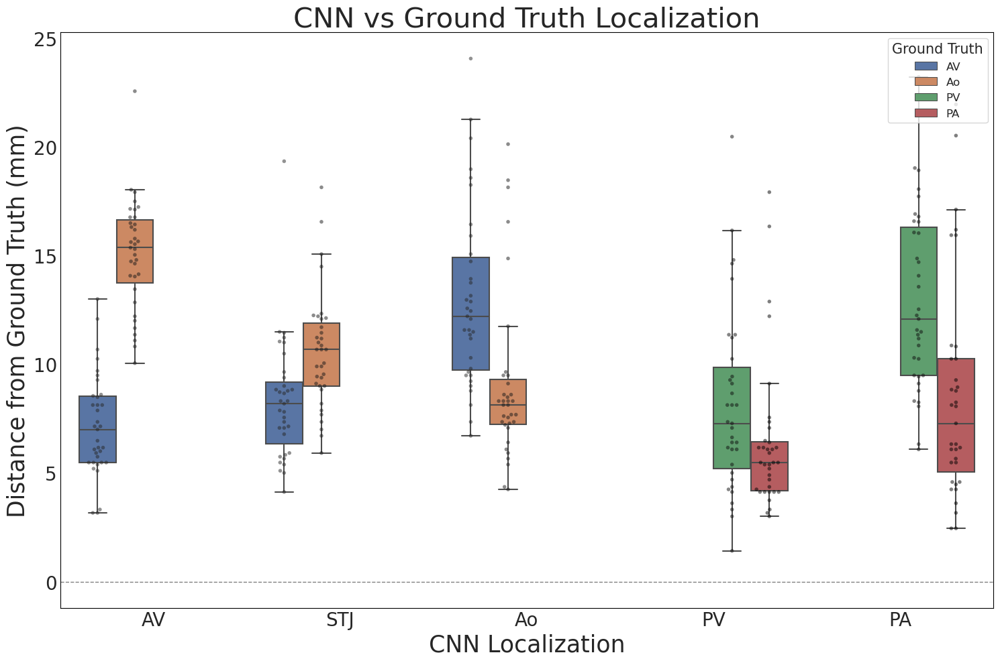

In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Font size variables
title_fontsize = 30
axis_label_fontsize = 25
ticks_fontsize = 20
legend_fontsize = 12
legend_title_fontsize = 15

# Assuming df_rcs is your DataFrame
# Melt the DataFrame to go from wide to long format
df_long = df_rcs.reset_index().melt(id_vars=['Phonetic'], var_name='Measurement', value_name='Distance')

# Extract the locnet and manual categories from the 'Measurement' column
df_long['Landmark'] = df_long['Measurement'].str.extract(r'(\D+)c_')
df_long['Ground Truth'] = df_long['Measurement'].str.extract(r'\D+c_(\D+)')

# Make a copy to avoid SettingWithCopyWarning
df_long = df_long.copy()

# Use .loc to ensure you are modifying the DataFrame in place
df_long.loc[:, 'Landmark'] = df_long['Landmark'].str.replace('c$', '', regex=True)
df_long.loc[:, 'Landmark'] = df_long['Landmark'].str.replace('^d', '', regex=True)

# Filter out 'pPA' measurements and only locnet categories and their corresponding manual measurements
df_pairwise = df_long[(df_long['Landmark'].isin(['AV', 'STJ', 'Ao', 'PV', 'PA'])) & (df_long['Ground Truth'] != 'pPA')].copy()

# Use .loc to safely rename the 'Ground Truth' labels to remove the trailing 'm'
df_pairwise.loc[:, 'Ground Truth'] = df_pairwise['Ground Truth'].str.replace('m$', '', regex=True)

# Now create the pairwise boxplot with increased figure size for clarity
plt.figure(figsize=(15, 10))
sns.set_style('whitegrid')

# Create the boxplot without showing fliers (outliers)
ax = sns.boxplot(x='Landmark', y='Distance', hue='Ground Truth', data=df_pairwise, palette='deep', showfliers=False)

# Overlay individual data points using swarmplot with adjusted opacity
sns.swarmplot(x='Landmark', y='Distance', hue='Ground Truth', data=df_pairwise, dodge=True, color="black", size=4, alpha=0.5)

# Set the labels and title with font size variables
ax.set_xlabel('CNN Localization', fontsize=axis_label_fontsize)
ax.set_ylabel('Distance from Ground Truth (mm)', fontsize=axis_label_fontsize)
ax.set_title('CNN vs Ground Truth Localization', fontsize=title_fontsize)

# Set the font size for tick labels using font size variables
ax.tick_params(axis='both', labelsize=ticks_fontsize)

# Remove the legend for the swarm plot to avoid duplicate entries
ax.legend_.remove()

# Extract the handles and labels from the legend
handles, labels = ax.get_legend_handles_labels()

# Create the legend using only the handles and labels from the boxplot
# Use the legend_fontsize variable
legend = ax.legend(handles[:len(handles)//2], labels[:len(labels)//2], title='Ground Truth', fontsize=legend_fontsize, loc='upper right')
plt.setp(legend.get_title(), fontsize=legend_title_fontsize)  # This will set the legend title font size

# Set the ticks to be inside and remove grid lines
ax.tick_params(axis='both', direction='in')
ax.grid(False)

# Customize the axes and grid to match the preferred style
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    
# Draw a horizontal line at y=0
ax.axhline(y=0, color='gray', linestyle='--', linewidth=1.0)

# Adjust the horizontal spacing by modifying x-axis limits
ax.set_xlim(-0.5, len(df_pairwise['Landmark'].unique()) - 0.5)

plt.tight_layout()

# Show and/or save the plot
path = '/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/figures'
plt.savefig(os.path.join(path, 'locnet_performance_piecewise.png'), dpi=300, bbox_inches='tight')
plt.show()


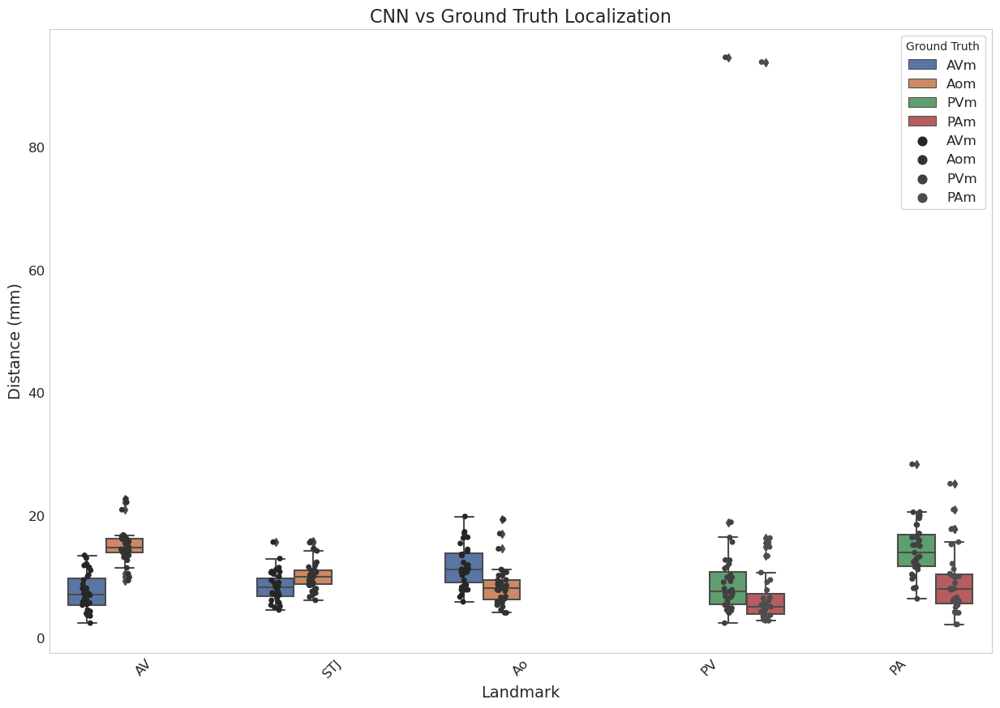

In [692]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ... (your previous code to prepare df_pairwise)

# Now create the pairwise boxplot with increased figure size for clarity
plt.figure(figsize=(15, 10))  # Consider increasing the height further if needed

# Set the background to white
sns.set_style('whitegrid')  # Using whitegrid for better visual distinction

# Create the boxplot
ax = sns.boxplot(x='Landmark', y='Distance', hue='Ground Truth', data=df_pairwise, palette='deep')

# Overlay individual data points using stripplot with jitter for better separation of points
sns.stripplot(x='Landmark', y='Distance', hue='Ground Truth', data=df_pairwise, dodge=True, jitter=True, color="0.3", size=5, marker='o')

# Set the labels and title
ax.set_xlabel('Landmark', fontsize=14)
ax.set_ylabel('Distance (mm)', fontsize=14)
ax.set_title('CNN vs Ground Truth Localization', fontsize=16)

# Rotate the x-axis labels for better legibility and set font size
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=12)

# Set the size of the y-axis label fonts
ax.tick_params(axis='y', labelsize=12)

# Adjust the legend to only show the hues
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:len(palette)], labels[:len(palette)], title='Ground Truth', fontsize=12)

# Set the ticks to be inside and remove grid lines
ax.tick_params(axis='both', direction='in')
ax.grid(False)

# Adjust the horizontal spacing by modifying x-axis limits
ax.set_xlim(-0.5, len(df_pairwise['Landmark'].unique()) - 0.5)

# Show the plot
plt.show()


In [690]:
plt.close()

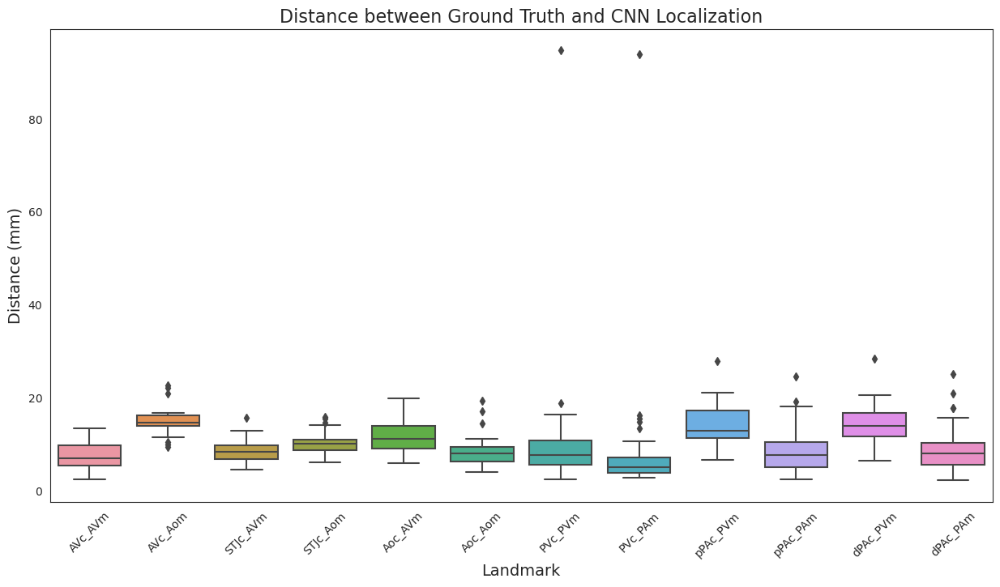

In [669]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the size of the plot
plt.figure(figsize=(15, 8))  # Adjust the figure size as needed

# Create the boxplot with rotated x-axis labels and without grid lines
# Seaborn takes care of plotting all numeric columns if you don't specify 'y' parameter
ax = sns.boxplot(data=df_rcs[['AVc_AVm', 'AVc_Aom', 'STJc_AVm', 'STJc_Aom', 'Aoc_AVm', 'Aoc_Aom',
       'PVc_PVm', 'PVc_PAm', 'pPAc_PVm', 'pPAc_PAm', 'dPAc_PVm', 'dPAc_PAm']])

# Set the labels and title with a larger font size
ax.set_xlabel('Landmark', fontsize=14)
ax.set_ylabel('Distance (mm)', fontsize=14)
ax.set_title('Distance between Ground Truth and CNN Localization', fontsize=16)

# Rotate the x-axis labels for better legibility
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# Increase space at the bottom to prevent clipping of tick labels
plt.subplots_adjust(bottom=0.15)
sns.set_style('white') 

# Show the plot
plt.show()


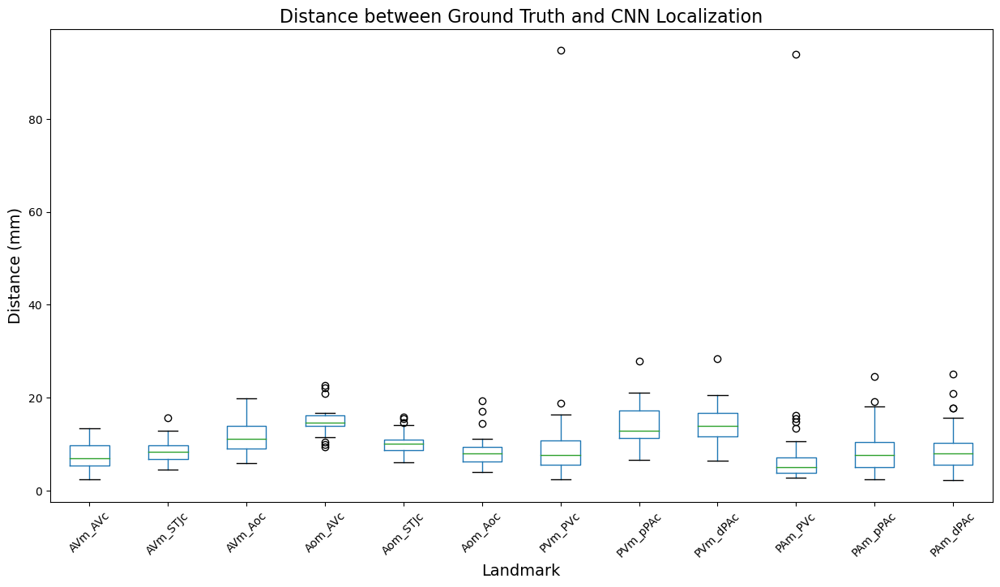

In [557]:
import matplotlib.pyplot as plt

# Set the size of the plot
plt.figure(figsize=(15, 8))  # Adjust the figure size as needed

# Create the boxplot with rotated x-axis labels and without grid lines
ax = df_rcs.boxplot(column=['AVm_AVc', 'AVm_STJc', 'AVm_Aoc', 'Aom_AVc', 'Aom_STJc', 'Aom_Aoc',
                'PVm_PVc', 'PVm_pPAc', 'PVm_dPAc', 'PAm_PVc', 'PAm_pPAc', 'PAm_dPAc'],
                    grid=False)

# Set the labels and title with a larger font size
ax.set_xlabel('Landmark', fontsize=14)
ax.set_ylabel('Distance (mm)', fontsize=14)
ax.set_title('Distance between Ground Truth and CNN Localization', fontsize=16)

# Rotate the x-axis labels for better legibility
plt.xticks(rotation=45)

# Increase space at the bottom to prevent clipping of tick labels
plt.subplots_adjust(bottom=0.15)

# Show the plot
plt.show()

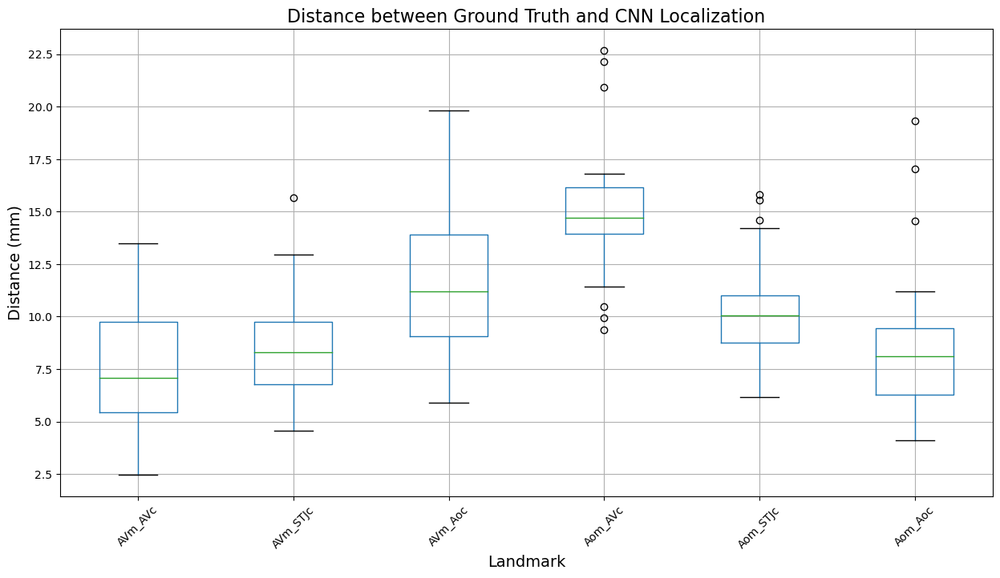

In [560]:
import matplotlib.pyplot as plt

# Set the size of the plot
plt.figure(figsize=(15, 8))  # Adjust the figure size as needed

# Create the boxplot with rotated x-axis labels and without grid lines
ax = df_rcs.boxplot(column=['AVm_AVc', 'AVm_STJc', 'AVm_Aoc', 'Aom_AVc', 'Aom_STJc', 'Aom_Aoc'],
                    grid=True)

# Set the labels and title with a larger font size
ax.set_xlabel('Landmark', fontsize=14)
ax.set_ylabel('Distance (mm)', fontsize=14)
ax.set_title('Distance between Ground Truth and CNN Localization', fontsize=16)

# Rotate the x-axis labels for better legibility
plt.xticks(rotation=45)

# Increase space at the bottom to prevent clipping of tick labels
plt.subplots_adjust(bottom=0.15)

# Show the plot
plt.show()

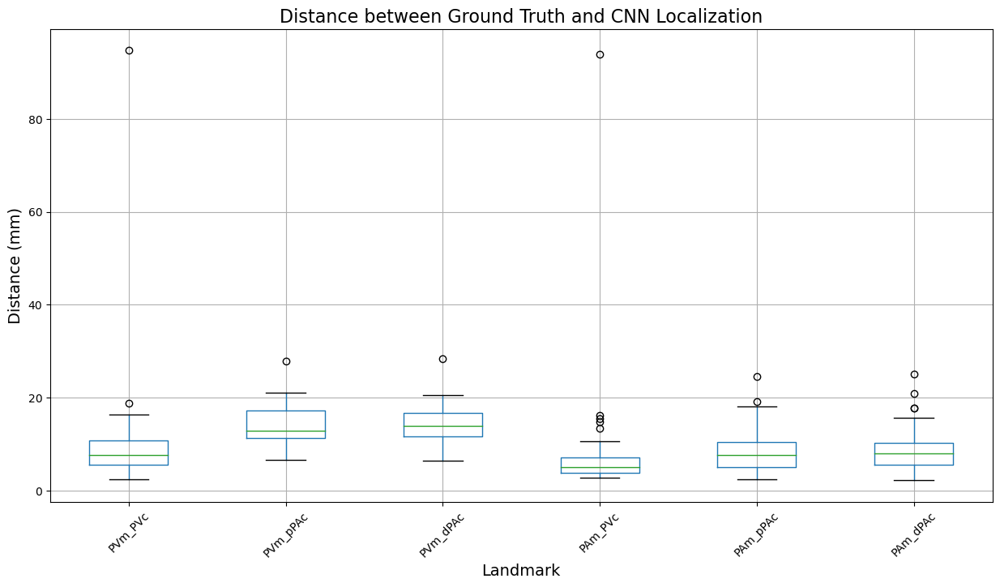

In [559]:
import matplotlib.pyplot as plt

# Set the size of the plot
plt.figure(figsize=(15, 8))  # Adjust the figure size as needed

# Create the boxplot with rotated x-axis labels and without grid lines
ax = df_rcs.boxplot(column=['PVm_PVc', 'PVm_pPAc', 'PVm_dPAc', 'PAm_PVc', 'PAm_pPAc', 'PAm_dPAc'],
                    grid=True)

# Set the labels and title with a larger font size
ax.set_xlabel('Landmark', fontsize=14)
ax.set_ylabel('Distance (mm)', fontsize=14)
ax.set_title('Distance between Ground Truth and CNN Localization', fontsize=16)

# Rotate the x-axis labels for better legibility
plt.xticks(rotation=45)

# Increase space at the bottom to prevent clipping of tick labels
plt.subplots_adjust(bottom=0.15)

# Show the plot
plt.show()

In [41]:
def find_min(row, col1, col2):
    return min(row[col1],row[col2])

# Apply the function to each row of the DataFrame
print(df_rcs.apply(lambda row: find_min(row, 'PVm_PVc', 'PAm_PVc'), axis=1))


Phonetic
Besapol        4.582576
Deefegi        5.385165
Dehithu        5.385165
Dukasa         3.000000
Fegaygun       4.898979
Fenoopub       4.690416
Fratalooy      5.744563
Gajefe         6.082763
Giretap        3.464102
Goxankot       5.099020
Hetero         4.242641
Hudutre        4.123106
Jefoje         6.708204
Kohugonk       6.480741
Mifoyeg        2.449490
Motale         3.162278
Mozufuck      93.898882
Narikag        4.242641
Natotag        4.582576
Noukumu       14.866069
Nuebafru       9.110434
Okiegop        3.741657
Quiflula       2.828427
Quisculjug     3.741657
Repusug        9.899495
Retasu         5.385165
Sacureed       3.741657
Scoostepip     5.385165
Semagon        7.348469
Sifaci        13.379088
Tasnicu        2.828427
Tesrenil       6.633250
Tibomol        5.099020
Tiheerien      4.582576
Urquidash      4.472136
dtype: float64


In [42]:
man_landmarks = ['AV','Ao']
cnn_landmarks = ['AV','STJ','Ao']

for cnn in cnn_landmarks:
    col0 =  cnn + 'c' +'_'+ man_landmarks[0] + 'm'
    col1 =  cnn + 'c' +'_'+ man_landmarks[1] + 'm'
        
    df_rcs[cnn] = df_rcs.apply(lambda row: find_min(row,col0,col1), axis=1)
    
    

In [43]:
man_landmarks = ['PV','PA']
cnn_landmarks = ['PV','pPA','dPA']

for cnn in cnn_landmarks:
    col0 =  cnn + 'c' +'_'+ man_landmarks[0] + 'm'
    col1 =  cnn + 'c' +'_'+ man_landmarks[1] + 'm'
        
    df_rcs[cnn] = df_rcs.apply(lambda row: find_min(row,col0,col1), axis=1)

In [51]:
cnn_to_gt = {'AV': 'AVc_AVm', 'STJ': 'STJc_AVm', 'Ao':'Aoc_Aom', 'PV':'PVc_PVm', 'pPA': 'pPAc_PAm', 'dPA': 'dPAc_PAm'}

print(cnn_to_gt)


{'AV': 'AVc_AVm', 'STJ': 'STJc_AVm', 'Ao': 'Aoc_Aom', 'PV': 'PVc_PVm', 'pPA': 'pPAc_PAm', 'dPA': 'dPAc_PAm'}


In [52]:
for landmark in cnn_to_gt:
    df_rcs[landmark] = df_rcs[cnn_to_gt[landmark]]

In [53]:
display(df_rcs.columns)

Index(['AV_manual', 'Ao_manual', 'PV_manual', 'PA_manual', 'AV_locnet',
       'STJ_locnet', 'Ao_locnet', 'PV_locnet', 'pPA_locnet', 'dPA_locnet',
       'AVm_AVc', 'AVm_STJc', 'AVm_Aoc', 'Aom_AVc', 'Aom_STJc', 'Aom_Aoc',
       'AVc_AVm', 'AVc_Aom', 'STJc_AVm', 'STJc_Aom', 'Aoc_AVm', 'Aoc_Aom',
       'PVm_PVc', 'PVm_pPAc', 'PVm_dPAc', 'PAm_PVc', 'PAm_pPAc', 'PAm_dPAc',
       'PVc_PVm', 'PVc_PAm', 'pPAc_PVm', 'pPAc_PAm', 'dPAc_PVm', 'dPAc_PAm',
       'AV', 'STJ', 'Ao', 'PV', 'pPA', 'dPA'],
      dtype='object')

In [47]:
display(df_rcs[['AVc_AVm', 'AVc_Aom', 'STJc_AVm', 'STJc_Aom', 'Aoc_AVm', 'Aoc_Aom',
       'PVc_PVm', 'PVc_PAm', 'pPAc_PVm', 'pPAc_PAm', 'dPAc_PVm', 'dPAc_PAm',
       'AV', 'STJ', 'Ao', 'PV', 'pPA', 'dPA']])

,AVc_AVm,AVc_Aom,STJc_AVm,STJc_Aom,Aoc_AVm,Aoc_Aom,PVc_PVm,PVc_PAm,pPAc_PVm,pPAc_PAm,dPAc_PVm,dPAc_PAm,AV,STJ,Ao,PV,pPA,dPA
Phonetic,,,,,,,,,,,,,,,,,,
Besapol,2.449490,10.488088,5.000000,6.708204,8.660254,4.582576,4.582576,10.677078,17.378147,7.681146,20.518285,11.224972,2.449490,5.000000,4.582576,4.582576,7.681146,11.224972
Deefegi,8.062258,15.524175,5.000000,9.000000,6.708204,7.810250,7.280110,5.385165,13.674794,10.630146,15.000000,12.124356,8.062258,5.000000,7.810250,7.280110,10.630146,12.124356
Dehithu,12.083046,16.155494,9.433981,10.954451,10.677078,11.180340,12.083046,5.385165,17.204651,7.141428,17.029386,8.062258,12.083046,9.433981,11.180340,12.083046,7.141428,8.062258
Dukasa,6.000000,14.696938,8.306624,10.630146,13.638182,7.874008,5.385165,3.000000,12.529964,5.000000,12.529964,5.000000,6.000000,8.306624,7.874008,5.385165,5.000000,5.000000
Fegaygun,6.324555,14.071247,5.385165,8.062258,7.071068,6.782330,4.898979,5.099020,8.124038,10.000000,8.124038,10.000000,6.324555,5.385165,6.782330,4.898979,10.000000,10.000000
Fenoopub,7.000000,16.186414,10.677078,10.246951,17.320508,6.403124,11.357817,4.690416,16.031220,5.099020,15.165751,4.123106,7.000000,10.677078,6.403124,11.357817,5.099020,4.123106
Fratalooy,7.071068,9.949874,6.557439,6.164414,11.747340,5.916080,5.744563,16.309506,20.322401,5.099020,20.542639,5.385165,7.071068,6.557439,5.916080,5.744563,5.099020,5.385165
Gajefe,7.280110,13.416408,7.141428,8.602325,8.602325,5.744563,12.688578,6.082763,17.204651,10.488088,16.613248,10.099505,7.280110,7.141428,5.744563,12.688578,10.488088,10.099505
Giretap,7.141428,14.456832,8.602325,10.295630,7.874008,10.198039,7.874008,3.464102,12.884099,6.633250,11.874342,5.916080,7.141428,8.602325,10.198039,7.874008,6.633250,5.916080


In [48]:
display(df_rcs[['AVc_AVm', 'AVc_Aom', 'STJc_AVm', 'STJc_Aom', 'Aoc_AVm', 'Aoc_Aom',
       'PVc_PVm', 'PVc_PAm', 'pPAc_PVm', 'pPAc_PAm', 'dPAc_PVm', 'dPAc_PAm',
       'AV', 'STJ', 'Ao', 'PV', 'pPA', 'dPA']])

,AVc_AVm,AVc_Aom,STJc_AVm,STJc_Aom,Aoc_AVm,Aoc_Aom,PVc_PVm,PVc_PAm,pPAc_PVm,pPAc_PAm,dPAc_PVm,dPAc_PAm,AV,STJ,Ao,PV,pPA,dPA
Phonetic,,,,,,,,,,,,,,,,,,
Besapol,2.449490,10.488088,5.000000,6.708204,8.660254,4.582576,4.582576,10.677078,17.378147,7.681146,20.518285,11.224972,2.449490,5.000000,4.582576,4.582576,7.681146,11.224972
Deefegi,8.062258,15.524175,5.000000,9.000000,6.708204,7.810250,7.280110,5.385165,13.674794,10.630146,15.000000,12.124356,8.062258,5.000000,7.810250,7.280110,10.630146,12.124356
Dehithu,12.083046,16.155494,9.433981,10.954451,10.677078,11.180340,12.083046,5.385165,17.204651,7.141428,17.029386,8.062258,12.083046,9.433981,11.180340,12.083046,7.141428,8.062258
Dukasa,6.000000,14.696938,8.306624,10.630146,13.638182,7.874008,5.385165,3.000000,12.529964,5.000000,12.529964,5.000000,6.000000,8.306624,7.874008,5.385165,5.000000,5.000000
Fegaygun,6.324555,14.071247,5.385165,8.062258,7.071068,6.782330,4.898979,5.099020,8.124038,10.000000,8.124038,10.000000,6.324555,5.385165,6.782330,4.898979,10.000000,10.000000
Fenoopub,7.000000,16.186414,10.677078,10.246951,17.320508,6.403124,11.357817,4.690416,16.031220,5.099020,15.165751,4.123106,7.000000,10.677078,6.403124,11.357817,5.099020,4.123106
Fratalooy,7.071068,9.949874,6.557439,6.164414,11.747340,5.916080,5.744563,16.309506,20.322401,5.099020,20.542639,5.385165,7.071068,6.557439,5.916080,5.744563,5.099020,5.385165
Gajefe,7.280110,13.416408,7.141428,8.602325,8.602325,5.744563,12.688578,6.082763,17.204651,10.488088,16.613248,10.099505,7.280110,7.141428,5.744563,12.688578,10.488088,10.099505
Giretap,7.141428,14.456832,8.602325,10.295630,7.874008,10.198039,7.874008,3.464102,12.884099,6.633250,11.874342,5.916080,7.141428,8.602325,10.198039,7.874008,6.633250,5.916080


In [54]:
display(df_rcs[['AV', 'STJ', 'Ao', 'PV', 'pPA', 'dPA']])


,AV,STJ,Ao,PV,pPA,dPA
Phonetic,,,,,,
Besapol,3.162278,5.916080,4.358899,14.798649,8.774964,8.774964
Deefegi,7.141428,5.477226,8.306624,7.280110,9.433981,10.862780
Dehithu,12.083046,7.348469,18.138357,14.628739,10.246951,10.246951
Dukasa,5.477226,9.000000,5.916080,5.000000,4.123106,3.605551
Fegaygun,6.082763,5.385165,7.348469,4.690416,8.062258,8.062258
Fenoopub,8.485281,11.000000,7.071068,11.224972,6.082763,6.082763
Fratalooy,5.477226,5.830952,8.124038,6.164414,18.708287,17.117243
Gajefe,5.477226,5.744563,7.549834,10.246951,8.124038,8.124038
Giretap,7.000000,7.549834,18.466185,6.082763,5.099020,5.477226


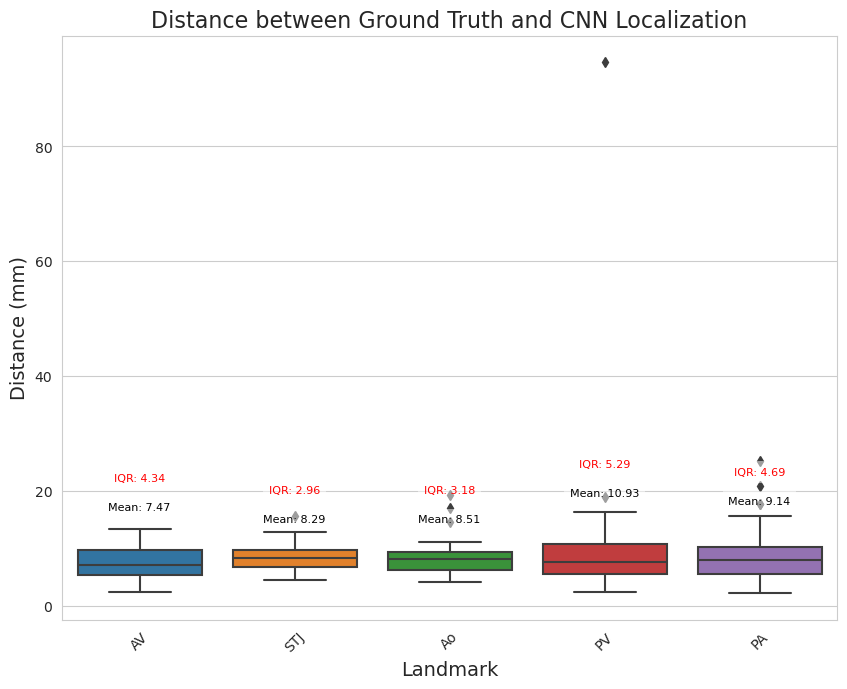

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

# Apply the seaborn style
sns.set_style('whitegrid')

# Set the size of the plot
plt.figure(figsize=(10, 8))

# Create the boxplot with rotated x-axis labels
ax = sns.boxplot(data=df_rcs[['AV', 'STJ', 'Ao', 'PV', 'dPA']])

# Custom labels for the x-axis
custom_labels = ['AV', 'STJ', 'Ao', 'PV', 'PA']

# Set the custom labels
ax.set_xticklabels(custom_labels, rotation=45)

# Set the labels and title with a larger font size
ax.set_xlabel('Landmark', fontsize=14)
ax.set_ylabel('Distance (mm)', fontsize=14)
ax.set_title('Distance between Ground Truth and CNN Localization', fontsize=16)

# Annotate the plot with mean and IQR
for i, column in enumerate(['AV', 'STJ', 'Ao', 'PV', 'dPA']):
    # Calculate statistics
    mean = df_rcs[column].mean()
    q1 = df_rcs[column].quantile(0.25)
    q3 = df_rcs[column].quantile(0.75)
    iqr = q3 - q1
    whisker_top = df_rcs[column].quantile(0.75) + (1.5 * iqr)  # The top whisker on a boxplot
    
    # Annotate the mean
    ax.text(i, whisker_top, f'Mean: {mean:.2f}', ha='center', va='bottom', fontsize=8, color='black',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
    
    # Annotate the IQR
    # Position the IQR text above the top whisker
    ax.text(i, whisker_top + (0.05 * (ax.get_ylim()[1] - ax.get_ylim()[0])), f'IQR: {iqr:.2f}', ha='center', va='bottom', fontsize=8, color='red',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))

# Increase space at the bottom to prevent clipping of tick labels
plt.subplots_adjust(bottom=0.15)

# Show the plot
plt.show()


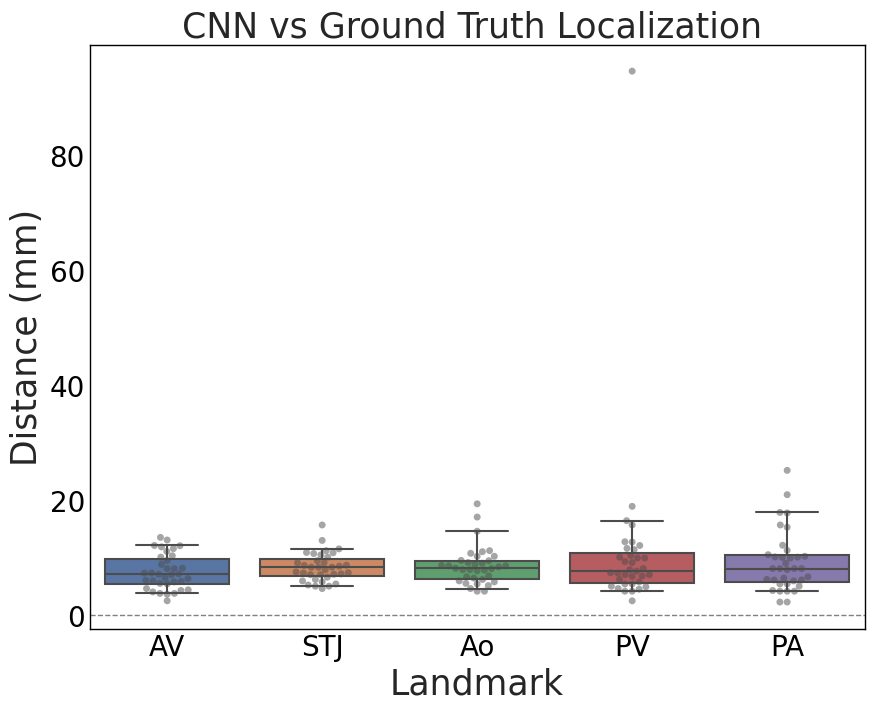

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define font sizes
title_fontsize = 25
axis_label_fontsize = 25
tick_label_fontsize = 20

# Apply the seaborn style
sns.set_style('white')

# Set the size of the plot
plt.figure(figsize=(10, 8))

# Create the boxplot with whiskers set to the 5th and 95th percentiles
ax = sns.boxplot(data=df_rcs[['AV', 'STJ', 'Ao', 'PV', 'dPA']], whis=[5, 95],showfliers=False, palette=sns.color_palette("deep", desat=1))

# Overlay the data points as a strip plot with jitter to show all data points
sns.swarmplot(data=df_rcs[['AV', 'STJ', 'Ao', 'PV', 'dPA']], color=".3",alpha=0.5, size=5)#, jitter=True)

# Customize the axes and grid to match the preferred style
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1)

# Disable the grid
ax.grid(False)

# Set the tick colors and make sure they are inside the plot
ax.tick_params(axis='both', which='major', colors='black', direction='in', labelsize=tick_label_fontsize)

# Draw a horizontal line at y=0
ax.axhline(y=0, color='gray', linestyle='--', linewidth=1.0)

# Custom labels for the x-axis
custom_labels = ['AV', 'STJ', 'Ao', 'PV', 'PA']

# Set the custom labels with rotation for better readability
ax.set_xticklabels(custom_labels, fontsize=tick_label_fontsize)

# Set the labels and title with the defined font sizes
ax.set_xlabel('Landmark', fontsize=axis_label_fontsize)
ax.set_ylabel('Distance (mm)', fontsize=axis_label_fontsize)
ax.set_title('CNN vs Ground Truth Localization ', fontsize=title_fontsize)

# If you have a legend, you can set its font size like this:
# ax.legend(fontsize=legend_fontsize)

# Increase space at the bottom to prevent clipping of tick labels
plt.subplots_adjust(bottom=0.15)

# Show and/or save the plot
path = '/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/figures'
plt.savefig(os.path.join(path, 'locnet_performance.png'), dpi=300, bbox_inches='tight')
plt.show()


In [431]:
pid = 'Retasu'
img = test_img[pid]
print(img.shape)

(20, 192, 192, 64, 1)


In [418]:
print(np.array(_get_COM(lbl)))

[ 87 124  32]


[87 90 16] [86 91 16]


<Figure size 640x480 with 0 Axes>

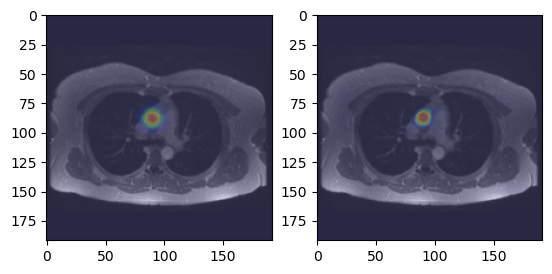

<Figure size 640x480 with 0 Axes>

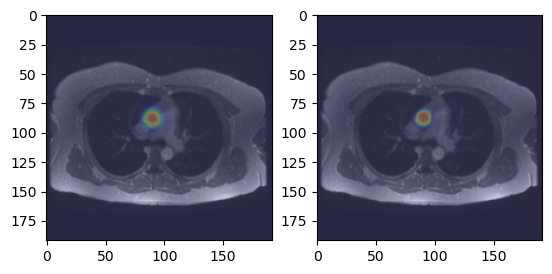

<Figure size 640x480 with 0 Axes>

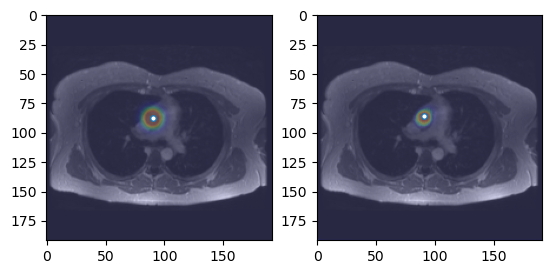

<Figure size 640x480 with 0 Axes>

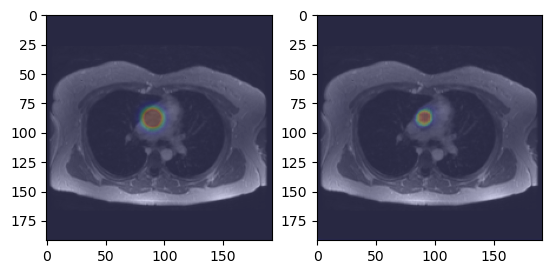

<Figure size 640x480 with 0 Axes>

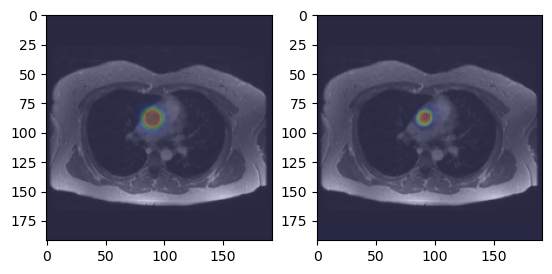

In [434]:
%matplotlib inline

lbl = test_lbl[pid][2,...,1]
prd = test_prd[pid][0,...,2]


lbl_MAX = _get_COM(_center_box_clean(lbl))
prd_MAX = _get_MAX(_center_box_clean(prd))

print(lbl_MAX, prd_MAX)

for z in range(img.shape[-2]):
    
    window = 3
    if z > min(lbl_MAX[-1]-window,prd_MAX[-1]-window) and z < max(lbl_MAX[-1]+window,prd_MAX[-1]+window):
    
        plt.figure()
        fig, (ax1, ax2) = plt.subplots(1, 2)

        ax1.imshow(img[2,...,z,0], cmap='gray', alpha=0.8)
        ax1.imshow(lbl[...,z], cmap='jet', alpha=0.2)
        if int(lbl_MAX[-1])  == z:
            ax1.plot(int(lbl_MAX[1]), int(lbl_MAX[0]), marker="o", markersize=4, markerfacecolor="white")

        ax2.imshow(img[2,...,z,0], cmap='gray', alpha=0.8)
        ax2.imshow(prd[...,z], cmap='jet', alpha=0.2)
        if int(prd_MAX[-1])  == z:
            ax2.plot(int(prd_MAX[1]), int(prd_MAX[0]), marker="o", markersize=4, markerfacecolor="white")

 29%|████████████████████▌                                                   | 10/35 [00:08<00:21,  1.18it/s]/home/ayeluru/miniconda3/envs/wandb/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
100%|████████████████████████████████████████████████████████████████████████| 35/35 [00:30<00:00,  1.15it/s]


<Figure size 640x480 with 0 Axes>

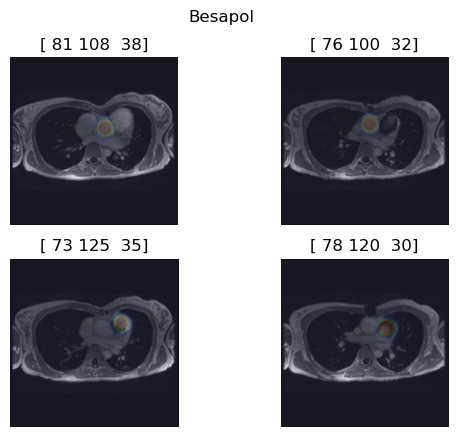

<Figure size 640x480 with 0 Axes>

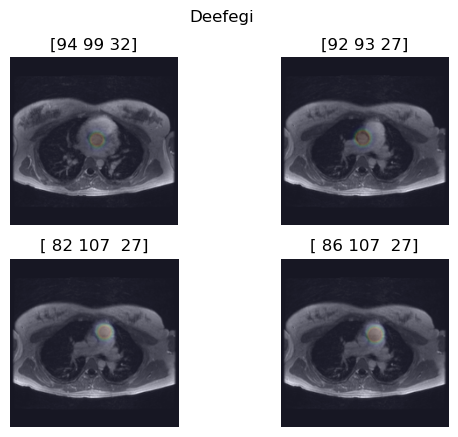

<Figure size 640x480 with 0 Axes>

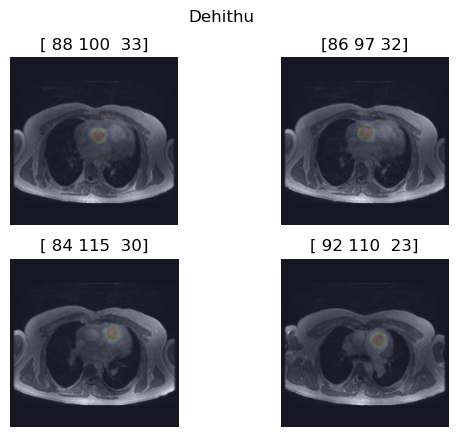

<Figure size 640x480 with 0 Axes>

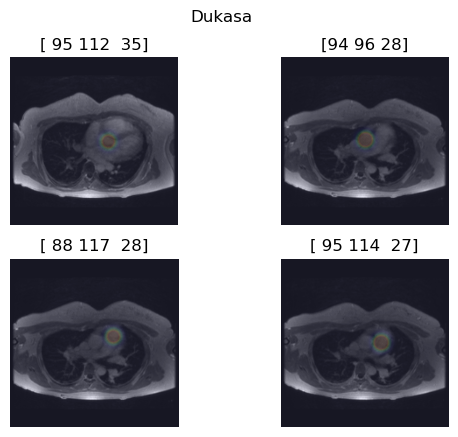

<Figure size 640x480 with 0 Axes>

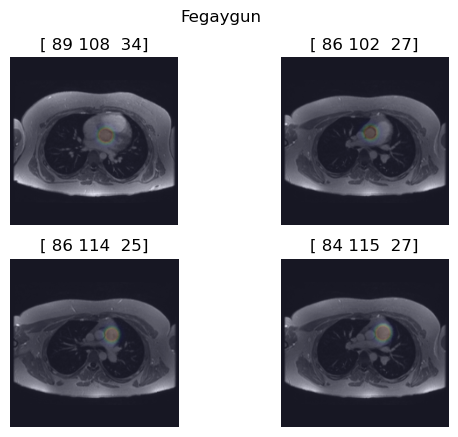

<Figure size 640x480 with 0 Axes>

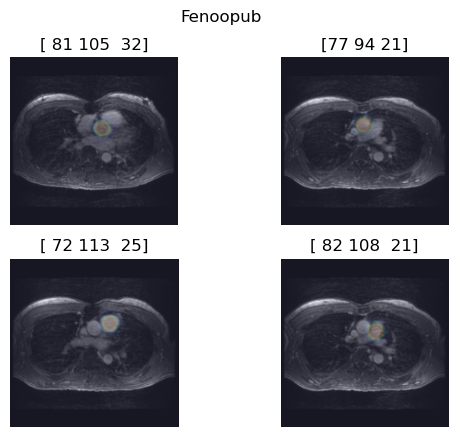

<Figure size 640x480 with 0 Axes>

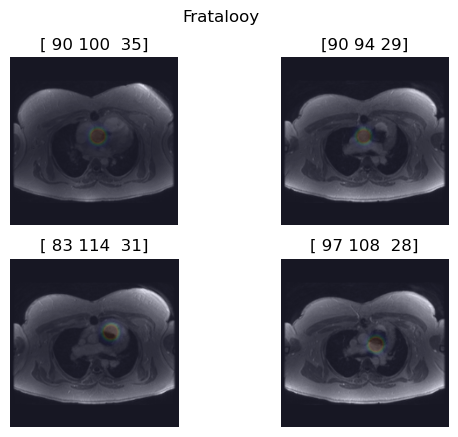

<Figure size 640x480 with 0 Axes>

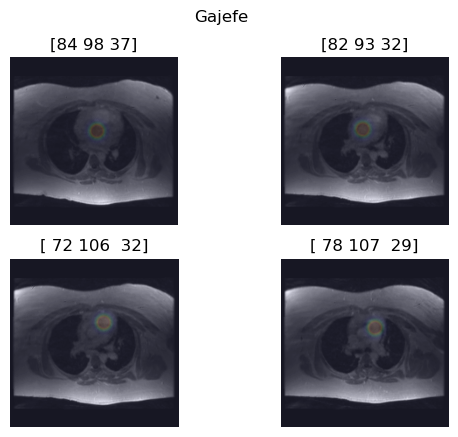

<Figure size 640x480 with 0 Axes>

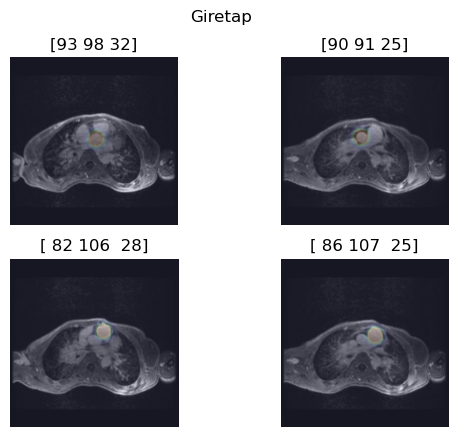

<Figure size 640x480 with 0 Axes>

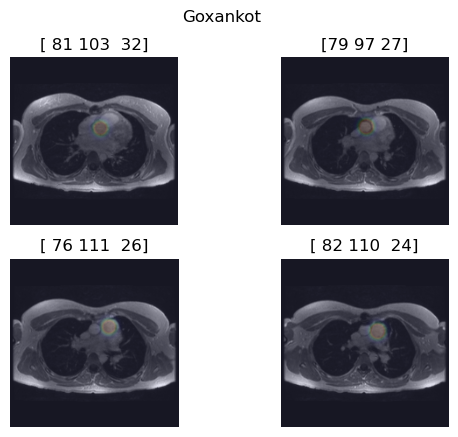

<Figure size 640x480 with 0 Axes>

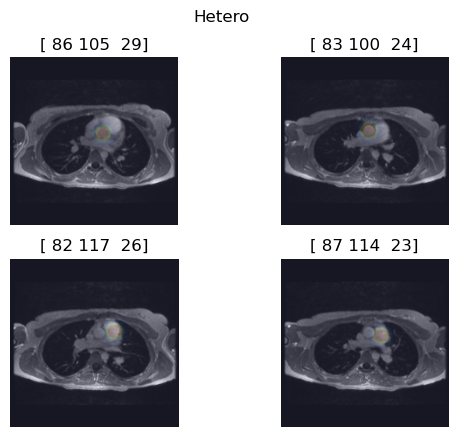

<Figure size 640x480 with 0 Axes>

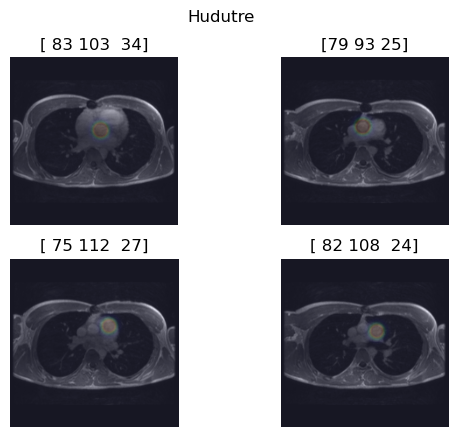

<Figure size 640x480 with 0 Axes>

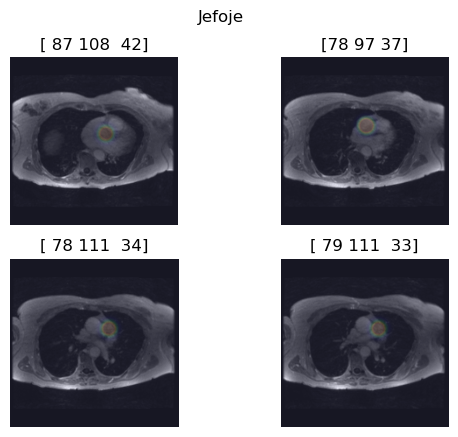

<Figure size 640x480 with 0 Axes>

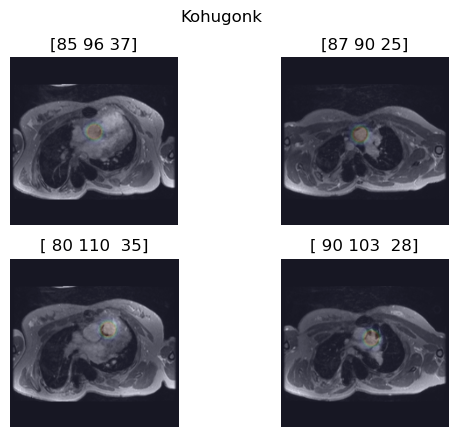

<Figure size 640x480 with 0 Axes>

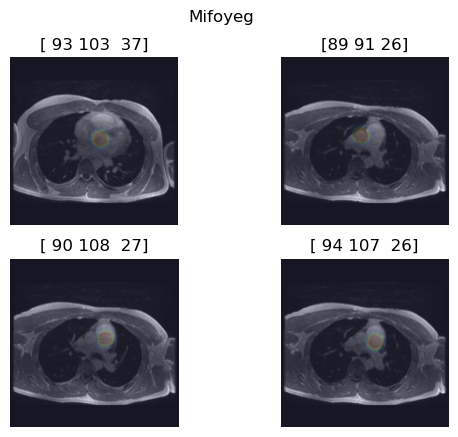

<Figure size 640x480 with 0 Axes>

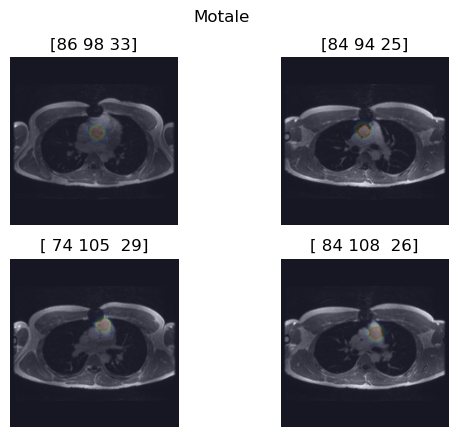

<Figure size 640x480 with 0 Axes>

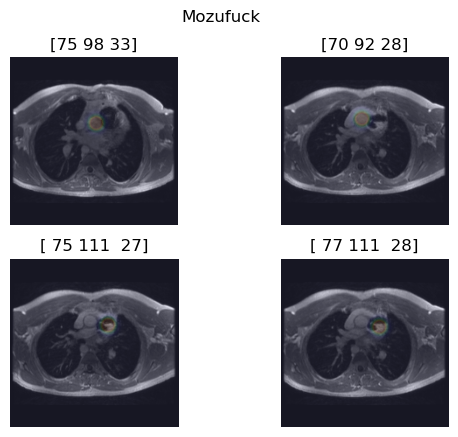

<Figure size 640x480 with 0 Axes>

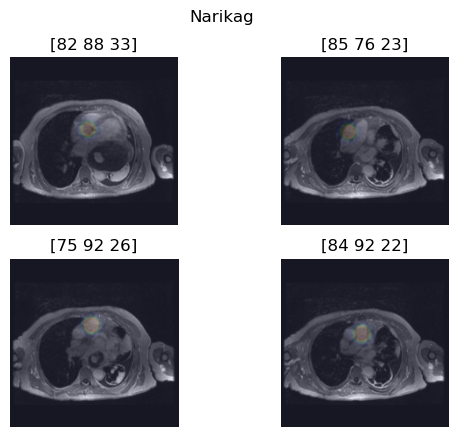

<Figure size 640x480 with 0 Axes>

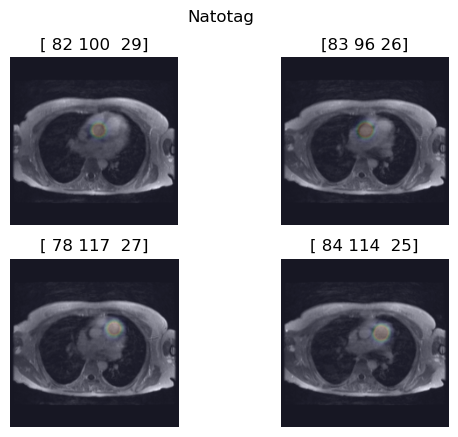

<Figure size 640x480 with 0 Axes>

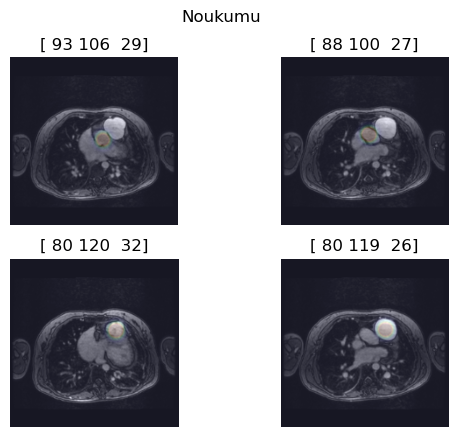

<Figure size 640x480 with 0 Axes>

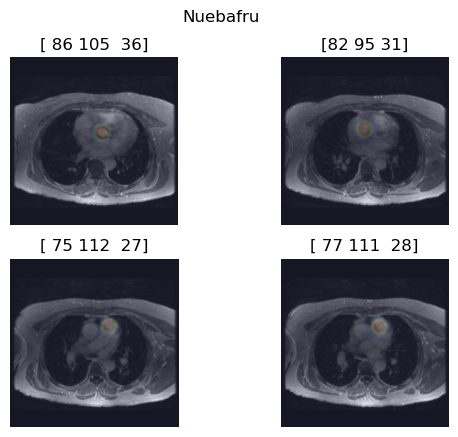

<Figure size 640x480 with 0 Axes>

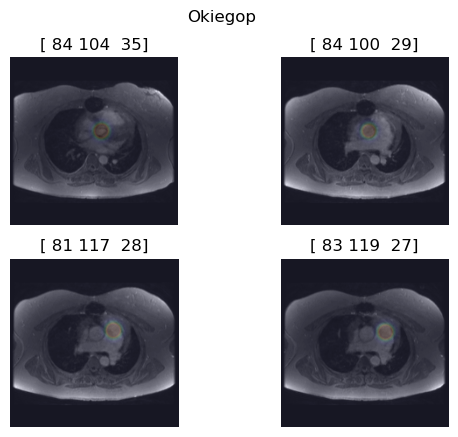

<Figure size 640x480 with 0 Axes>

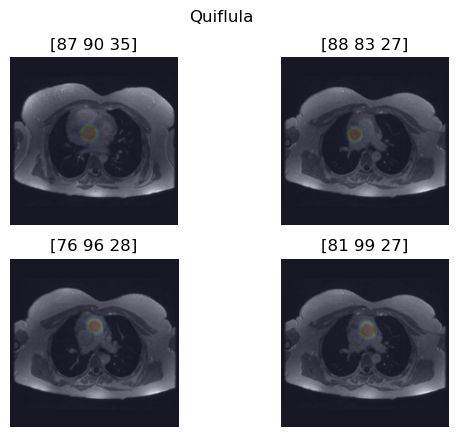

<Figure size 640x480 with 0 Axes>

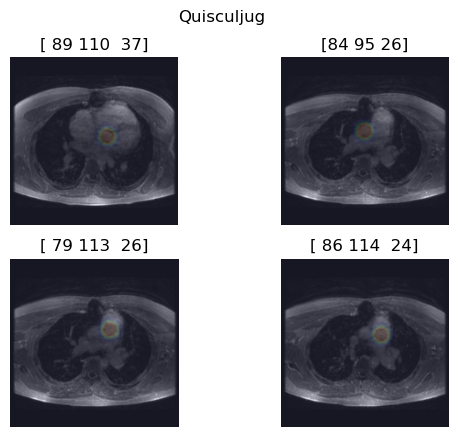

<Figure size 640x480 with 0 Axes>

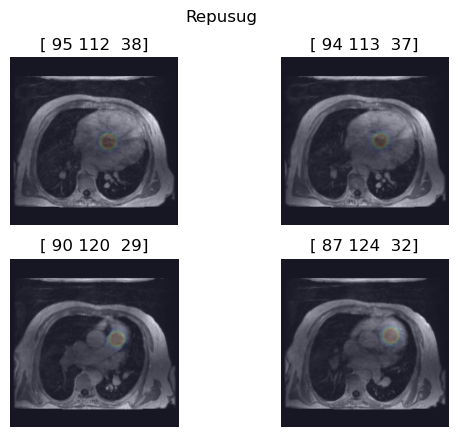

<Figure size 640x480 with 0 Axes>

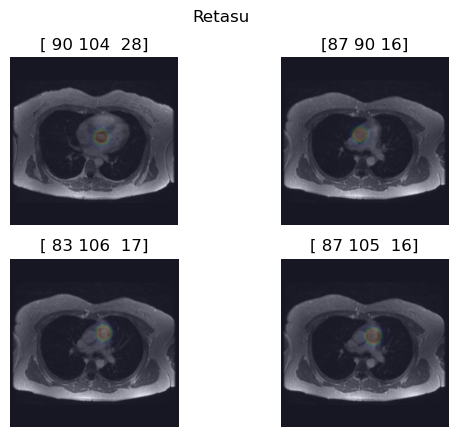

<Figure size 640x480 with 0 Axes>

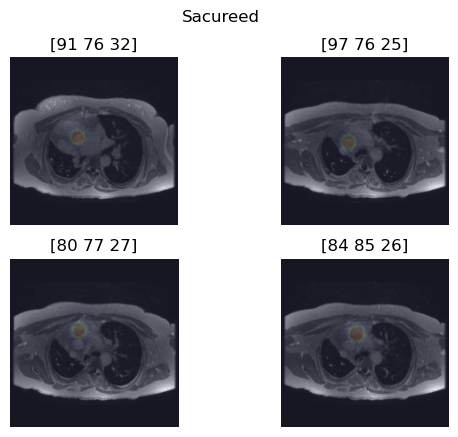

<Figure size 640x480 with 0 Axes>

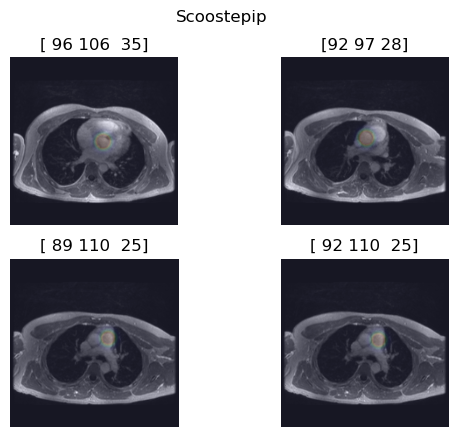

<Figure size 640x480 with 0 Axes>

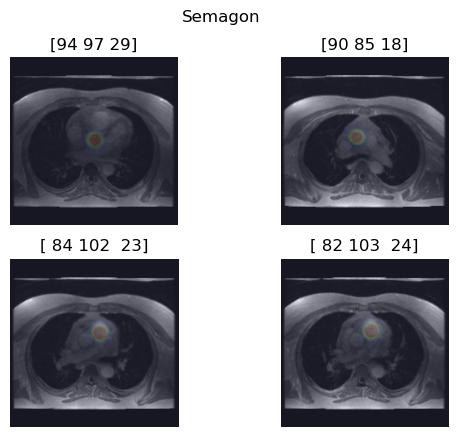

<Figure size 640x480 with 0 Axes>

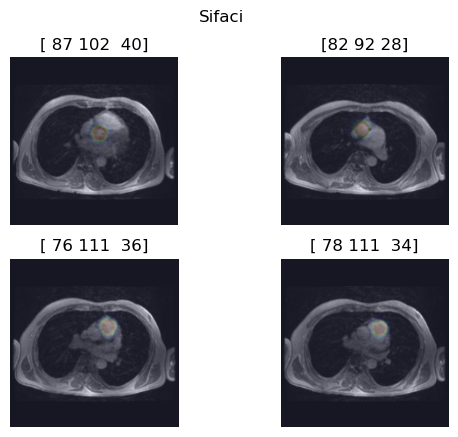

<Figure size 640x480 with 0 Axes>

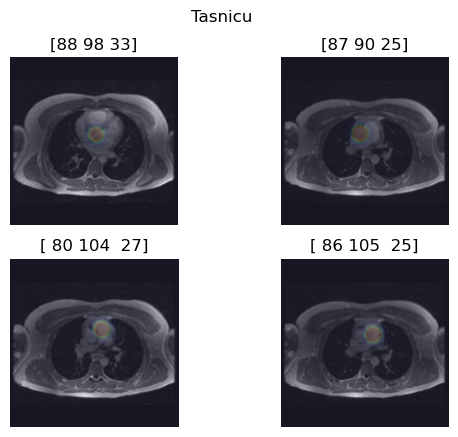

<Figure size 640x480 with 0 Axes>

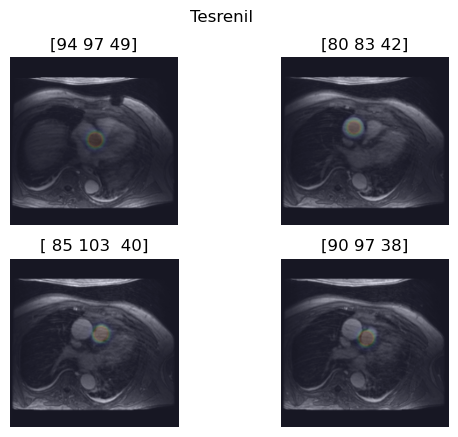

<Figure size 640x480 with 0 Axes>

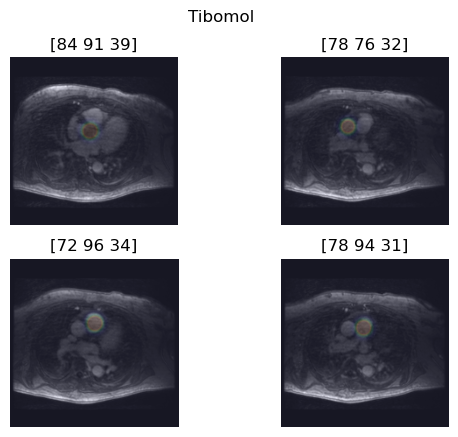

<Figure size 640x480 with 0 Axes>

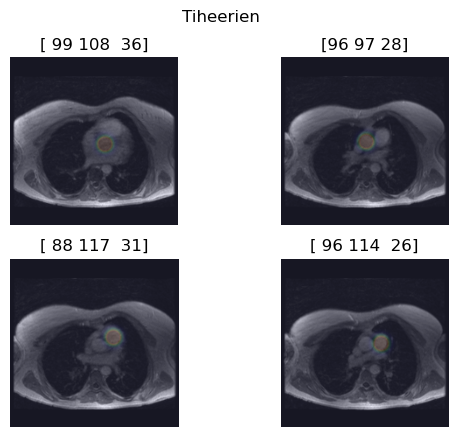

<Figure size 640x480 with 0 Axes>

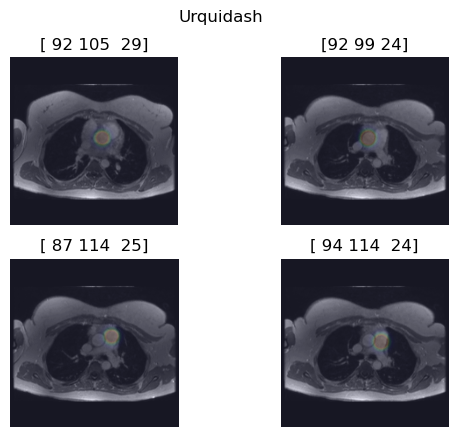

In [446]:
for pid in tqdm(test_prd):
    lbl = test_lbl[pid][2,...]
    img = test_img[pid][2,...,0]
    
    ch0 = _get_COM(_center_box_clean(lbl[...,0]))
    ch1 = _get_COM(_center_box_clean(lbl[...,1]))
    ch2 = _get_COM(_center_box_clean(lbl[...,2]))
    ch3 = _get_COM(_center_box_clean(lbl[...,3]))
    chs = [ch0,ch1,ch2,ch3]
    
    plt.figure()
    
    fig, ax = plt.subplots(2,2)
    fig.suptitle(pid)
    
    ax = np.reshape(ax,4,)
    
    for z in range(img.shape[-1]):
        for i,a in enumerate(ax):
            if chs[i][-1] == z:
                a.imshow(img[...,z], cmap='gray', alpha=0.9)
                a.imshow(lbl[...,z,i], cmap='jet', alpha=0.1)
                a.set_title(chs[i])
                a.axis('off')
                

In [318]:
path = '/maxwell-projects/Aorta_pulmonary_artery_localization/testing_compiled_volumes/testing_locnet_reslice-splines_v2_b8_e300_augment_smaller-gauss_sub-volume-resume_chkpt--49-0.0111.hdf5'



In [319]:
trial = h5py.File(path, 'r')

In [323]:
trial['Quiflula'].shape

(20, 256, 256, 4, 5, 2)

/home/ayeluru/miniconda3/envs/wandb/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


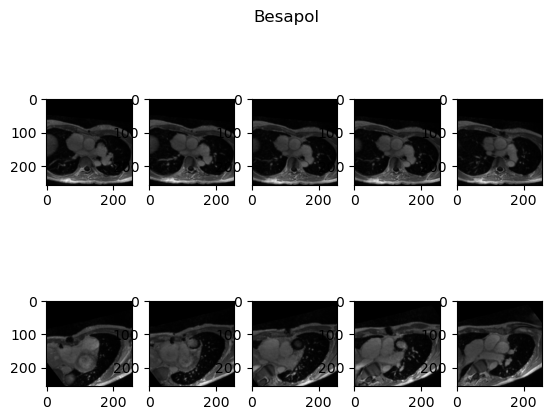

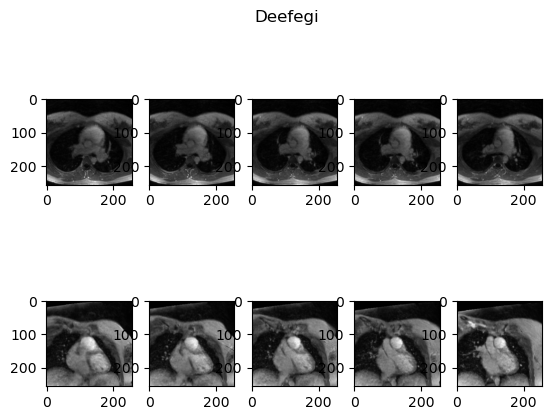

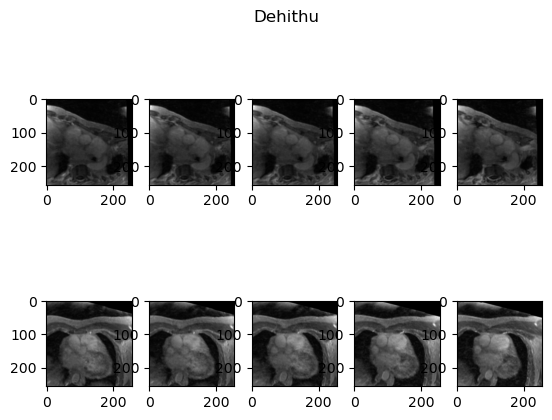

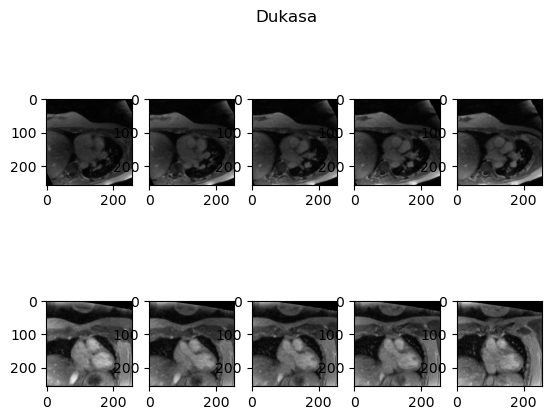

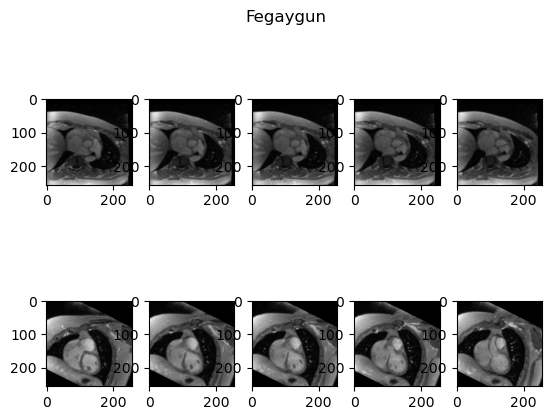

...

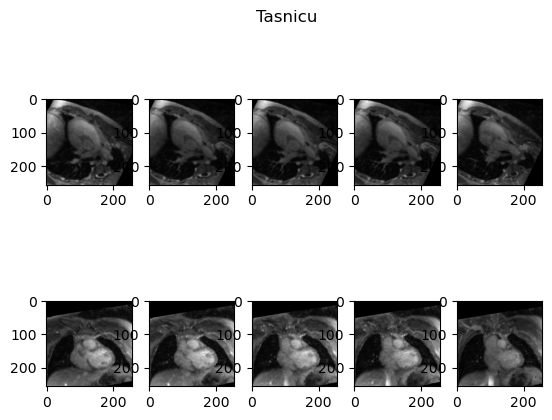

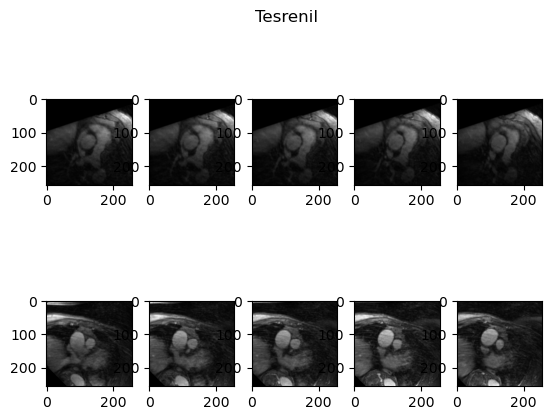

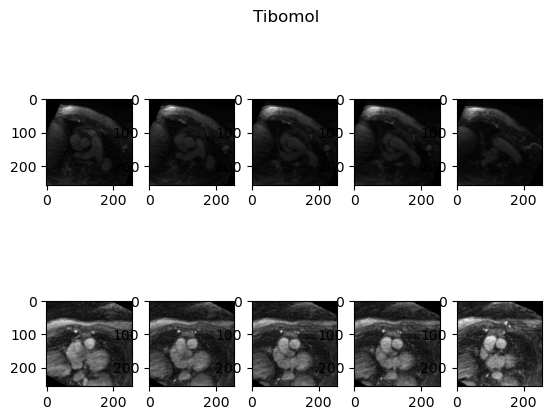

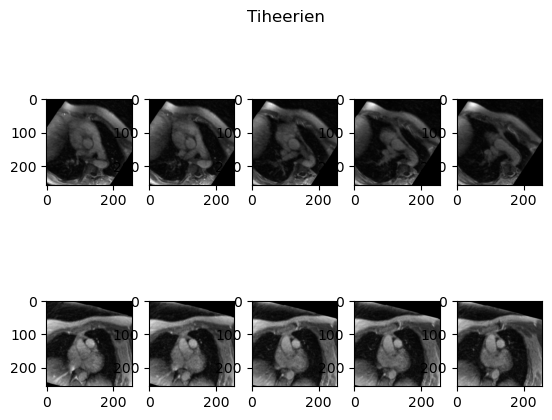

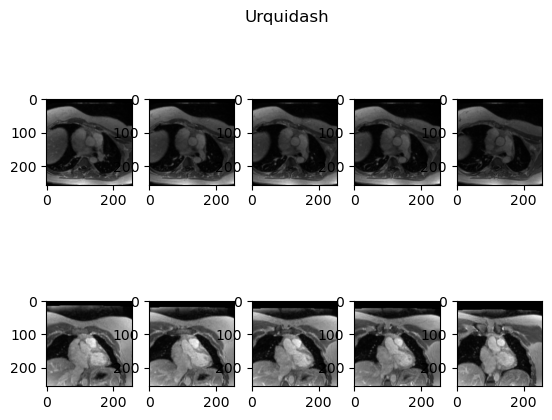

In [332]:
%matplotlib inline

for pid in trial:
    plt.figure()
    plt.suptitle(pid)

    trial_slices = trial[pid]

    for j in range(trial_slices.shape[-1]):
        for i in range(trial_slices.shape[-2]):
            ax = plt.subplot(2,5,i+1+j*5)

            ax.imshow(trial_slices[2,...,0,i,j], cmap='gray')

<IPython.core.display.Javascript object>


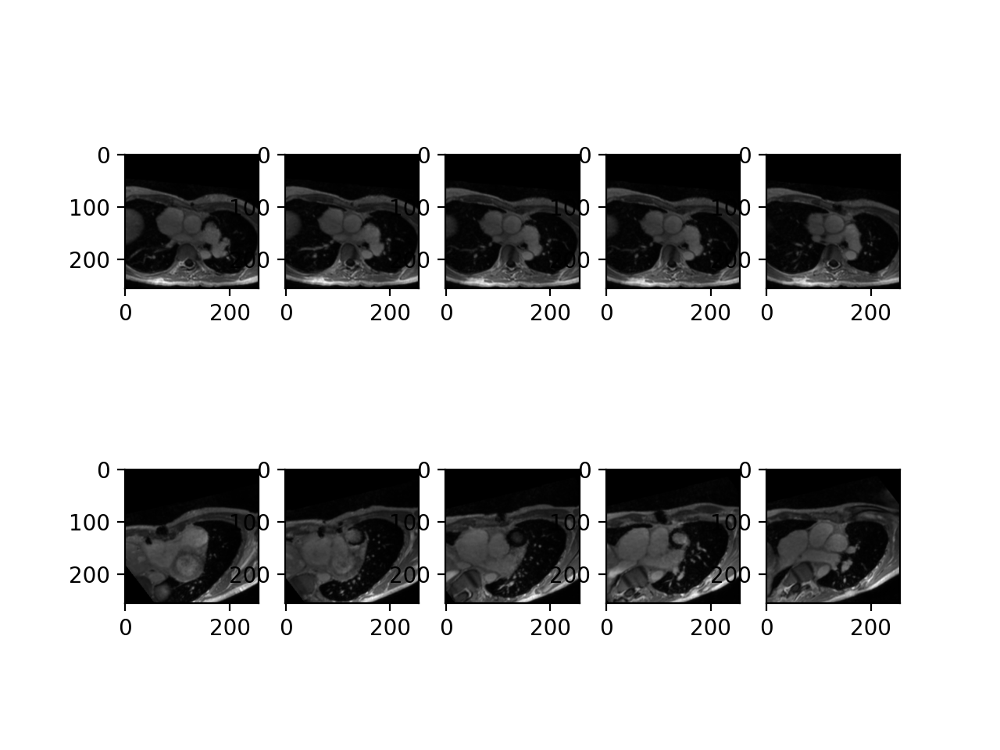

In [328]:
pid = 'Besapol'

plt.figure()

trial_slices = trial[pid]

for j in range(trial_slices.shape[-1]):
    for i in range(trial_slices.shape[-2]):
        ax = plt.subplot(2,5,i+1+j*5)

        ax.imshow(trial_slices[2,...,0,i,j], cmap='gray')

In [290]:
pid = 'Gajefe'

In [291]:
## deploy RGI for interpolation

flowecc = np.array(test_flw[pid])
flowshp = flowecc.shape
flowrows = np.arange(0, flowshp[0])
flowcols = np.arange(0, flowshp[1])
flowslices = np.arange(0, flowshp[2])
flowtimes = np.arange(0, flowshp[3])
flowchans = np.arange(0, flowshp[4])
flowecc[...,-1] = -flowecc[...,-1]
print('deploying rgi for {}...'.format(pid))
flowrgi = RGI((flowrows, flowcols, flowslices, flowtimes, flowchans), flowecc, bounds_error=False, fill_value=0)


deploying rgi for Gajefe...


In [292]:
## initialize holders for the data

DIM1, DIM2, DIM3, DIM4, DIM5, DIM6 = len(flowtimes),len(flowrows), len(flowcols), len(flowchans),5,2 # DIM4 refers to mag,x,y,z, DIM5 refers to the points in the spline and DIM6 refers to the specific spline (i.e. aorta vs pulmonary)
slices_over_time = np.zeros((DIM1, DIM2, DIM3, DIM4, DIM5))
slices_over_spline = np.zeros((DIM1, DIM2, DIM3, DIM4, DIM5,DIM6))
units = []
normals = []
COMs = []

In [294]:
## resample

prd_scales = np.array(info[pid]['scales'])

for sys_ch, system in enumerate(['Aorta','Pulmonary']):
    spline = all_splines[pid][system]
    unit = all_splines[pid][system+'_unit']

    for i in range(spline.shape[0]):
        pt = spline[i,...]
        s_x, s_y, s_z = (list(pt)/prd_scales).astype(int)

        Ainv_flow = info[pid]['metadata']['Ainv_flow']
        A_flow = info[pid]['metadata']['A_flow']

        flatn = np.array([0,0,1])
        rot3dto2d = rot(unit,flatn)

        RANGE = 256
        delta = 1.

        temp = np.ones((4,1))
        temp[0:3,0] = [s_x, s_y, s_z]
        coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
        coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)

        xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
        contained_x = np.ravel(xx2)
        contained_y = np.ravel(yy2)
        contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]

        rot2dto3d = rot(flatn,unit)
        pts = np.zeros((3, len(contained_x)))
        pts[0,:] = contained_x
        pts[1,:] = contained_y
        pts[2,:] = contained_z
        temp = np.matmul(rot2dto3d,pts)

        pts = np.ones((4, len(contained_x)))
        pts[0,:] = temp[0,:]
        pts[1,:] = temp[1,:]
        pts[2,:] = temp[2,:]
        pts = np.matmul(np.linalg.inv(A_flow),pts)
        pts = pts[0:-1,:]

        flow_rcs_sampled = pts.T

        for t in range(20):
            rgi_sampled = np.ones((len(contained_x),4))
            linpts = np.ones((len(flow_rcs_sampled), 5))
            linpts[:,0:3] = np.copy(flow_rcs_sampled)
            linpts[:,3] = t
            for c in range(4):
                linpts[:,4] = c
                rgi_sampled[:,c] = flowrgi(linpts)

            sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)
            slices_over_time[t,...,i] = sampled_slice[...]
    slices_over_spline[...,sys_ch] = slices_over_time[...]

<IPython.core.display.Javascript object>


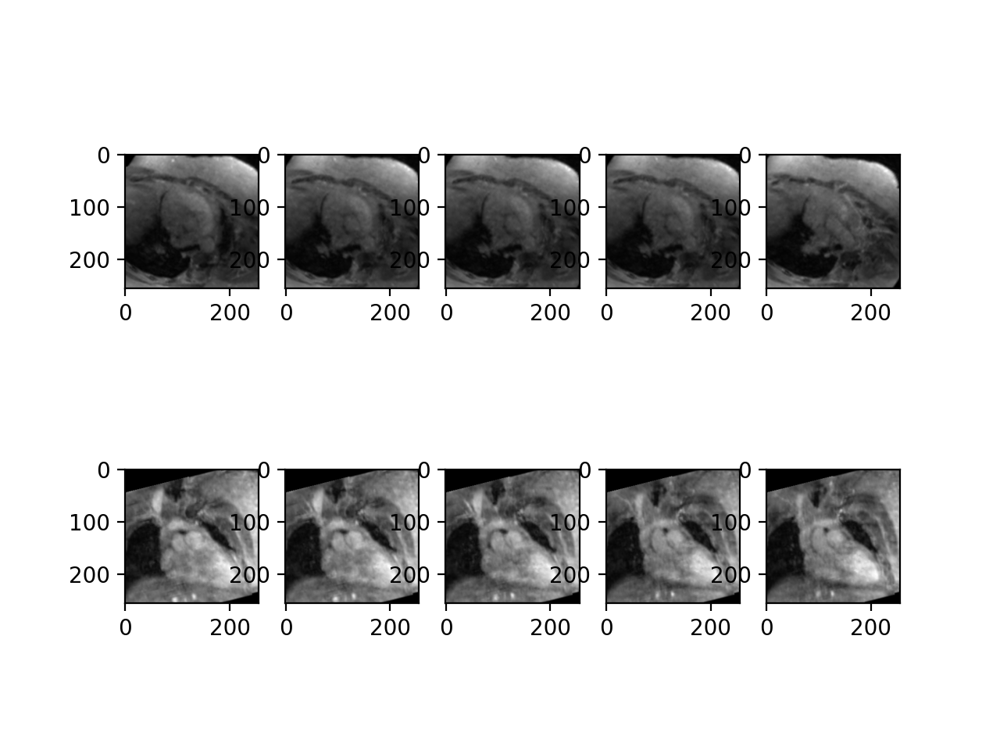

In [295]:
plt.figure()

for j in range(slices_over_spline.shape[-1]):
    for i in range(slices_over_time.shape[-1]):
        ax = plt.subplot(2,5,i+1+j*5)

        ax.imshow(slices_over_spline[2,...,0,i,j], cmap='gray')

<IPython.core.display.Javascript object>


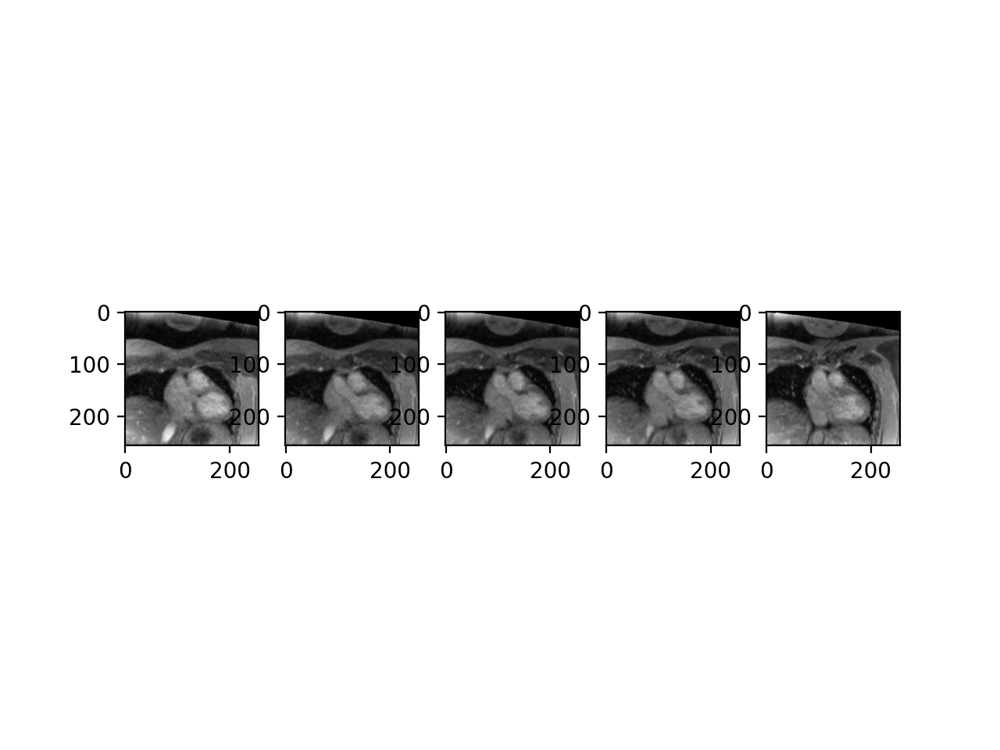

In [285]:
plt.figure()

for i in range(slices_over_time.shape[-1]):
    ax = plt.subplot(1,5,i+1)
    
    ax.imshow(slices_over_time[2,...,0,i], cmap='gray')

In [276]:
slices_over_spline.shape

(20, 256, 256, 4, 5, 2)

In [272]:
sampled_slice.shape

(256, 256, 4)

In [ ]:
s_x, s_y, s_z = (prd_COM/prd_scales).astype(int)
normal_ch,avg_normal_ch = extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, time)

normal = [test_flw[pid][s_x,s_y,s_z,time,1], test_flw[pid][s_x,s_y,s_z,time,2], -1*test_flw[pid][s_x,s_y,s_z,time,3]]
#             print(normal, normal_ch,avg_normal_ch)
normal = avg_normal_ch
unit = normal/np.linalg.norm(normal)

In [11]:
def _get_MAX(prd):
    return np.array(np.unravel_index(np.argmax(prd),prd.shape))

def _center_box_clean(prd):
    b = 45
    box = np.ones_like(prd)
    box[:b,:,:] = 0
    box[:,:b,:] = 0
    box[(192-b):,:,:] = 0
    box[:,(192-b):,:] = 0
    
    return box*prd

def midpoint_3d(point1, point2):
    """
    Calculate the midpoint between two points in 3D space.

    Parameters:
    point1 (list): A list of three coordinates [x, y, z] representing the first point.
    point2 (list): A list of three coordinates [x, y, z] representing the second point.

    Returns:
    list: A list of three coordinates representing the midpoint.
    """
    x_mid = (point1[0] + point2[0]) / 2
    y_mid = (point1[1] + point2[1]) / 2
    z_mid = (point1[2] + point2[2]) / 2

    return [x_mid, y_mid, z_mid]

def spline_3d_5pts(point1, point5):
    
    point3 = np.array(midpoint_3d(point1,point5))
    point2 = np.array(midpoint_3d(point1,point3))
    point4 = np.array(midpoint_3d(point3,point5))
        
    spline = np.zeros((5,3))
    for i,point in enumerate([point1,point2,point3,point4,point5]):
        spline[i,:] = point#np.around(point)
        
    return spline

def vector_from_points(point1, point2):
    """
    Calculate the vector from point1 to point2.

    Parameters:
    point1 (array-like): An array-like object with three coordinates representing the first point.
    point2 (array-like): An array-like object with three coordinates representing the second point.

    Returns:
    np.ndarray: A NumPy array representing the vector from point1 to point2.
    """
    # Convert points to NumPy arrays to ensure compatibility with NumPy operations
    p1 = np.array(point1)
    p2 = np.array(point2)
    
    # Calculate the vector from point1 to point2
    vector = p2 - p1
    
    return vector
    

    

In [224]:
for pid in all_splines:
    print(pid, 'Aorta')
    print(all_splines[pid]['Aorta'])
    print()
    print(pid, 'pulmonary')
    print(all_splines[pid]['Pulmonary'])
    print()

Besapol Aorta
[[ 75. 103.  34.]
 [ 75. 102.  33.]
 [ 74. 102.  32.]
 [ 74. 102.  32.]
 [ 74. 101.  31.]]

Besapol pulmonary
[[ 71. 125.  38.]
 [ 74. 122.  35.]
 [ 76. 118.  32.]
 [ 78. 115.  30.]
 [ 81. 112.  27.]]

Deefegi Aorta
[[92. 97. 30.]
 [92. 97. 29.]
 [92. 97. 28.]
 [91. 97. 28.]
 [91. 97. 27.]]

Deefegi pulmonary
[[ 83. 109.  29.]
 [ 85. 109.  28.]
 [ 87. 110.  28.]
 [ 89. 110.  27.]
 [ 91. 110.  26.]]

Dehithu Aorta
[[90. 97. 28.]
 [90. 96. 28.]
 [90. 96. 28.]
 [90. 96. 27.]
 [90. 95. 27.]]

Dehithu pulmonary
[[ 90. 111.  27.]
 [ 91. 111.  26.]
 [ 92. 110.  26.]
 [ 93. 110.  25.]
 [ 94. 110.  24.]]

Dukasa Aorta
[[ 92. 103.  32.]
 [ 92. 102.  31.]
 [ 93. 101.  30.]
 [ 94. 100.  30.]
 [ 94.  99.  29.]]

Dukasa pulmonary
[[ 87. 113.  29.]
 [ 89. 113.  28.]
 [ 90. 112.  28.]
 [ 92. 112.  28.]
 [ 94. 112.  27.]]

Fegaygun Aorta
[[ 86. 105.  30.]
 [ 86. 104.  30.]
 [ 86. 104.  30.]
 [ 86. 104.  29.]
 [ 86. 103.  29.]]

Fegaygun pulmonary
[[ 82. 117.  28.]
 [ 84. 116.  28.]
 [ 85.

In [164]:
maxes = np.zeros((8,3))
for ch in range(0,8):
    prd = test_prd[pid][0,...,ch]
    prd = _center_box_clean(prd)
    prd_MAX = _get_MAX(prd)
    maxes[ch,:] = prd_MAX
print(maxes)

[[ 94. 106.  34.]
 [ 92. 103.  32.]
 [ 94.  99.  29.]
 [113. 106.  20.]
 [ 87. 113.  29.]
 [ 94. 112.  27.]
 [ 94. 112.  27.]
 [ 97. 111.  26.]]


In [169]:
len(all_maxes.keys())

35

In [ ]:
plt.figure()
plt.suptitle(pid)

img = test_img[pid][2,...,0]
for ch in range(8):
    ax = plt.subplot(8,1,1+ch) 
    

In [ ]:
import matplotlib.pyplot as plt

%matplotlib notebook

plt.figure()
plt.suptitle(pid)

img = test_img[pid][2,...,0]

ax1 = plt.subplot(1,2,1)
z = int(prd_COM[-1])
ax1.imshow(img[...,z], cmap='gray', alpha=0.8)
ax1.imshow(prd[...,z], cmap='jet', alpha=0.2)
ax1.plot(int(prd_COM[-2]),int(prd_COM[-3]), marker="o", markersize=4, markerfacecolor="white")
ax1.set_title(prd_COM.astype(int))

ax2 = plt.subplot(1,2,2)
z = int(prd_MAX[-1])
ax2.imshow(img[...,z], cmap='gray', alpha=0.8)
ax2.imshow(prd[...,z], cmap='jet', alpha=0.2)
ax2.plot(int(prd_MAX[-2]),int(prd_MAX[-3]), marker="o", markersize=4, markerfacecolor="white")
ax2.set_title(prd_MAX)    

In [151]:
b = 45
box = np.ones_like(prd)
box[:b,:,:] = 0
box[:,:b,:] = 0
box[(192-b):,:,:] = 0
box[:,(192-b):,:] = 0

ch=6
prd = test_prd[pid][0,...,ch]
prd = box*prd

prd_COM = np.array(_get_COM(prd))
prd_MAX = np.array(np.unravel_index(np.argmax(prd),prd.shape))
print(prd_COM,prd_MAX)
# prd_COM = prd_MAX
prd_scales = np.array(info[pid]['scales'])

[ 94.52574438 106.33342157  24.19310108] [ 94 110  24]


<IPython.core.display.Javascript object>


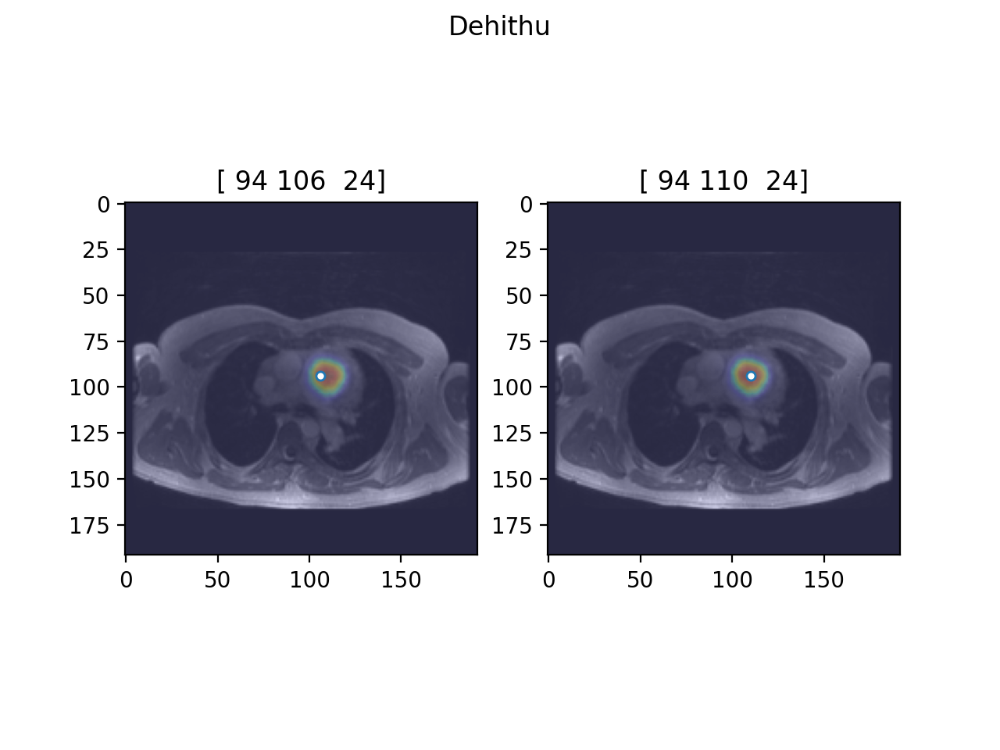

Text(0.5, 1.0, '[ 94 110  24]')

In [152]:
import matplotlib.pyplot as plt

%matplotlib notebook

plt.figure()
plt.suptitle(pid)

img = test_img[pid][2,...,0]

ax1 = plt.subplot(1,2,1)
z = int(prd_COM[-1])
ax1.imshow(img[...,z], cmap='gray', alpha=0.8)
ax1.imshow(prd[...,z], cmap='jet', alpha=0.2)
ax1.plot(int(prd_COM[-2]),int(prd_COM[-3]), marker="o", markersize=4, markerfacecolor="white")
ax1.set_title(prd_COM.astype(int))

ax2 = plt.subplot(1,2,2)
z = int(prd_MAX[-1])
ax2.imshow(img[...,z], cmap='gray', alpha=0.8)
ax2.imshow(prd[...,z], cmap='jet', alpha=0.2)
ax2.plot(int(prd_MAX[-2]),int(prd_MAX[-3]), marker="o", markersize=4, markerfacecolor="white")
ax2.set_title(prd_MAX)    

In [ ]:
problem_pids = []

b = 45
box = np.ones_like(prd)
box[:b,:,:] = 0
box[:,:b,:] = 0
box[(192-b):,:,:] = 0
box[:,(192-b):,:] = 0

for pid in tqdm(test_prd):
    try:
        flowecc = np.array(test_flw[pid])
        flowshp = flowecc.shape
        flowrows = np.arange(0, flowshp[0])
        flowcols = np.arange(0, flowshp[1])
        flowslices = np.arange(0, flowshp[2])
        flowtimes = np.arange(0, flowshp[3])
        flowchans = np.arange(0, flowshp[4])
        flowecc[...,-1] = -flowecc[...,-1]
        print('deploying rgi for {}...'.format(pid))
        flowrgi = RGI((flowrows, flowcols, flowslices, flowtimes, flowchans), flowecc, bounds_error=False, fill_value=0)

        time = 2 # time index from which to sample direction flow vector
        channels = [0,2,5,6]

        DIM1, DIM2, DIM3, DIM4, DIM5 = len(flowtimes),len(flowrows), len(flowcols), len(flowchans),4 # DIM4 refers to mag,x,y,z, DIM5 refers to the 4 landmarks i am sampling
        slice_over_time = np.zeros((DIM1, DIM2, DIM3, DIM4, DIM5))
        units = []
        normals = []
        COMs = []
        for i,ch in enumerate(channels):
            print('...reslicing channel:{}'.format(i))
            prd = test_prd[pid][0,...,ch]
            prd = box*prd

            prd_COM = np.array(_get_COM(prd))
            prd_MAX = np.array(np.unravel_index(np.argmax(prd),prd.shape))
        #     print(prd_COM,prd_MAX)
            prd_COM = prd_MAX
            prd_scales = np.array(info[pid]['scales'])

            s_x, s_y, s_z = (prd_COM/prd_scales).astype(int)
            normal_ch,avg_normal_ch = extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, time)

            normal = [test_flw[pid][s_x,s_y,s_z,time,1], test_flw[pid][s_x,s_y,s_z,time,2], -1*test_flw[pid][s_x,s_y,s_z,time,3]]
#             print(normal, normal_ch,avg_normal_ch)
            normal = avg_normal_ch
            unit = normal/np.linalg.norm(normal)

            Ainv_flow = info[pid]['metadata']['Ainv_flow']
            A_flow = info[pid]['metadata']['A_flow']

            flatn = np.array([0,0,1])
            rot3dto2d = rot(unit,flatn)

            RANGE = 256
            delta = 1.

            temp = np.ones((4,1))
            temp[0:3,0] = [s_x, s_y, s_z]
            coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
            coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)

            xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
            contained_x = np.ravel(xx2)
            contained_y = np.ravel(yy2)
            contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]

            rot2dto3d = rot(flatn,unit)
            pts = np.zeros((3, len(contained_x)))
            pts[0,:] = contained_x
            pts[1,:] = contained_y
            pts[2,:] = contained_z
            temp = np.matmul(rot2dto3d,pts)

            pts = np.ones((4, len(contained_x)))
            pts[0,:] = temp[0,:]
            pts[1,:] = temp[1,:]
            pts[2,:] = temp[2,:]
            pts = np.matmul(np.linalg.inv(A_flow),pts)
            pts = pts[0:-1,:]

            flow_rcs_sampled = pts.T

            for t in range(20):
                rgi_sampled = np.ones((len(contained_x),4))
                linpts = np.ones((len(flow_rcs_sampled), 5))
                linpts[:,0:3] = np.copy(flow_rcs_sampled)
                linpts[:,3] = t
                for c in range(4):
                    linpts[:,4] = c
                    rgi_sampled[:,c] = flowrgi(linpts)

                sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)
                slice_over_time[t,...,i] = sampled_slice[...]
            units.append(unit)
            normals.append(normal)
            COMs.append(prd_COM)
        
        print('...saving...')     
        with h5py.File(RESLICEPATH, 'a') as outh5:
            if pid not in outh5:
                outh5.create_dataset(pid, data=slice_over_time, compression='lzf', chunks=True,
                                    maxshape=(DIM1, DIM2, DIM3, DIM4, DIM5))
                outh5[pid].attrs['unit_normal'] = units
                outh5[pid].attrs['normal'] = normals
                outh5[pid].attrs['COM_3D'] = COMs
                print('SUCCESS @ {} {}'.format(pid,slice_over_time.shape))
    except:
        traceback.print_exc()
        print('FAILURE @ {}'.format(pid))
        problem_pids.append(pid)
    

In [20]:
FLOWMEASUREMENTSPATH = os.path.join(ANNOPATH,'Automated 4D Flow Shunt fraction.xlsx')

df = pd.read_excel(FLOWMEASUREMENTSPATH, header=0)
df.set_index('Phonetic', inplace=True)

df['AV_distance'] = None
df['Ao_distance'] = None
df['PV_distance'] = None
df['PA_distance'] = None
df.drop('Kubedi', inplace=True)

In [52]:
print(df)

              AV     Ao     PV     PA     Qp/Qs AV_distance Ao_distance  \
Phonetic                                                                  
Goxankot    5.31   5.64   6.90   6.79  1.250228        None        None   
Gajefe      5.60   6.75  10.04  10.06  1.627530        None        None   
Semagon     4.38   4.58   7.55   7.36  1.664062        None        None   
Fegaygun    4.90   4.77  11.29  11.38  2.344364        None        None   
Jefoje      3.60   3.90   3.70   3.60  0.973333        None        None   
Quiflula    6.80   6.60   9.80   9.90  1.470149        None        None   
Dukasa      4.81   4.67   9.20   9.73  1.996835        None        None   
Tibomol     9.00   8.35   8.31   8.94  0.994236        None        None   
Fenoopub    6.00   5.11   5.63   6.38  1.081008        None        None   
Mifoyeg     7.47   7.56  11.44  11.26  1.510313        None        None   
Motale      8.62   8.72   8.58   8.66  0.994233        None        None   
Repusug     4.03   5.30  

In [51]:
type(_get_distance(prd_xyz,lbl_xyz).item())

float

In [53]:
problem_pids = []

b = 45
box = np.ones_like(prd)
box[:b,:,:] = 0
box[:,:b,:] = 0
box[(192-b):,:,:] = 0
box[:,(192-b):,:] = 0

for pid in tqdm(test_prd):
    print(pid)
    time = 2 # time index from which to sample direction flow vector
    channels = [0,2,5,6]
    channel_names = ['AV_distance', 'Ao_distance', 'PV_distance', 'PA_distance']

#         DIM1, DIM2, DIM3, DIM4, DIM5 = len(flowtimes),len(flowrows), len(flowcols), len(flowchans),4
#         slice_over_time = np.zeros((DIM1, DIM2, DIM3, DIM4, DIM5))
#         units = []
#         normals = []
#         COMs = []
    for i,ch in enumerate(channels):
        prd = test_prd[pid][0,...,ch]
        prd = box*prd
        prd_COM = np.array(_get_COM(prd))
        prd_MAX = np.array(np.unravel_index(np.argmax(prd),prd.shape))
        prd_COM = prd_MAX

        lbl = test_lbl[pid][2,...,i]
        lbl = box*lbl
        lbl_COM = np.array(_get_COM(lbl))
        lbl_MAX = np.array(np.unravel_index(np.argmax(lbl),lbl.shape))
        lbl_COM = lbl_MAX
        
        scales = np.array(info[pid]['scales'])

        s_x, s_y, s_z = (prd_COM/scales).astype(int)
        l_x, l_y, l_z = (lbl_COM/scales).astype(int)

        A_flow = info[pid]['metadata']['A_flow']

        temp_prd = np.ones((4,1))
        temp_prd[0:3,0] = [s_x, s_y, s_z]
        prd_xyz = np.reshape(np.matmul(A_flow,temp_prd)[:-1,0],(3,))

        temp_lbl = np.ones((4,1))
        temp_lbl[0:3,0] = [l_x, l_y, l_z]
        lbl_xyz = np.reshape(np.matmul(A_flow,temp_lbl)[:-1,0],(3,))
        
        df.loc[pid, channel_names[i]] = _get_distance(prd_xyz,lbl_xyz).item()

        print(prd_xyz,lbl_xyz,_get_distance(prd_xyz,lbl_xyz))
    

  0%|                                                                                  | 0/35 [00:00<?, ?it/s]

Besapol
[ 39.14051848 -31.85942049  38.4371743 ] [ 40.54676504 -34.67192205  35.43717765] 7.218744767644665
[ 30.70303912 -37.48442361  63.93714581] [ 27.890546   -44.51567751  59.43715084] 14.343741990767057
[ 53.20298409 -31.85942049  81.9371257 ] [ 74.2966825  -50.14068062  42.93716927] 78.37491496708103


  3%|██                                                                        | 1/35 [00:03<02:08,  3.79s/it]

[ 51.79673753 -23.42191581  81.9371257 ] [ 63.04671001 -40.29692517  68.43714078] 41.624966755001154
Deefegi
[ 16.40651848 -33.35940802  53.1090509 ] [  0.93780632 -34.7656588   53.1090509 ] 16.874962946100027
[  0.93780632 -29.14065568  77.10904132] [-10.31216617 -38.98441114  77.10904132] 21.093727941300017
[ 22.03150473 -30.54690646  84.60903832] [ 16.40651848 -55.85942049  72.60904311] 42.937495482980836


  6%|████▏                                                                     | 2/35 [00:07<02:12,  4.01s/it]

[ 24.84399785 -29.14065568  80.10904012] [ 16.40651848 -50.23441737  77.10904132] 32.531239858495226
Dehithu
[ 10.89744762 -72.1008985   53.62538742] [  2.69436559 -96.71039068  41.62542767] 44.81253395842768
[ -7.14933284 -80.30406256  68.62533711] [  -7.14933284 -103.27292193   49.12540252] 42.46879395919497
[ 22.38176246 -73.74153131  83.62528679] [  35.50669371 -104.91355474   53.62538742] 74.2968540470692


  9%|██████▎                                                                   | 3/35 [00:11<02:08,  4.01s/it]

[ 25.66299528 -72.1008985   79.12530189] [ 24.02237887 -90.14785943  79.12530189] 19.68757733800001
Dukasa
[ 15.23476504 -23.51565256  57.74989461] [ 22.26599785 -30.54690646  50.24988862] 21.562492688523974
[  2.578546   -23.51565256  77.24991018] [ -7.26517992 -34.7656588   81.74991377] 25.593735753014414
[ 26.48473753 -23.51565256  86.24991737] [ 32.10972377 -46.01566503  77.24991018] 37.12500590002877


 11%|████████▍                                                                 | 4/35 [00:15<01:59,  3.85s/it]

[ 26.48473753 -23.51565256  86.24991737] [ 26.48473753 -33.35940802  86.24991737] 9.843755456499991
Fegaygun
[ 13.44975129 -38.65690585   7.59574843] [  9.23101161 -49.90687833   7.59574843] 15.468712166600028
[  2.1997788  -44.28189209  25.79563396] [ -3.42520744 -55.53186458  28.59561635] 19.67494111713711
[ 23.29347721 -40.06315241  32.79558994] [ 20.48098409 -55.53186458  35.59557233] 21.081187677737105


 14%|██████████▌                                                               | 5/35 [00:19<01:57,  3.91s/it]

[ 23.29347721 -40.06315241  32.79558994] [ 23.29347721 -58.3443577   32.79558994] 18.28120528779999
Fenoopub
[ 16.7771367  -44.82103908   1.633     ] [ 21.11308006 -56.3835547   -9.567     ] 27.098458982999986
[  2.32399217 -53.49292579  40.833     ] [ -0.56663673 -65.05544142  32.433     ] 22.85314453000001
[ 25.44902342 -44.82103908  32.433     ] [ 37.01153904 -72.28201368  15.633     ] 55.82349023100001


 17%|████████████▋                                                             | 6/35 [00:23<01:52,  3.86s/it]

[ 26.89433787 -47.71166798  35.233     ] [ 26.89433787 -54.93824025  32.433     ] 10.026572265000013
Fratalooy
[  9.96051637 -73.53842975  42.37543774] [ 11.60113278 -88.30412506  42.37543774] 16.406311714000026
[ -3.16441487 -78.46032818  72.37533711] [ -1.52379847 -88.30412506  60.37537736] 23.484373026427647
[ 29.64791325 -62.05400006  72.37533711] [  42.77284449 -104.71045318   57.37538742] 70.78133404553459


 20%|██████████████▊                                                           | 7/35 [00:27<01:47,  3.85s/it]

[ 29.64791325 -62.05400006  75.37532704] [ 29.64791325 -73.53842975  67.8753522 ] 18.98440452676728
Gajefe
[ 28.27879681 -49.88512506  71.57165618] [ 20.07563275 -63.01018755  68.77164944] 24.12823329757302
[ 11.87246869 -56.4476563   96.77171685] [  6.95057025 -67.93208599  88.37169663] 24.806348344719098
[ 39.76322649 -54.80702349 113.5717573 ] [ 34.84132806 -89.26031254  88.37169663] 64.57524816215731


 23%|████████████████▉                                                         | 8/35 [00:31<01:44,  3.89s/it]

[ 39.76322649 -54.80702349 105.17173708] [ 38.12259368 -76.13525005  99.5717236 ] 28.568872851146082
Giretap
[  3.94792532 -17.34357624  86.17669565] [  2.77604993 -27.89045475  88.97670435] 14.518762596652195
[ -5.4270778  -18.51545163  94.57672174] [ -8.94270397 -31.40608092 111.37677391] 33.20630763531301
[ 19.18230539 -27.89045475 116.9767913 ] [ 14.49480383 -45.4685856  100.17673913] 39.06568458581306


 26%|███████████████████                                                       | 9/35 [00:34<01:40,  3.85s/it]

[ 21.52605617 -30.23420553 114.17678261] [ 16.83855461 -37.26545787 111.37677391] 14.518762596652167
Goxankot
[  4.09895931 -32.76107818 165.29765409] [  4.09895931 -46.0423438  162.49767044] 16.08124926779874
[ -2.5416735  -32.76107818 183.4975478 ] [ -6.52605319 -50.02672349 183.4975478 ] 21.250024991999965
[ 17.38022493 -32.76107818 190.49750692] [ 20.03647805 -54.01110317 183.4975478 ] 30.90623723549686


 29%|████████████████████▊                                                    | 10/35 [00:38<01:35,  3.82s/it]

[ 17.38022493 -30.10482506 190.49750692] [ 17.38022493 -44.71421724 193.29749057] 17.409375829798734
Hetero
[  4.92176504 -34.79689209  44.98758113] [  0.70302536 -43.23437146  47.78756604] 15.456203951060388
[ -0.7032212  -34.79689209  58.98750566] [-10.54694712 -51.67185082  68.78745283] 36.51863182121136
[ 16.17173753 -34.79689209  68.78745283] [ 23.20297033 -53.07809738  61.78749057] 32.31240035495097


 31%|██████████████████████▉                                                  | 11/35 [00:42<01:31,  3.81s/it]

[ 17.57798409 -31.98439897  72.98743019] [ 16.17173753 -43.23437146  72.98743019] 12.656219045400007
Hudutre
[ 17.29382072 -48.35384599  63.0425838 ] [ 17.29382072 -57.26007677  63.0425838 ] 8.906230778399987
[  2.45010275 -52.80696138  91.04246089] [ -2.00301264 -64.68193575  98.04243017] 23.32805903414304
[ 32.13753868 -46.86947419  98.04243017] [ 35.10628227 -70.61942293  86.84247933] 37.91864317318881


 34%|█████████████████████████                                                | 12/35 [00:46<01:27,  3.82s/it]

[ 32.13753868 -46.86947419  98.04243017] [ 29.16879509 -58.74444856  98.04243017] 14.843717964000007
Jefoje
[ 48.39451848 -25.51566503  59.63943593] [ 51.20701161 -26.92191581  49.13946527] 14.718714559382619
[ 32.92580632 -38.17192205  80.63937725] [ 28.70706664 -43.79692517  71.6394024 ] 18.84371765009942
[ 56.83199785 -29.73441737 103.13931437] [ 56.83199785 -42.39067439  80.63937725] 35.156194141248506


 37%|███████████████████████████                                              | 13/35 [00:50<01:23,  3.79s/it]

[ 54.01950473 -26.92191581 100.13932275] [ 55.42575129 -42.39067439  83.63936886] 33.374959027315555
Kohugonk
[ -9.02230631 -53.39781256 129.6127522 ] [ -7.69417975 -73.31971099 129.6127522 ] 21.250024991999993
[-16.99106568 -57.38219225 150.61262956] [-18.31919225 -68.00720474 171.61250692] 32.953016416490556
[  2.93083275 -56.05406568 160.41257233] [ 18.86835149 -82.61659692 136.61271132] 66.29991099028928


 40%|█████████████████████████████▏                                           | 14/35 [00:53<01:19,  3.78s/it]

[  2.93083275 -57.38219225 164.6125478 ] [  4.25895931 -64.02282506 160.41257233] 12.168734843698104
Mifoyeg
[  7.26603912 -54.54690646  52.53670314] [  7.26603912 -60.17190958  45.53674403] 12.624962237496888
[ -3.98393336 -54.54690646  76.33656415] [-15.23390585 -68.60941425  83.33652327] 32.31243939929686
[ 12.89102536 -54.54690646  87.53649874] [ 17.10976504 -65.7969127   80.53653962] 22.46870503729687


 43%|███████████████████████████████▎                                         | 15/35 [00:57<01:15,  3.75s/it]

[ 15.70351848 -54.54690646  87.53649874] [ 15.70351848 -58.7656588   83.33652327] 8.418727810198135
Motale
[  9.959982   -51.78849224  33.18769497] [  3.39751637 -63.27292193  33.18769497] 18.046895308000018
[ -1.52433284 -50.14785943  60.1875478 ] [ -8.08679847 -66.55418755  67.68750692] 30.46875286349683
[ 23.08491325 -56.71039068  60.1875478 ] [ 18.16306403 -86.2417813   48.18761321] 46.45317442519496


 46%|█████████████████████████████████▎                                       | 16/35 [01:01<01:11,  3.74s/it]

[ 28.00676246 -53.42912506  60.1875478 ] [ 23.08491325 -66.55418755  63.18753145] 21.04689536179872
Mozufuck
[ 16.17180632 -61.23437146  57.61279308] [ 14.76555976 -83.73431642  74.41269497] 40.70609341699246
[ -6.32813865 -80.9218233   81.41265409] [  3.51558727 -93.57804235  92.61258868] 33.69987956079497
[ 37.26550473 -44.35941273  92.61258868] [ 38.67175129 -83.73431642  95.41257233] 43.58113390519877


 49%|███████████████████████████████████▍                                     | 17/35 [01:04<01:06,  3.70s/it]

[ 31.64051848 -48.57815241  88.41261321] [ 40.07799785 -80.9218233   92.61258868] 44.981125729098125
Narikag
[ 13.35911263 -86.32848235  71.25034847] [   9.9216192  -108.67223437   47.25042699] 49.78116691919266
[ -3.82835454 -88.04723251  90.75028466] [ -17.57832828 -101.79723375   86.25029939] 31.999960252073663
[ 20.2340995  -86.32848235 105.75023558] [  16.79660606 -124.14098576   78.75032393] 68.24990849644172


 51%|█████████████████████████████████████▌                                   | 18/35 [01:08<01:01,  3.63s/it]

[ 20.2340995  -86.32848235 105.75023558] [  16.79660606 -101.79723375   93.75027485] 30.906205563796334
Natotag
[ 12.08751848 -45.43939897 105.88951462] [  0.837546   -65.12685082 117.08946784] 42.13737754957427
[-10.41242649 -49.65813865 135.28939181] [ -9.00617992 -65.12685082 132.48940351] 19.674947031293584
[ 17.71250473 -44.03315241 139.48937427] [ 31.77497033 -72.15808362 124.0894386 ] 57.58733249051464


 54%|███████████████████████████████████████▋                                 | 19/35 [01:11<00:57,  3.60s/it]

[ 19.11875129 -44.03315241 139.48937427] [ 24.74373753 -62.3143577  135.28939181] 28.10617398634031
Noukumu
[ 34.02602811 -28.1685381  144.658     ] [ 25.82290194 -39.10603966 111.058     ] 52.740627732800036
[  8.0494619  -51.41072892 150.258     ] [ 14.88540038 -50.04354122 122.258     ] 36.20312617120001
[ 44.96352967 -28.1685381  175.458     ] [ 51.79946815 -62.34823048 102.658     ] 113.815630856


 57%|█████████████████████████████████████████▋                               | 20/35 [01:15<00:55,  3.67s/it]

[ 35.3932158 -28.1685381 172.658    ] [ 50.43228045 -65.08260587 125.058     ] 99.55313241760003
Nuebafru
[ -2.1022     -70.6038     109.21212914] [ -0.6959     -81.8542      96.61214464] 25.256684503311263
[-23.1967     -79.0416     133.01209987] [-18.9778     -88.8857     113.41212397] 33.66297589403973
[  9.1482     -70.6038     140.01209126] [  11.9608     -100.1361      123.21211192] 49.144879337748364


 60%|███████████████████████████████████████████▊                             | 21/35 [01:19<00:52,  3.77s/it]

[  9.1482     -70.6038     133.01209987] [ 11.9608     -98.7298     120.41211536] 43.53858450331127
Okiegop
[ 27.96834375 -66.78154375  74.98762956] [ 21.7183625  -85.5314875   60.98771132] 38.999843238993705
[ 15.46838125 -71.46902969  88.9875478 ] [ 12.34339063 -85.5314875   77.78761321] 28.38738302869494
[ 46.7182875  -69.90653438  95.98750692] [ 48.28078281 -91.78146875  84.78757233] 34.637364278694946


 63%|█████████████████████████████████████████████▉                           | 22/35 [01:23<00:50,  3.85s/it]

[ 43.59329687 -69.90653438  95.98750692] [ 52.96826875 -88.65647813  88.9875478 ] 35.12487474449685
Quiflula
[-17.14803826 -54.96098701  40.48767044] [-34.96049982 -62.38284599  33.48771132] 32.23427965829687
[-15.66366647 -50.50787162  47.48762956] [-46.83547419 -60.89847419  57.28757233] 51.3623530664956
[-17.14803826 -62.38284599  68.48750692] [-23.08552545 -84.64842293  54.48758868] 42.202982370593716


 66%|███████████████████████████████████████████████▉                         | 23/35 [01:27<00:46,  3.91s/it]

[-17.14803826 -65.35158958  68.48750692] [-17.14803826 -74.25782036  61.4875478 ] 15.906189897896837
Quisculjug
[  5.8        -60.879       69.99485094] [ 12.8315    -58.0664     53.1948283] 26.644122641509455
[ -5.4504     -60.879       88.19487547] [-16.7008     -69.3168      90.99487925] 22.488203773584928
[ 18.4567     -60.879       95.19488491] [ 17.0504     -77.7546      90.99487925] 22.481905660377336


 69%|██████████████████████████████████████████████████                       | 24/35 [01:31<00:41,  3.80s/it]

[ 18.4567     -62.2853      95.19488491] [ 18.4567     -66.5042      97.99488868] 7.018903773584924
Repusug
[  0.79246713 -26.22677958  87.68774194] [  9.69871572 -35.13302818  70.88770968] 34.6125294404645
[-11.08253099 -33.64865341 101.68776882] [ 12.66746525 -38.10177771  70.88770968] 59.00317967858493
[ 18.60496431 -23.25803005 115.6877957 ] [ 27.5112129  -45.52365153 101.68776882] 45.17189695092043


 71%|████████████████████████████████████████████████████▏                    | 25/35 [01:34<00:36,  3.70s/it]

[ 15.63621478 -20.28928052 124.08781183] [ 36.41746149 -52.94552536  93.28775269] 84.23755068698495
Retasu
[ 17.46082072 -58.10177771 101.01248706] [ 20.42956431 -65.52365153  89.81257176] 21.590532712917664
[ -1.83601264 -64.03927677 123.41231765] [ -7.77349982 -71.46115059 122.01232824] 14.759350423364708
[ 23.3983079  -59.58615247 126.21229647] [ 23.3983079  -78.88302442 119.21234941] 26.29681900642352


 74%|██████████████████████████████████████████████████████▏                  | 26/35 [01:38<00:32,  3.61s/it]

[ 23.3983079  -64.03927677 123.41231765] [ 21.91393611 -71.46115059 123.41231765] 8.906245622400007
Sacureed
[-20.39015241 -50.7656588  155.61262956] [-44.29634394 -56.39066192 148.61267044] 36.53115376769685
[ -9.14017992 -49.35940802 162.61258868] [-44.29634394 -45.14065568 172.41253145] 49.17485912079559
[-37.26511114 -50.7656588  176.61250692] [-42.89009738 -74.67192205 165.41257233] 40.731184085094924


 77%|████████████████████████████████████████████████████████▎                | 27/35 [01:41<00:28,  3.58s/it]

[-35.85886458 -50.7656588  176.61250692] [-27.42138521 -67.64066815 172.41253145] 29.5124641892981
Scoostepip
[ 12.89051848 -47.51565256 122.85042767] [ 10.07802536 -54.54690646 120.05043774] 12.64373695580693
[ -2.57819368 -53.14065568 148.05033711] [ -6.79693336 -62.98441114 143.8503522 ] 18.26248004396038
[ 18.51550473 -47.51565256 155.05031195] [ 19.92175129 -65.7969127  150.85032704] 23.88749159976038


 80%|██████████████████████████████████████████████████████████▍              | 28/35 [01:45<00:25,  3.61s/it]

[ 19.92175129 -47.51565256 155.05031195] [ 19.92175129 -62.98441114 150.85032704] 19.668743480160373
Semagon
[  8.78884565 -27.13302818 159.725     ] [ 10.27322042 -31.58615247 142.925     ] 22.73749906080002
[  2.85134659 -27.13302818 170.925     ] [-10.5080263  -37.52365153 187.725     ] 40.54999624320001
[ 25.11696807 -30.10177771 187.725     ] [ 20.66384377 -50.88302442 170.925     ] 42.0343710084


 83%|████████████████████████████████████████████████████████████▍            | 29/35 [01:48<00:21,  3.60s/it]

[ 20.66384377 -27.13302818 190.525     ] [ 22.14821854 -55.33614871 168.125     ] 52.08749530400004
Sifaci
[ 23.04634375 -54.92236875 -38.20239106] [ 12.10887656 -70.5473375  -42.7023743 ] 31.062419177723484
[  1.17140937 -68.98484062  -5.20251397] [ -8.2035625  -81.48481562   8.29743575] 35.37489659567041
[ 29.296325   -56.48486562  -5.20251397] [ 30.85882031 -92.42229375 -26.20243575] 58.499845225209526


 86%|██████████████████████████████████████████████████████████████▌          | 30/35 [01:52<00:17,  3.56s/it]

[ 29.296325   -51.797375    -0.70253073] [ 32.42131563 -87.73480312 -21.70245251] 60.06234053770952
Tasnicu
[ 19.53137188 -65.0315      31.42541258] [ 10.1564     -71.2815      27.22542767] 19.824956780660386
[  3.90641875 -66.594       52.42533711] [ -7.03104844 -72.844       59.42531195] 24.18744203026729
[ 28.90634375 -69.719       59.42531195] [ 22.6563625  -88.469       52.42533711] 31.999956092767277


 89%|████████████████████████████████████████████████████████████████▋        | 31/35 [01:55<00:14,  3.55s/it]

[ 25.78135313 -66.594       59.42531195] [ 24.21885781 -75.969       59.42531195] 10.937495312499976
Tesrenil
[ 25.20124998 -89.23926564  89.69114177] [ 22.31062108 -93.575209    78.4911519 ] 18.426562138417694
[   7.85747655 -103.69241017   92.49113924] [  -3.70503908 -121.03618361  100.89113165] 37.30628146506331
[ 26.64656444 -87.79395119 117.69111646] [  33.8731367  -110.91898244  109.29112405] 38.75159591806329


 91%|██████████████████████████████████████████████████████████████████▋      | 32/35 [01:59<00:10,  3.59s/it]

[ 26.64656444 -89.23926564 123.29111139] [  22.31062108 -100.80178126  117.69111646] 21.49845391970885
Tibomol
[-13.42027677 -80.77452536  50.15188354] [ -7.48277771 -86.71202442  47.35188101] 14.675000653245547
[-31.23277395 -89.68077395  75.35190633] [-37.17027301 -97.10264778  66.95189873] 21.759380481736713
[ -1.54527865 -83.74327489  80.95191139] [   2.90784565 -108.9776459    64.1518962 ] 46.48751049387346


 94%|████████████████████████████████████████████████████████████████████▊    | 33/35 [02:03<00:07,  3.68s/it]

[ -1.54527865 -79.29015059  80.95191139] [ -1.54527865 -98.58702254  75.35190633] 24.89687701089116
Tiheerien
[  9.99176504 -41.22794712 146.17458037] [  9.99176504 -49.66542649 139.67461411] 14.937445621268722
[ -6.88319368 -49.66542649 173.47443865] [-11.10193336 -55.29041273 166.97447239] 16.343692181868704
[ 21.24173753 -41.22794712 179.97440491] [ 26.86672377 -69.35287833 156.57452638] 57.14979598200739


 97%|██████████████████████████████████████████████████████████████████████▉  | 34/35 [02:07<00:03,  3.71s/it]

[ 21.24173753 -41.22794712 176.07442515] [ 21.24173753 -55.29041273 173.47443865] 16.662452109067488
Urquidash
[  9.10151848 -43.08017992  47.06272201] [  4.8827788  -58.54889209  57.56266038] 30.18739021317988
[  0.66403912 -44.48642649  69.56258994] [ -6.36719368 -58.54889209  80.0625283 ] 31.593636773779863
[ 21.75773753 -44.48642649  77.06254591] [ 23.16398409 -65.58012489  72.56257233] 26.999918554505655


100%|█████████████████████████████████████████████████████████████████████████| 35/35 [02:10<00:00,  3.74s/it]

[ 23.16398409 -43.08017992  77.06254591] [ 21.75773753 -54.33015241  80.0625283 ] 15.656201435337124


In [58]:
df['AV_distance'] = pd.to_numeric(df['AV_distance'], errors='coerce')
df['Ao_distance'] = pd.to_numeric(df['Ao_distance'], errors='coerce')
df['PV_distance'] = pd.to_numeric(df['PV_distance'], errors='coerce')
df['PA_distance'] = pd.to_numeric(df['PA_distance'], errors='coerce')


In [75]:
df[['AV_distance', 'Ao_distance', 'PV_distance', 'PA_distance']].describe()

,AV_distance,Ao_distance,PV_distance,PA_distance
count,35.000000,35.000000,35.000000,35.000000
mean,24.597226,29.399822,46.436800,27.521357
std,11.785952,10.545710,19.532351,20.747879
min,7.218745,14.343742,21.081188,7.018904
25%,15.462458,21.504703,33.474882,14.681240
50%,21.562493,28.387383,42.202982,19.687577
75%,31.648349,34.537388,57.368564,32.953099
max,52.740628,59.003180,113.815631,99.553132


Text(0.5, 1.0, 'Distance between Ground Truth and CNN Localization')

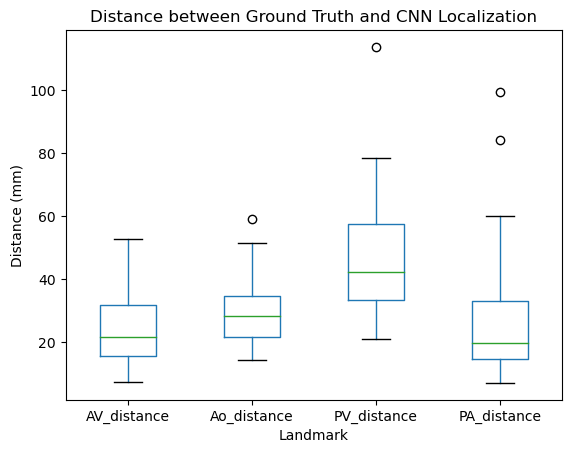

In [74]:
plt = df.boxplot(column=['AV_distance', 'Ao_distance', 'PV_distance', 'PA_distance'],grid=False)
plt.set_xlabel('Landmark')
plt.set_ylabel('Distance (mm)')
plt.set_title('Distance between Ground Truth and CNN Localization')



In [19]:
test_prd[pid].shape

(1, 192, 192, 64, 8)

In [245]:
pid = 'Hetero'

In [246]:
flowecc = np.array(test_flw[pid])

In [247]:
flowshp = flowecc.shape
flowrows = np.arange(0, flowshp[0])
flowcols = np.arange(0, flowshp[1])
flowslices = np.arange(0, flowshp[2])
flowtimes = np.arange(0, flowshp[3])
flowchans = np.arange(0, flowshp[4])

In [248]:
flowecc[...,-1] = -flowecc[...,-1]

In [249]:
print('deploying rgi...')
flowrgi = RGI((flowrows, flowcols, flowslices, flowtimes, flowchans), flowecc, bounds_error=False, fill_value=0)

deploying rgi...


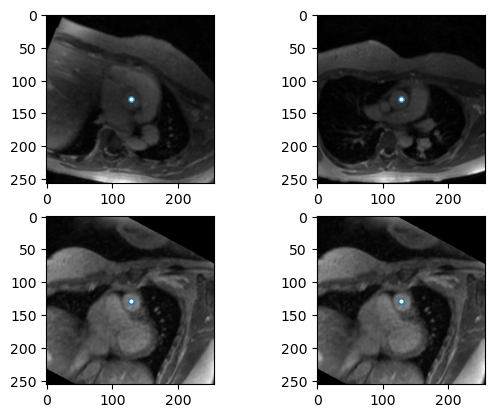

In [237]:
time = 2
ch = 6
channels = [0,2,5,6]

slice_over_time = np.zeros((len(flowtimes),len(flowrows), len(flowcols), len(flowchans),4))
plt.figure()
for i,ch in enumerate(channels):
    prd = test_prd[pid][0,...,ch]
    
    b = 45
    box = np.ones_like(prd)
    box[:b,:,:] = 0
    box[:,:b,:] = 0
    box[(192-b):,:,:] = 0
    box[:,(192-b):,:] = 0

    prd = box*prd
    
    prd_COM = np.array(_get_COM(prd))
    prd_MAX = np.array(np.unravel_index(np.argmax(prd),prd.shape))
#     print(prd_COM,prd_MAX)
    prd_COM = prd_MAX
    prd_scales = np.array(info[pid]['scales'])
    
    s_x, s_y, s_z = (prd_COM/prd_scales).astype(int)
    normal_ch,avg_normal_ch = extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, time)
    
    normal = [test_flw[pid][s_x,s_y,s_z,time,1], test_flw[pid][s_x,s_y,s_z,time,2], 1*test_flw[pid][s_x,s_y,s_z,time,3]]
#     print(normal, normal_ch,avg_normal_ch)
    normal = avg_normal_ch
    unit = normal/np.linalg.norm(normal)
    
    Ainv_flow = info[pid]['metadata']['Ainv_flow']
    A_flow = info[pid]['metadata']['A_flow']
    
    flatn = np.array([0,0,1])
    rot3dto2d = rot(unit,flatn)
    
    RANGE = 256
    delta = 1.
    
    temp = np.ones((4,1))
    temp[0:3,0] = [s_x, s_y, s_z]
    coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
    coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)
    
    xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
    contained_x = np.ravel(xx2)
    contained_y = np.ravel(yy2)
    contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]
    
    rot2dto3d = rot(flatn,unit)
    pts = np.zeros((3, len(contained_x)))
    pts[0,:] = contained_x
    pts[1,:] = contained_y
    pts[2,:] = contained_z
    temp = np.matmul(rot2dto3d,pts)
    
    pts = np.ones((4, len(contained_x)))
    pts[0,:] = temp[0,:]
    pts[1,:] = temp[1,:]
    pts[2,:] = temp[2,:]
    pts = np.matmul(np.linalg.inv(A_flow),pts)
    pts = pts[0:-1,:]
    
    flow_rcs_sampled = pts.T
    
    rgi_sampled = np.ones((len(contained_x),4))
    for c in range(4):
        linpts = np.ones((len(flow_rcs_sampled), 5))
        linpts[:,0:3] = np.copy(flow_rcs_sampled)
        linpts[:,3] = t
        linpts[:,4] = c
        rgi_sampled[:,c] = flowrgi(linpts)

    sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)

    ax = plt.subplot(2,2,i+1)
    ax.imshow(sampled_slice[...,0], cmap='gray')
    ax.plot(128,128, marker="o", markersize=4, markerfacecolor="white")
    

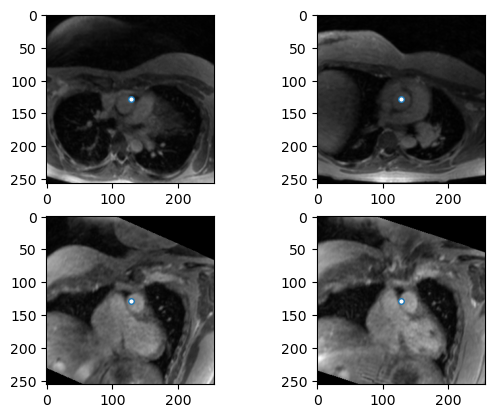

In [235]:
time = 2
ch = 6
channels = [0,2,5,6]

slice_over_time = np.zeros((len(flowtimes),len(flowrows), len(flowcols), len(flowchans),4))
plt.figure()
for i,ch in enumerate(channels):
    prd = test_prd[pid][0,...,ch]
    
    b = 45
    box = np.ones_like(prd)
    box[:b,:,:] = 0
    box[:,:b,:] = 0
    box[(192-b):,:,:] = 0
    box[:,(192-b):,:] = 0

    prd = box*prd
    
    prd_COM = np.array(_get_COM(prd))
    prd_MAX = np.array(np.unravel_index(np.argmax(prd),prd.shape))
#     print(prd_COM,prd_MAX)
#     prd_COM = prd_MAX
    prd_scales = np.array(info[pid]['scales'])
    
    s_x, s_y, s_z = (prd_COM/prd_scales).astype(int)
    normal_ch,avg_normal_ch = extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, time)
    
    normal = [test_flw[pid][s_x,s_y,s_z,time,1], test_flw[pid][s_x,s_y,s_z,time,2], 1*test_flw[pid][s_x,s_y,s_z,time,3]]
#     print(normal, normal_ch,avg_normal_ch)
    normal = avg_normal_ch
    unit = normal/np.linalg.norm(normal)
    
    Ainv_flow = info[pid]['metadata']['Ainv_flow']
    A_flow = info[pid]['metadata']['A_flow']
    
    flatn = np.array([0,0,1])
    rot3dto2d = rot(unit,flatn)
    
    RANGE = 256
    delta = 1.
    
    temp = np.ones((4,1))
    temp[0:3,0] = [s_x, s_y, s_z]
    coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
    coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)
    
    xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
    contained_x = np.ravel(xx2)
    contained_y = np.ravel(yy2)
    contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]
    
    rot2dto3d = rot(flatn,unit)
    pts = np.zeros((3, len(contained_x)))
    pts[0,:] = contained_x
    pts[1,:] = contained_y
    pts[2,:] = contained_z
    temp = np.matmul(rot2dto3d,pts)
    
    pts = np.ones((4, len(contained_x)))
    pts[0,:] = temp[0,:]
    pts[1,:] = temp[1,:]
    pts[2,:] = temp[2,:]
    pts = np.matmul(np.linalg.inv(A_flow),pts)
    pts = pts[0:-1,:]
    
    flow_rcs_sampled = pts.T
    
    rgi_sampled = np.ones((len(contained_x),4))
    for c in range(4):
        linpts = np.ones((len(flow_rcs_sampled), 5))
        linpts[:,0:3] = np.copy(flow_rcs_sampled)
        linpts[:,3] = t
        linpts[:,4] = c
        rgi_sampled[:,c] = flowrgi(linpts)

    sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)

    ax = plt.subplot(2,2,i+1)
    ax.imshow(sampled_slice[...,0], cmap='gray')
    ax.plot(128,128, marker="o", markersize=4, markerfacecolor="white")
    

In [256]:
test_flw[pid].shape

(256, 256, 160, 20, 4)

In [259]:
print(np.amax(test_flw[pid][...,3,-1]))
print(np.amin(test_flw[pid][...,3,-1]))

1574
-1583


In [250]:
time = 2
ch = 6
channels = [0,2,5,6]

slice_over_time = np.zeros((len(flowtimes),len(flowrows), len(flowcols), len(flowchans),4))
plt.figure()
for i,ch in enumerate(channels):
    prd = test_prd[pid][0,...,ch]
    
    b = 45
    box = np.ones_like(prd)
    box[:b,:,:] = 0
    box[:,:b,:] = 0
    box[(192-b):,:,:] = 0
    box[:,(192-b):,:] = 0

    prd = box*prd
    
    prd_COM = np.array(_get_COM(prd))
    prd_MAX = np.array(np.unravel_index(np.argmax(prd),prd.shape))
#     print(prd_COM,prd_MAX)
    prd_COM = prd_MAX
    prd_scales = np.array(info[pid]['scales'])
    
    s_x, s_y, s_z = (prd_COM/prd_scales).astype(int)
    normal_ch,avg_normal_ch = extract_and_average_vector(test_flw, pid, s_x, s_y, s_z, time)
    
    normal = [test_flw[pid][s_x,s_y,s_z,time,1], test_flw[pid][s_x,s_y,s_z,time,2], -1*test_flw[pid][s_x,s_y,s_z,time,3]]
    print(normal, normal_ch,avg_normal_ch)
    normal = avg_normal_ch
    unit = normal/np.linalg.norm(normal)
    
    Ainv_flow = info[pid]['metadata']['Ainv_flow']
    A_flow = info[pid]['metadata']['A_flow']
    
    flatn = np.array([0,0,1])
    rot3dto2d = rot(unit,flatn)
    
    RANGE = 256
    delta = 1.
    
    temp = np.ones((4,1))
    temp[0:3,0] = [s_x, s_y, s_z]
    coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
    coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)
    
    xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
    contained_x = np.ravel(xx2)
    contained_y = np.ravel(yy2)
    contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]
    
    rot2dto3d = rot(flatn,unit)
    pts = np.zeros((3, len(contained_x)))
    pts[0,:] = contained_x
    pts[1,:] = contained_y
    pts[2,:] = contained_z
    temp = np.matmul(rot2dto3d,pts)
    
    pts = np.ones((4, len(contained_x)))
    pts[0,:] = temp[0,:]
    pts[1,:] = temp[1,:]
    pts[2,:] = temp[2,:]
    pts = np.matmul(np.linalg.inv(A_flow),pts)
    pts = pts[0:-1,:]
    
    flow_rcs_sampled = pts.T
    
#     rgi_sampled = np.ones((len(contained_x),4))
#     for c in range(4):
#         linpts = np.ones((len(flow_rcs_sampled), 5))
#         linpts[:,0:3] = np.copy(flow_rcs_sampled)
#         linpts[:,3] = t
#         linpts[:,4] = c
#         rgi_sampled[:,c] = flowrgi(linpts)

#     sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)

#     ax = plt.subplot(2,2,i+1)
#     ax.imshow(sampled_slice[...,0], cmap='gray')
#     ax.plot(128,128, marker="o", markersize=4, markerfacecolor="white")
    
                               
    for t in range(20):
        rgi_sampled = np.ones((len(contained_x),4))
        linpts = np.ones((len(flow_rcs_sampled), 5))
        linpts[:,0:3] = np.copy(flow_rcs_sampled)
        linpts[:,3] = t
        for c in range(4):
            linpts[:,4] = c
            rgi_sampled[:,c] = flowrgi(linpts)

        sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)
        slice_over_time[t,...,i] = sampled_slice[...]

[-244, -183, 281] [-244, -183, 281] [-253.84615384615384, -180.73076923076923, 277.61538461538464]
[-125, -99, 340] [-125, -99, 340] [-124.73076923076923, -99.34615384615384, 315.4230769230769]
[-88, 308, 186] [-88, 308, 186] [-87.6923076923077, 317.8076923076923, 197.3846153846154]
[-77, 207, 114] [-77, 207, 114] [-75.8076923076923, 237.19230769230768, 141.92307692307693]


<Figure size 640x480 with 0 Axes>

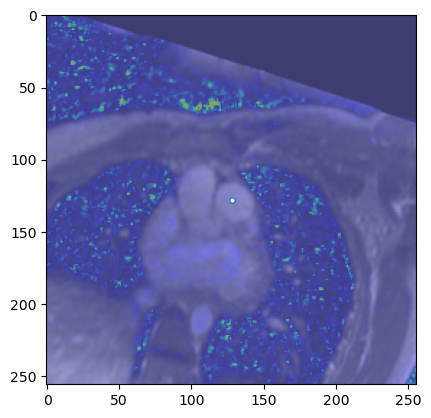

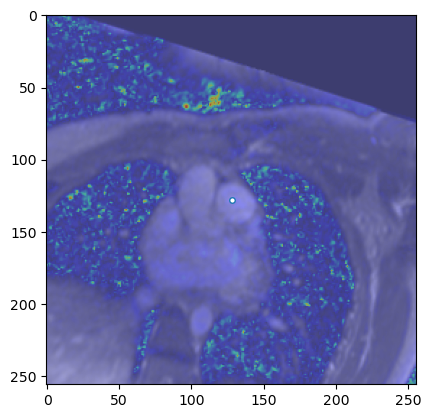

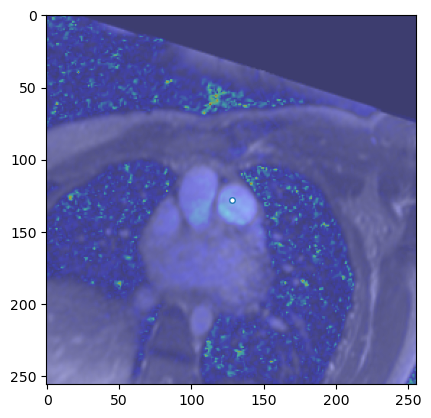

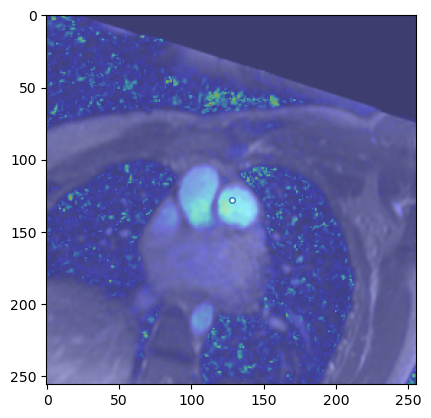

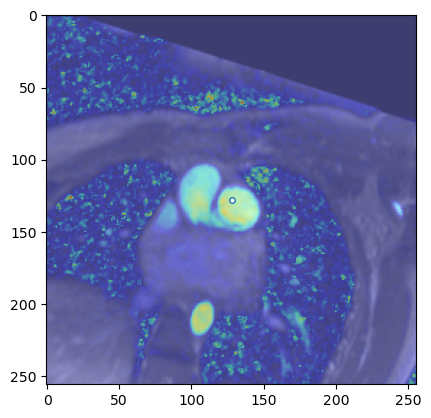

...

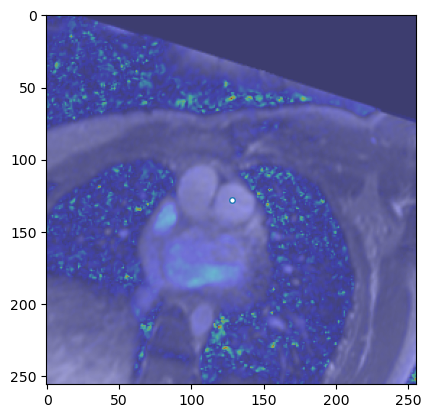

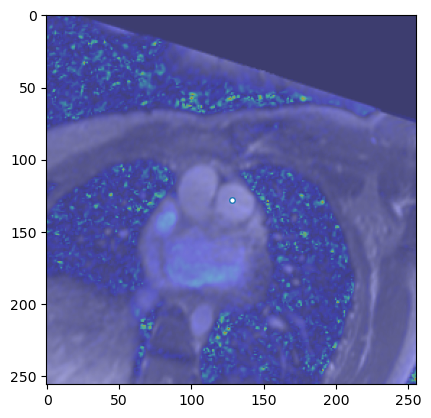

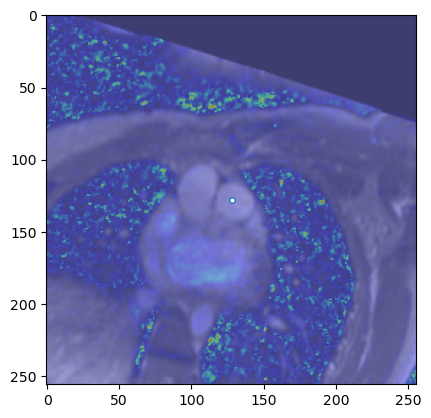

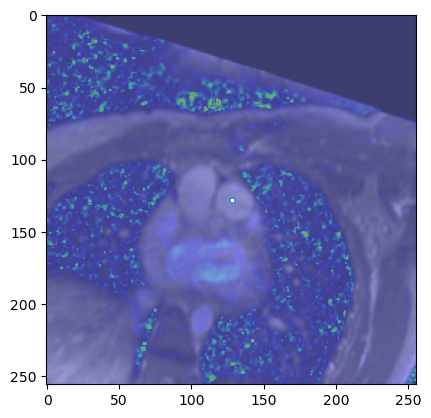

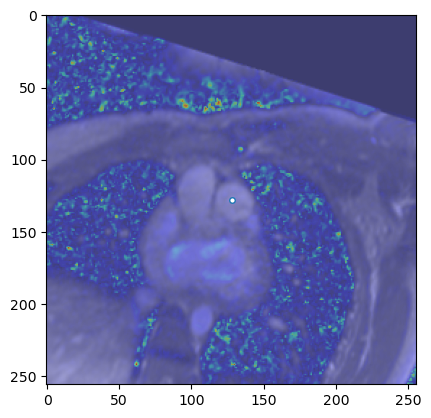

In [251]:
for i in range(slice_over_time.shape[0]):
    plt.figure()
    landmark = 3
    speed = np.sqrt(slice_over_time[i, ..., 1, landmark]**2 + slice_over_time[i, ..., 2, landmark]**2 + slice_over_time[i, ..., 3, landmark]**2)
    speed = exposure.rescale_intensity(speed, in_range=(np.amin(speed),np.amax(speed)), out_range=(0.0,1.0))
 
    plt.imshow(slice_over_time[i,...,0,landmark], cmap='gray', alpha=0.6)
    plt.imshow(speed, cmap='jet' , alpha=0.4)
    
    plt.plot(128,128, marker="o", markersize=4, markerfacecolor="white")

In [131]:
slice_over_time.shape

(20, 256, 256, 4, 4)

In [126]:
(len(flowrows), len(flowcols), len(flowtimes), len(flowchans))

(256, 256, 20, 4)

In [124]:
rgi_sampled.shape

(65536, 5)

[-43, -5, -82] [-43, -5, -82] [-47.0, -5.411764705882353, -90.41176470588235]
[120, 113, 479] [120, 113, 479] [135.03846153846155, 133.15384615384616, 506.46153846153845]
[52, 206, 99] [52, 206, 99] [50.30769230769231, 202.03846153846155, 84.84615384615384]
[36, 420, 191] [36, 420, 191] [47.96153846153846, 397.0769230769231, 176.84615384615384]


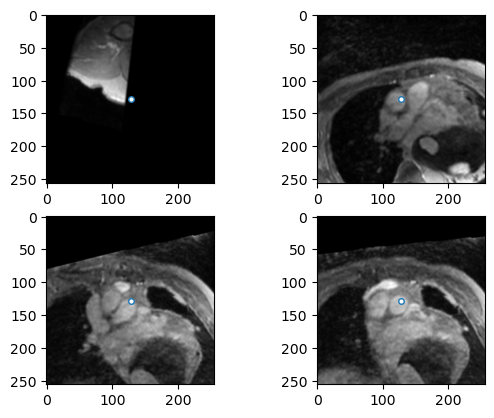

In [121]:
    ax = plt.subplot(2,2,i+1)
    ax.imshow(sampled_slice[...,0], cmap='gray')
    ax.plot(128,128, marker="o", markersize=4, markerfacecolor="white")

In [ ]:
%matplotlib notebook
for pid in tqdm(prd_data):
    print('working on',pid)
    flowecc = copy.deepcopy(np.array(flowdata[pid]))
    flowshp = flowecc.shape
    flowrows = np.arange(0, flowshp[0])
    flowcols = np.arange(0, flowshp[1])
    flowslices = np.arange(0, flowshp[2])
    flowtimes = np.arange(0, flowshp[3])
    flowchans = np.arange(0, flowshp[4])
    flowecc[...,-1] = -flowecc[...,-1]
    print('deploying rgi...')
    flowrgi = RGI((flowrows, flowcols, flowslices, flowtimes, flowchans), flowecc, bounds_error=False, fill_value=0)

    t = 3
    ch = 6
    channels = [0,2,5,6]
    plt.figure()
    for i,ch in enumerate(channels):
        pulled = _pull_one_img(prd_data[pid],t,ch)
        pulled = _clean_pred(pulled,0.1)
        print(pulled.shape)

        pulled_COM = np.array(_get_COM(pulled))
        print(pulled_COM)

        pulled_scales = np.array(extra_info[pid]['scales'])
        print(pulled_scales)
        
        s_x, s_y, s_z = (pulled_COM/pulled_scales).astype(int)
        print(s_x, s_y, s_z)
        
        vec = [flowdata[pid][s_x,s_y,s_z,t,1], flowdata[pid][s_x,s_y,s_z,t,2], -1*flowdata[pid][s_x,s_y,s_z,t,3]]
        #vec = np.append(vec, [1])
        print(vec)
        normal = vec
        unit = normal/np.linalg.norm(normal)
        print(unit)
        
        Ainv_flow = allmeta[pid]['Ainv_flow']
        A_flow = allmeta[pid]['A_flow']
        print(Ainv_flow, '\n')
        print(A_flow)
        
        flatn = np.array([0,0,1])
        rot3dto2d = rot(unit,flatn)
        print(rot3dto2d)
        
        RANGE = 256
        delta = 1.

        temp = np.ones((4,1))
        temp[0:3,0] = [s_x, s_y, s_z]
        coord_xyz = np.reshape(np.matmul(A_flow,temp)[:-1,0],(3,))
        coord_xyz_2d = np.matmul(rot3dto2d, coord_xyz)
        print(temp)
        print(coord_xyz)
        print(coord_xyz_2d)
        
        xx2, yy2, zz2 = np.meshgrid(np.arange(-RANGE//2*delta+coord_xyz_2d[0],RANGE//2*delta+coord_xyz_2d[0],delta),np.arange(-RANGE//2*delta+coord_xyz_2d[1],RANGE//2*delta+coord_xyz_2d[1],delta), np.arange(0,1,1), indexing='xy')
        contained_x = np.ravel(xx2)
        contained_y = np.ravel(yy2)
        contained_z = np.ones((len(contained_x))) * coord_xyz_2d[-1]
        
        rot2dto3d = rot(flatn,unit)
        pts = np.zeros((3, len(contained_x)))
        pts[0,:] = contained_x
        pts[1,:] = contained_y
        pts[2,:] = contained_z
        temp = np.matmul(rot2dto3d,pts)
        
        pts = np.ones((4, len(contained_x)))
        pts[0,:] = temp[0,:]
        pts[1,:] = temp[1,:]
        pts[2,:] = temp[2,:]
        pts = np.matmul(np.linalg.inv(A_flow),pts)
        pts = pts[0:-1,:]
        
        flow_rcs_sampled = pts.T

        rgi_sampled = np.ones((len(contained_x),4))
        for c in range(4):
            linpts = np.ones((len(flow_rcs_sampled), 5))
            linpts[:,0:3] = np.copy(flow_rcs_sampled)
            linpts[:,3] = t
            linpts[:,4] = c
            rgi_sampled[:,c] = flowrgi(linpts)

        sampled_slice = np.reshape(rgi_sampled, (len(flowrows), len(flowcols), len(flowchans))).astype(np.int16)
        
        ax = plt.subplot(2,2,i+1)
        ax.imshow(sampled_slice[...,0], cmap='gray')
        ax.plot(128,128, marker="o", markersize=4, markerfacecolor="white")
        